### Preparation du dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
data = pd.read_csv('/content/consommation-quotidienne-brute@reseaux-energies-rte.csv')
data.head()

,Date - Heure,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Statut - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Statut - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Statut - RTE,Consommation brute totale (MW)
0,2024-10-31T23:30:00+01:00,31/10/2024,23:30,NaN,NaN,NaN,NaN,NaN,47110,Consolidé,NaN
1,2024-10-31T23:00:00+01:00,31/10/2024,23:00,30998.0,Meilleur Statut,1734.0,Définitif,32732.0,47753,Consolidé,80485.0
2,2024-10-31T22:30:00+01:00,31/10/2024,22:30,NaN,NaN,NaN,NaN,NaN,48552,Consolidé,NaN
3,2024-10-31T22:00:00+01:00,31/10/2024,22:00,33674.0,Meilleur Statut,1867.0,Définitif,35541.0,47498,Consolidé,83039.0
4,2024-10-31T21:30:00+01:00,31/10/2024,21:30,NaN,NaN,NaN,NaN,NaN,46852,Consolidé,NaN


In [ ]:
data.tail()

,Date - Heure,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Statut - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Statut - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Statut - RTE,Consommation brute totale (MW)
225019,2012-01-01T02:00:00+01:00,01/01/2012,02:00,52251.0,Définitif,3214.0,Définitif,55465.0,55531,Définitif,110996.0
225020,2012-01-01T01:30:00+01:00,01/01/2012,01:30,NaN,NaN,NaN,NaN,NaN,56075,Définitif,NaN
225021,2012-01-01T01:00:00+01:00,01/01/2012,01:00,52236.0,Définitif,3208.0,Définitif,55444.0,56230,Définitif,111674.0
225022,2012-01-01T00:30:00+01:00,01/01/2012,00:30,NaN,NaN,NaN,NaN,NaN,58314,Définitif,NaN
225023,2012-01-01T00:00:00+01:00,01/01/2012,00:00,52099.0,Définitif,3254.0,Définitif,55353.0,59610,Définitif,114963.0


In [ ]:
data.columns

Index(['Date - Heure', 'Date', 'Heure',
       'Consommation brute gaz (MW PCS 0°C) - GRTgaz', 'Statut - GRTgaz',
       'Consommation brute gaz (MW PCS 0°C) - Teréga', 'Statut - Teréga',
       'Consommation brute gaz totale (MW PCS 0°C)',
       'Consommation brute électricité (MW) - RTE', 'Statut - RTE',
       'Consommation brute totale (MW)'],
      dtype='object')

In [ ]:
data.shape

(225024, 11)

In [ ]:
# verifier s'il exist des valeurs dupliquer
data.duplicated().sum()

0

In [ ]:
# verifier s'il exist des valeurs null
data.isna().sum()

,0
Date - Heure,0
Date,0
Heure,0
Consommation brute gaz (MW PCS 0°C) - GRTgaz,112512
Statut - GRTgaz,111792
Consommation brute gaz (MW PCS 0°C) - Teréga,112515
Statut - Teréga,112512
Consommation brute gaz totale (MW PCS 0°C),112516
Consommation brute électricité (MW) - RTE,0
Statut - RTE,0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225024 entries, 0 to 225023
Data columns (total 11 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   Date - Heure                                  225024 non-null  object 
 1   Date                                          225024 non-null  object 
 2   Heure                                         225024 non-null  object 
 3   Consommation brute gaz (MW PCS 0°C) - GRTgaz  112512 non-null  float64
 4   Statut - GRTgaz                               113232 non-null  object 
 5   Consommation brute gaz (MW PCS 0°C) - Teréga  112509 non-null  float64
 6   Statut - Teréga                               112512 non-null  object 
 7   Consommation brute gaz totale (MW PCS 0°C)    112508 non-null  float64
 8   Consommation brute électricité (MW) - RTE     225024 non-null  int64  
 9   Statut - RTE                                  22

In [ ]:
data.Date.value_counts()

,count
Date,
04/12/2022,49
05/12/2020,49
04/12/2023,49
20/03/2016,48
14/04/2016,48
...,...
19/07/2020,48
20/07/2020,48
06/12/2020,47


In [ ]:
# garder seulement la data en heure depuis une heure a l'autre car tous les heures et demis sont nulls
data_filtred = data[data['Heure'].str.match(r'.*:00$')]
data_filtred.head()

,Date - Heure,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Statut - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Statut - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Statut - RTE,Consommation brute totale (MW)
1,2024-10-31T23:00:00+01:00,31/10/2024,23:00,30998.0,Meilleur Statut,1734.0,Définitif,32732.0,47753,Consolidé,80485.0
3,2024-10-31T22:00:00+01:00,31/10/2024,22:00,33674.0,Meilleur Statut,1867.0,Définitif,35541.0,47498,Consolidé,83039.0
5,2024-10-31T21:00:00+01:00,31/10/2024,21:00,37801.0,Meilleur Statut,1969.0,Définitif,39770.0,47832,Consolidé,87602.0
7,2024-10-31T20:00:00+01:00,31/10/2024,20:00,40558.0,Meilleur Statut,2094.0,Définitif,42652.0,50389,Consolidé,93041.0
9,2024-10-31T19:00:00+01:00,31/10/2024,19:00,41563.0,Meilleur Statut,2188.0,Définitif,43751.0,53387,Consolidé,97138.0


In [ ]:
data_filtred.shape

(112512, 11)

In [ ]:
data_filtred.isna().sum()

,0
Date - Heure,0
Date,0
Heure,0
Consommation brute gaz (MW PCS 0°C) - GRTgaz,97
Statut - GRTgaz,48
Consommation brute gaz (MW PCS 0°C) - Teréga,99
Statut - Teréga,0
Consommation brute gaz totale (MW PCS 0°C),100
Consommation brute électricité (MW) - RTE,0
Statut - RTE,0


In [ ]:
data_filtred[data_filtred['Consommation brute gaz totale (MW PCS 0°C)'].isna()][48:]

,Date - Heure,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Statut - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Statut - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Statut - RTE,Consommation brute totale (MW)
33408,2022-12-05T23:00:00+01:00,05/12/2022,23:00,NaN,Définitif,NaN,Définitif,NaN,64773,Définitif,NaN
33410,2022-12-05T22:00:00+01:00,05/12/2022,22:00,NaN,Définitif,NaN,Définitif,NaN,66052,Définitif,NaN
33412,2022-12-05T21:00:00+01:00,05/12/2022,21:00,NaN,Définitif,NaN,Définitif,NaN,64997,Définitif,NaN
33414,2022-12-05T20:00:00+01:00,05/12/2022,20:00,NaN,Définitif,NaN,Définitif,NaN,68215,Définitif,NaN
33416,2022-12-05T19:00:00+01:00,05/12/2022,19:00,NaN,Définitif,NaN,Définitif,NaN,72563,Définitif,NaN
33418,2022-12-05T18:00:00+01:00,05/12/2022,18:00,NaN,Définitif,NaN,Définitif,NaN,75060,Définitif,NaN
33420,2022-12-05T17:00:00+01:00,05/12/2022,17:00,NaN,Définitif,NaN,Définitif,NaN,71944,Définitif,NaN
33422,2022-12-05T16:00:00+01:00,05/12/2022,16:00,NaN,Définitif,NaN,Définitif,NaN,67908,Définitif,NaN
33424,2022-12-05T15:00:00+01:00,05/12/2022,15:00,NaN,Définitif,NaN,Définitif,NaN,66976,Définitif,NaN
33426,2022-12-05T14:00:00+01:00,05/12/2022,14:00,NaN,Définitif,NaN,Définitif,NaN,67653,Définitif,NaN


In [ ]:
data_filtred.drop(['Statut - GRTgaz', 'Statut - Teréga', 'Statut - RTE'], axis=1, inplace=True)
data_filtred

<ipython-input-314-f29584e69722>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtred.drop(['Statut - GRTgaz', 'Statut - Teréga', 'Statut - RTE'], axis=1, inplace=True)


,Date - Heure,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW)
1,2024-10-31T23:00:00+01:00,31/10/2024,23:00,30998.0,1734.0,32732.0,47753,80485.0
3,2024-10-31T22:00:00+01:00,31/10/2024,22:00,33674.0,1867.0,35541.0,47498,83039.0
5,2024-10-31T21:00:00+01:00,31/10/2024,21:00,37801.0,1969.0,39770.0,47832,87602.0
7,2024-10-31T20:00:00+01:00,31/10/2024,20:00,40558.0,2094.0,42652.0,50389,93041.0
9,2024-10-31T19:00:00+01:00,31/10/2024,19:00,41563.0,2188.0,43751.0,53387,97138.0
...,...,...,...,...,...,...,...,...
225015,2012-01-01T04:00:00+01:00,01/01/2012,04:00,53745.0,3337.0,57082.0,49160,106242.0
225017,2012-01-01T03:00:00+01:00,01/01/2012,03:00,52836.0,3212.0,56048.0,52496,108544.0
225019,2012-01-01T02:00:00+01:00,01/01/2012,02:00,52251.0,3214.0,55465.0,55531,110996.0
225021,2012-01-01T01:00:00+01:00,01/01/2012,01:00,52236.0,3208.0,55444.0,56230,111674.0


In [ ]:
data_filtred.to_csv('data_filtred.csv', index=False)

In [ ]:
data_filtred.head()

,Date - Heure,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW)
1,2024-10-31T23:00:00+01:00,31/10/2024,23:00,30998.0,1734.0,32732.0,47753,80485.0
3,2024-10-31T22:00:00+01:00,31/10/2024,22:00,33674.0,1867.0,35541.0,47498,83039.0
5,2024-10-31T21:00:00+01:00,31/10/2024,21:00,37801.0,1969.0,39770.0,47832,87602.0
7,2024-10-31T20:00:00+01:00,31/10/2024,20:00,40558.0,2094.0,42652.0,50389,93041.0
9,2024-10-31T19:00:00+01:00,31/10/2024,19:00,41563.0,2188.0,43751.0,53387,97138.0


<Axes: >

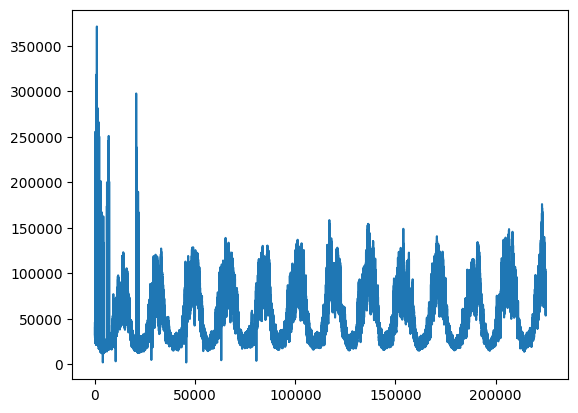

In [ ]:
data_filtred['Consommation brute gaz totale (MW PCS 0°C)'].plot()

In [ ]:
data_filtred['Consommation brute gaz totale (MW PCS 0°C)'].hist()

<Axes: >

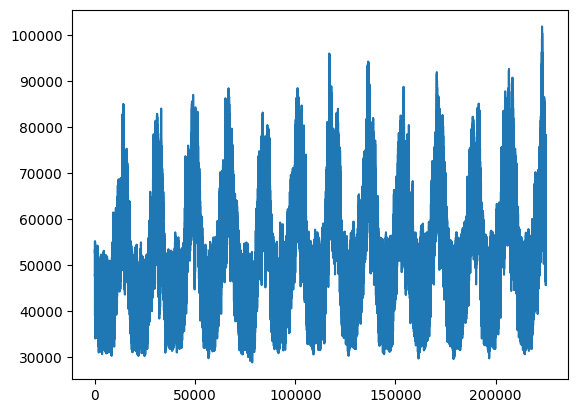

In [ ]:
data_filtred['Consommation brute électricité (MW) - RTE'].plot()

<Axes: >

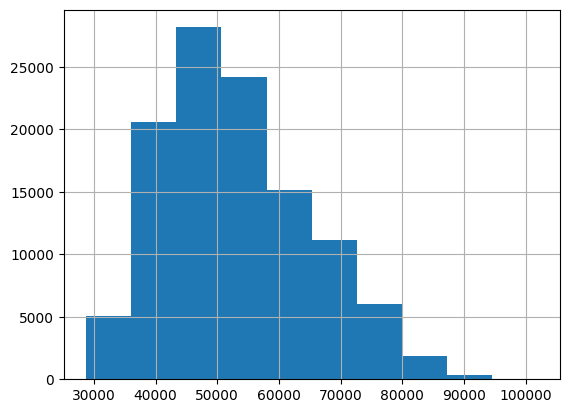

In [ ]:
data_filtred['Consommation brute électricité (MW) - RTE'].hist()

<Axes: >

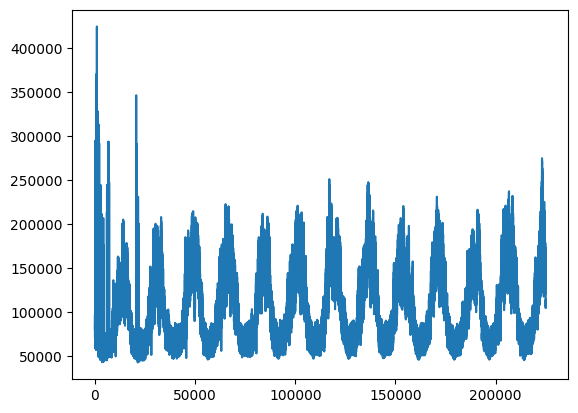

In [ ]:
data_filtred['Consommation brute totale (MW)'].plot()

In [ ]:
data_filtred['Consommation brute totale (MW)'].hist()

In [ ]:
data_filtred.Date.value_counts()

,count
Date,
04/12/2022,25
05/12/2020,25
04/12/2023,25
20/03/2016,24
14/04/2016,24
...,...
19/07/2020,24
20/07/2020,24
06/12/2020,23


##### ***il ya le probleme des jours faut le fixer pour que tous les jours ont 24h et pas 25 ou 23***

In [ ]:
data_filtred['Date - Heure'].value_counts()

,count
Date - Heure,
2012-03-25T03:00:00+02:00,2
2023-03-26T03:00:00+02:00,2
2022-03-27T03:00:00+02:00,2
2017-03-26T03:00:00+02:00,2
2023-12-04T00:00:00+01:00,2
...,...
2020-07-22T05:00:00+02:00,1
2020-07-22T06:00:00+02:00,1
2020-07-22T07:00:00+02:00,1


In [ ]:
# identifier les dates dupliquer
duplicates = data_filtred['Date - Heure'].value_counts()
duplicates[duplicates > 1].index

Index(['2012-03-25T03:00:00+02:00', '2023-03-26T03:00:00+02:00',
       '2022-03-27T03:00:00+02:00', '2017-03-26T03:00:00+02:00',
       '2023-12-04T00:00:00+01:00', '2013-03-31T03:00:00+02:00',
       '2022-12-04T00:00:00+01:00', '2020-12-05T00:00:00+01:00',
       '2015-03-29T03:00:00+02:00', '2016-03-27T03:00:00+02:00',
       '2020-03-29T03:00:00+02:00', '2019-03-31T03:00:00+02:00',
       '2018-03-25T03:00:00+02:00', '2014-03-30T03:00:00+02:00',
       '2021-03-28T03:00:00+02:00', '2024-03-31T03:00:00+02:00'],
      dtype='object', name='Date - Heure')

In [ ]:
data_filtred.shape

(112512, 8)

In [ ]:
data_filtred['Date - Heure'].duplicated().sum()

16

In [ ]:
# Identifier les valeurs dupliquées dans la colonne "Date - Heure" et afficiher leurs valeurs corespondant
data_filtred[data_filtred.duplicated(subset=['Date - Heure'], keep=False)]

,Date - Heure,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW)
10314,2024-03-31T03:00:00+02:00,31/03/2024,03:00,32084.0,1924.0,34008.0,46419,80427.0
10315,2024-03-31T03:00:00+02:00,31/03/2024,02:00,31511.0,162.0,31673.0,46419,78092.0
15982,2023-12-04T00:00:00+01:00,04/12/2023,00:00,59430.0,3667.0,63097.0,64171,127268.0
15983,2023-12-04T00:00:00+01:00,04/12/2023,00:00,NaN,NaN,NaN,61954,NaN
28122,2023-03-26T03:00:00+02:00,26/03/2023,02:00,39575.0,153.0,39728.0,45221,84949.0
28123,2023-03-26T03:00:00+02:00,26/03/2023,03:00,41557.0,1827.0,43384.0,45221,88605.0
33502,2022-12-04T00:00:00+01:00,04/12/2022,00:00,NaN,NaN,NaN,57335,NaN
33503,2022-12-04T00:00:00+01:00,04/12/2022,00:00,63371.0,3680.0,67051.0,59811,126862.0
45594,2022-03-27T03:00:00+02:00,27/03/2022,03:00,39119.0,2344.0,41463.0,46101,87564.0
45595,2022-03-27T03:00:00+02:00,27/03/2022,02:00,1680.0,197.0,1877.0,46101,47978.0


In [ ]:
# Supprimer 2 ligne dupliquer et qui sont nulls
data_filtred.drop(index=[33502, 15983], inplace=True)
data_filtred['Date - Heure'].duplicated().sum()

<ipython-input-322-b20ab58ebf13>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtred.drop(index=[33502, 15983], inplace=True)


14

In [ ]:
# supprimer le colonne 'Date - Heure' et creer un nouveau colonne
data_filtred.drop('Date - Heure', axis=1, inplace=True)
data_filtred.head()

<ipython-input-323-5f48be26ab48>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtred.drop('Date - Heure', axis=1, inplace=True)


,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW)
1,31/10/2024,23:00,30998.0,1734.0,32732.0,47753,80485.0
3,31/10/2024,22:00,33674.0,1867.0,35541.0,47498,83039.0
5,31/10/2024,21:00,37801.0,1969.0,39770.0,47832,87602.0
7,31/10/2024,20:00,40558.0,2094.0,42652.0,50389,93041.0
9,31/10/2024,19:00,41563.0,2188.0,43751.0,53387,97138.0


In [ ]:
data_filtred['Date - Heure'] = data_filtred['Date'] + ' ' + data_filtred['Heure']
data_filtred.head()

<ipython-input-324-3f05423db5a1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtred['Date - Heure'] = data_filtred['Date'] + ' ' + data_filtred['Heure']


,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date - Heure
1,31/10/2024,23:00,30998.0,1734.0,32732.0,47753,80485.0,31/10/2024 23:00
3,31/10/2024,22:00,33674.0,1867.0,35541.0,47498,83039.0,31/10/2024 22:00
5,31/10/2024,21:00,37801.0,1969.0,39770.0,47832,87602.0,31/10/2024 21:00
7,31/10/2024,20:00,40558.0,2094.0,42652.0,50389,93041.0,31/10/2024 20:00
9,31/10/2024,19:00,41563.0,2188.0,43751.0,53387,97138.0,31/10/2024 19:00


In [ ]:
data_filtred['Date - Heure'].duplicated().sum()

1

In [ ]:
# Identifier et afficher les lignes dupliquer qui sont difference de nulls
data_filtred[data_filtred.duplicated(subset=['Date - Heure'], keep=False)]

,Date,Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date - Heure
68494,05/12/2020,00:00,72523.0,4443.0,76966.0,66352,143318.0,05/12/2020 00:00
68495,05/12/2020,00:00,68843.0,4275.0,73118.0,64891,138009.0,05/12/2020 00:00


In [ ]:
data_filtred.shape

(112510, 8)

In [ ]:
##### **Fusionner les lignes dupliquer qui sont difference de nulls et prendre leurs moyennes**

# Séparer les colonnes numériques et non numériques
numeric_cols = data_filtred.select_dtypes(include=['number']).columns  # Colonnes numériques
non_numeric_cols = data_filtred.select_dtypes(exclude=['number']).columns  # Colonnes non numériques

# Appliquer la moyenne aux colonnes numériques uniquement
df_grouped = data_filtred.groupby("Date - Heure", as_index=False)[numeric_cols].mean()

# Garder les colonnes non numériques (ex: prendre la première occurrence)
df_non_numeric = data_filtred.groupby("Date - Heure", as_index=False)[non_numeric_cols].first()

# Fusionner les deux dataframes
data_filtred_v2 = pd.merge(df_grouped, df_non_numeric, on="Date - Heure")

In [ ]:
data_filtred_v2.shape

(112509, 8)

In [ ]:
data_filtred_v2.duplicated().sum()

0

In [ ]:
data_filtred_v2['Date - Heure'].value_counts()

,count
Date - Heure,
01/01/2012 00:00,1
21/04/2018 06:00,1
21/04/2018 17:00,1
21/04/2018 16:00,1
21/04/2018 15:00,1
...,...
11/02/2021 14:00,1
11/02/2021 13:00,1
11/02/2021 12:00,1


In [ ]:
data_filtred_v2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112509 entries, 0 to 112508
Data columns (total 8 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   Date - Heure                                  112509 non-null  object 
 1   Consommation brute gaz (MW PCS 0°C) - GRTgaz  112414 non-null  float64
 2   Consommation brute gaz (MW PCS 0°C) - Teréga  112412 non-null  float64
 3   Consommation brute gaz totale (MW PCS 0°C)    112411 non-null  float64
 4   Consommation brute électricité (MW) - RTE     112509 non-null  float64
 5   Consommation brute totale (MW)                112411 non-null  float64
 6   Date                                          112509 non-null  object 
 7   Heure                                         112509 non-null  object 
dtypes: float64(5), object(3)
memory usage: 6.9+ MB


In [ ]:
# Convertir "Date - Heure" en datetime en précisant le format correct
data_filtred_v2["Date - Heure"] = pd.to_datetime(data_filtred_v2["Date - Heure"], dayfirst=True)


In [ ]:
# Trier le dataframe par "Date - Heure" en ordre décroissant
data_filtred_v2_sorted = data_filtred_v2.sort_values(by="Date - Heure", ascending=False)


In [ ]:
# identifier les dates monquants

# Supposons que tu as un DataFrame 'data_filtred_v2_sorted' avec la colonne 'Date - Heure'
data_filtred_v2_sorted['Date - Heure'] = pd.to_datetime(data_filtred_v2_sorted['Date - Heure'], format='%d/%m/%Y %H:%M')

# Créer une plage de dates continues avec la fréquence d'une heure
date_range = pd.date_range(start=data_filtred_v2_sorted['Date - Heure'].min(), end=data_filtred_v2_sorted['Date - Heure'].max(), freq='H')


<ipython-input-336-6d6139c64c2b>:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=data_filtred_v2_sorted['Date - Heure'].min(), end=data_filtred_v2_sorted['Date - Heure'].max(), freq='H')


In [ ]:
date_range

DatetimeIndex(['2012-01-01 00:00:00', '2012-01-01 01:00:00',
               '2012-01-01 02:00:00', '2012-01-01 03:00:00',
               '2012-01-01 04:00:00', '2012-01-01 05:00:00',
               '2012-01-01 06:00:00', '2012-01-01 07:00:00',
               '2012-01-01 08:00:00', '2012-01-01 09:00:00',
               ...
               '2024-10-31 14:00:00', '2024-10-31 15:00:00',
               '2024-10-31 16:00:00', '2024-10-31 17:00:00',
               '2024-10-31 18:00:00', '2024-10-31 19:00:00',
               '2024-10-31 20:00:00', '2024-10-31 21:00:00',
               '2024-10-31 22:00:00', '2024-10-31 23:00:00'],
              dtype='datetime64[ns]', length=112512, freq='h')

In [ ]:
# Identifier les dates manquantes
#missing_dates = date_range.difference(data_filtred_v2_sorted['Date - Heure'])
missing_dates = date_range[~date_range.isin(data_filtred_v2_sorted['Date - Heure'])]
missing_dates.to_list()

[Timestamp('2020-12-06 00:00:00'),
 Timestamp('2022-12-06 00:00:00'),
 Timestamp('2023-12-06 00:00:00')]

In [ ]:
data_filtred_v2_sorted[16700:16705]

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
22128,2022-12-06 02:00:00,71807.0,4163.0,75970.0,61121.0,137091.0,06/12/2022,02:00
22127,2022-12-06 01:00:00,70719.0,4071.0,74790.0,61147.0,135937.0,06/12/2022,01:00
18455,2022-12-05 23:00:00,NaN,NaN,NaN,64773.0,NaN,05/12/2022,23:00
18454,2022-12-05 22:00:00,NaN,NaN,NaN,66052.0,NaN,05/12/2022,22:00
18453,2022-12-05 21:00:00,NaN,NaN,NaN,64997.0,NaN,05/12/2022,21:00


In [ ]:
#### **Ajouter les lignes des dates monquants**

import pandas as pd
import numpy as np

# Liste des timestamps manquants
missing_timestamps = [pd.Timestamp('2020-12-06 00:00:00'),
                      pd.Timestamp('2022-12-06 00:00:00'),
                      pd.Timestamp('2023-12-06 00:00:00')]

# Créer un DataFrame avec les valeurs manquantes
missing_data = pd.DataFrame({
    'Date - Heure': missing_timestamps,
    'Date': [ts.date() for ts in missing_timestamps],  # Extraire uniquement la date
    'Heure': [ts.strftime('%H:%M') for ts in missing_timestamps],  # Extraire l'heure et minute
})

# Ajouter des colonnes supplémentaires avec des valeurs None
for col in data_filtred_v2_sorted.columns:
    if col not in missing_data.columns:  # Éviter d'écraser les colonnes déjà définies
        missing_data[col] = None

# Concaténer les données manquantes avec le DataFrame original
data_filtred_v2_sorted = pd.concat([data_filtred_v2_sorted, missing_data], ignore_index=True)

# Trier le DataFrame après l'ajout des nouvelles dates
#data_filtred_v2_sorted = data_filtred_v2.sort_values(by="Date - Heure", ascending=False).reset_index(drop=True)

# Afficher les nouvelles entrées ajoutées
data_filtred_v2_sorted.tail(10)


<ipython-input-342-e256056154b5>:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data_filtred_v2_sorted = pd.concat([data_filtred_v2_sorted, missing_data], ignore_index=True)


,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
112502,2012-01-01 06:00:00,63531.0,4615.0,68146.0,45826.0,113972.0,01/01/2012,06:00
112503,2012-01-01 05:00:00,56208.0,3707.0,59915.0,46656.0,106571.0,01/01/2012,05:00
112504,2012-01-01 04:00:00,53745.0,3337.0,57082.0,49160.0,106242.0,01/01/2012,04:00
112505,2012-01-01 03:00:00,52836.0,3212.0,56048.0,52496.0,108544.0,01/01/2012,03:00
112506,2012-01-01 02:00:00,52251.0,3214.0,55465.0,55531.0,110996.0,01/01/2012,02:00
112507,2012-01-01 01:00:00,52236.0,3208.0,55444.0,56230.0,111674.0,01/01/2012,01:00
112508,2012-01-01 00:00:00,52099.0,3254.0,55353.0,59610.0,114963.0,01/01/2012,00:00
112509,2020-12-06 00:00:00,NaN,NaN,NaN,NaN,NaN,2020-12-06,00:00
112510,2022-12-06 00:00:00,NaN,NaN,NaN,NaN,NaN,2022-12-06,00:00
112511,2023-12-06 00:00:00,NaN,NaN,NaN,NaN,NaN,2023-12-06,00:00


In [ ]:
data_filtred_v2_sorted.duplicated().sum()

0

In [ ]:
data_filtred_v2_sorted.shape

(112512, 8)

In [ ]:
data_filtred_v2_sorted[16700:16705]

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
16700,2022-12-06 02:00:00,71807.0,4163.0,75970.0,61121.0,137091.0,06/12/2022,02:00
16701,2022-12-06 01:00:00,70719.0,4071.0,74790.0,61147.0,135937.0,06/12/2022,01:00
16702,2022-12-05 23:00:00,NaN,NaN,NaN,64773.0,NaN,05/12/2022,23:00
16703,2022-12-05 22:00:00,NaN,NaN,NaN,66052.0,NaN,05/12/2022,22:00
16704,2022-12-05 21:00:00,NaN,NaN,NaN,64997.0,NaN,05/12/2022,21:00


In [ ]:
# Trier le dataframe par "Date - Heure" en ordre décroissant
data_filtred_v2_sorted = data_filtred_v2_sorted.sort_values(by="Date - Heure", ascending=False).reset_index(drop=True)
data_filtred_v2_sorted.tail(10)

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
112502,2012-01-01 09:00:00,61343.0,4437.0,65780.0,45730.0,111510.0,01/01/2012,09:00
112503,2012-01-01 08:00:00,61858.0,4436.0,66294.0,45769.0,112063.0,01/01/2012,08:00
112504,2012-01-01 07:00:00,63238.0,4463.0,67701.0,45579.0,113280.0,01/01/2012,07:00
112505,2012-01-01 06:00:00,63531.0,4615.0,68146.0,45826.0,113972.0,01/01/2012,06:00
112506,2012-01-01 05:00:00,56208.0,3707.0,59915.0,46656.0,106571.0,01/01/2012,05:00
112507,2012-01-01 04:00:00,53745.0,3337.0,57082.0,49160.0,106242.0,01/01/2012,04:00
112508,2012-01-01 03:00:00,52836.0,3212.0,56048.0,52496.0,108544.0,01/01/2012,03:00
112509,2012-01-01 02:00:00,52251.0,3214.0,55465.0,55531.0,110996.0,01/01/2012,02:00
112510,2012-01-01 01:00:00,52236.0,3208.0,55444.0,56230.0,111674.0,01/01/2012,01:00
112511,2012-01-01 00:00:00,52099.0,3254.0,55353.0,59610.0,114963.0,01/01/2012,00:00


In [ ]:
data_filtred_v2_sorted[16700:16705]

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
16700,2022-12-06 03:00:00,72725.0,4264.0,76989.0,58809.0,135798.0,06/12/2022,03:00
16701,2022-12-06 02:00:00,71807.0,4163.0,75970.0,61121.0,137091.0,06/12/2022,02:00
16702,2022-12-06 01:00:00,70719.0,4071.0,74790.0,61147.0,135937.0,06/12/2022,01:00
16703,2022-12-06 00:00:00,NaN,NaN,NaN,NaN,NaN,2022-12-06,00:00
16704,2022-12-05 23:00:00,NaN,NaN,NaN,64773.0,NaN,05/12/2022,23:00


In [ ]:
# Enregistrer la nouvelle version de la dataset
data_filtred_v2_sorted.to_csv('data_filtred_v2.csv', index=False)

#Visualisation et preparation time series

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('/content/data_filtred_v2.csv')
df.head()

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
0,2024-10-31 23:00:00,30998.0,1734.0,32732.0,47753.0,80485.0,31/10/2024,23:00
1,2024-10-31 22:00:00,33674.0,1867.0,35541.0,47498.0,83039.0,31/10/2024,22:00
2,2024-10-31 21:00:00,37801.0,1969.0,39770.0,47832.0,87602.0,31/10/2024,21:00
3,2024-10-31 20:00:00,40558.0,2094.0,42652.0,50389.0,93041.0,31/10/2024,20:00
4,2024-10-31 19:00:00,41563.0,2188.0,43751.0,53387.0,97138.0,31/10/2024,19:00


In [ ]:
#data_grtgaz = df[['Date', 'Heure', 'Consommation brute gaz (MW PCS 0°C) - GRTgaz']]
#data_terega = df[['Date', 'Heure', 'Consommation brute gaz (MW PCS 0°C) - Teréga']]
data_gaz = df[['Date - Heure', 'Consommation brute gaz totale (MW PCS 0°C)']]
data_rte = df[['Date - Heure', 'Consommation brute électricité (MW) - RTE']]
data_total = df[['Date - Heure', 'Consommation brute totale (MW)']]

# Consommation brute gaz totale (MW PCS 0°C)

In [ ]:
data_gaz.head()

,Date - Heure,Consommation brute gaz totale (MW PCS 0°C)
0,2024-10-31 23:00:00,32732.0
1,2024-10-31 22:00:00,35541.0
2,2024-10-31 21:00:00,39770.0
3,2024-10-31 20:00:00,42652.0
4,2024-10-31 19:00:00,43751.0


In [ ]:
data_gaz.shape

(112512, 2)

In [ ]:
data_gaz.isna().sum()

,0
Date - Heure,0
Consommation brute gaz totale (MW PCS 0°C),101


In [ ]:
data_gaz["Date - Heure"] = pd.to_datetime(data_gaz["Date - Heure"])


<ipython-input-6-cab30333d379>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_gaz["Date - Heure"] = pd.to_datetime(data_gaz["Date - Heure"])


In [ ]:
data_gaz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112512 entries, 0 to 112511
Data columns (total 2 columns):
 #   Column                                      Non-Null Count   Dtype         
---  ------                                      --------------   -----         
 0   Date - Heure                                112512 non-null  datetime64[ns]
 1   Consommation brute gaz totale (MW PCS 0°C)  112411 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.7 MB


In [ ]:
data_gaz.head()

,Date - Heure,Consommation brute gaz totale (MW PCS 0°C)
0,2024-10-31 23:00:00,32732.0
1,2024-10-31 22:00:00,35541.0
2,2024-10-31 21:00:00,39770.0
3,2024-10-31 20:00:00,42652.0
4,2024-10-31 19:00:00,43751.0


In [ ]:
data_gaz.set_index('Date - Heure', inplace=True)  # Définir comme index
data_gaz.head()

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2024-10-31 23:00:00,32732.0
2024-10-31 22:00:00,35541.0
2024-10-31 21:00:00,39770.0
2024-10-31 20:00:00,42652.0
2024-10-31 19:00:00,43751.0


In [ ]:
series = pd.Series(data_gaz['Consommation brute gaz totale (MW PCS 0°C)'])
series

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2024-10-31 23:00:00,32732.0
2024-10-31 22:00:00,35541.0
2024-10-31 21:00:00,39770.0
2024-10-31 20:00:00,42652.0
2024-10-31 19:00:00,43751.0
...,...
2012-01-01 04:00:00,57082.0
2012-01-01 03:00:00,56048.0
2012-01-01 02:00:00,55465.0


<Axes: xlabel='Date - Heure'>

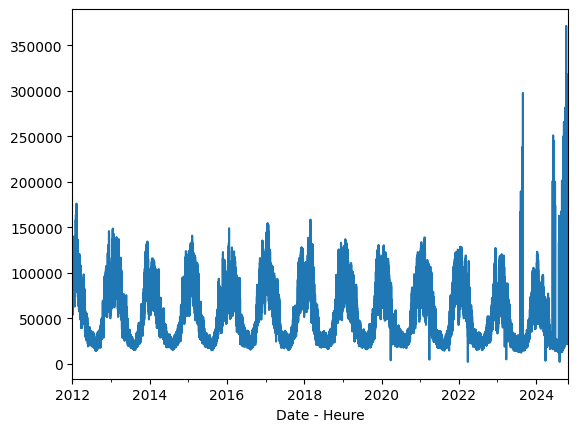

In [ ]:
series.plot()

<Axes: xlabel='Date - Heure'>

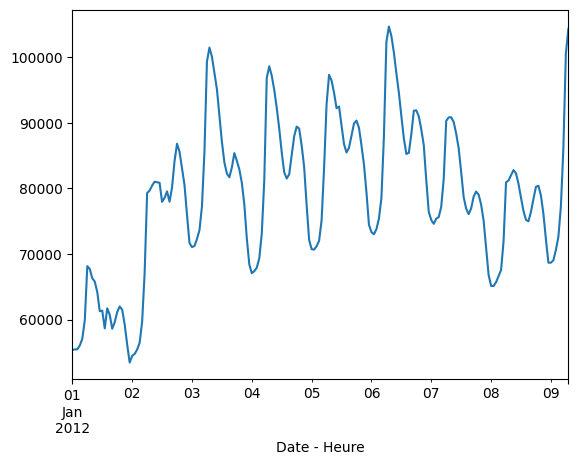

In [ ]:
series[-200:].plot()

In [ ]:
series.isna().sum()

101

In [ ]:
series = series.interpolate(method='linear')
series.isna().sum()

0

In [ ]:
# Changer la freq du data
series = series.resample('D').sum()
series

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2012-01-01,1446815.0
2012-01-02,1791945.0
2012-01-03,2005753.0
2012-01-04,1997598.0
2012-01-05,2038430.0
...,...
2024-10-27,641222.0
2024-10-28,1024206.0
2024-10-29,855905.0


In [ ]:
series.isna().sum()

0

<Axes: xlabel='Date - Heure'>

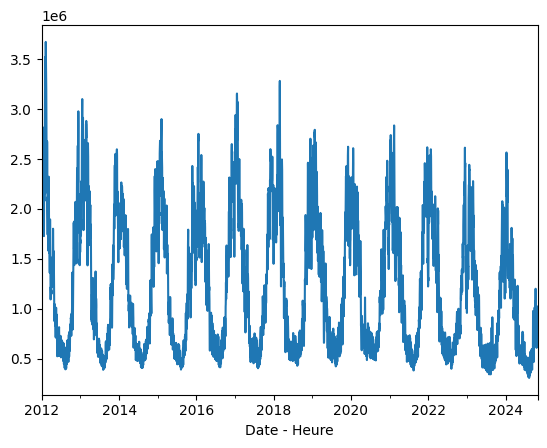

In [ ]:
series.plot()

<Axes: xlabel='Date - Heure'>

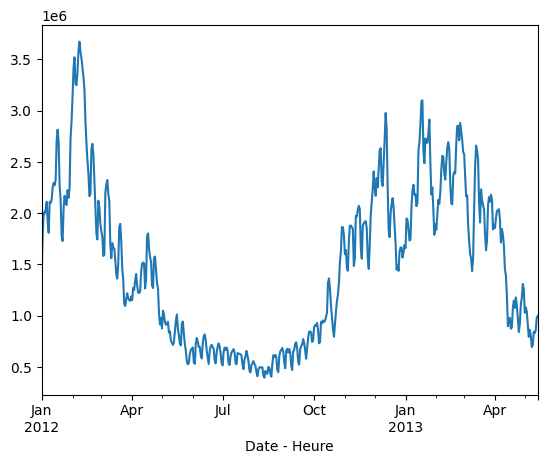

In [ ]:
series[:500].plot()

<Axes: >

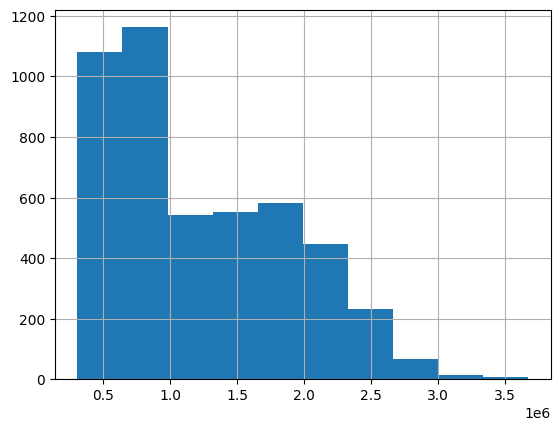

In [ ]:
series.hist()

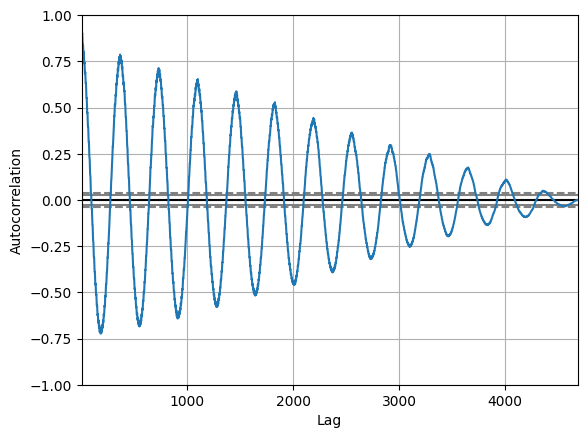

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series)
plt.show()

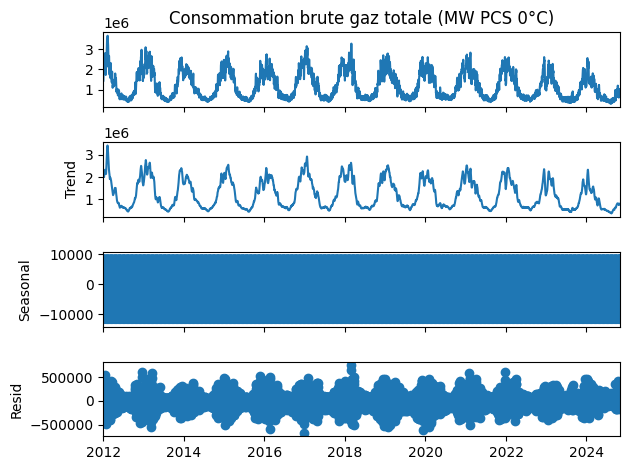

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(series, model='additive', period=12)
result.plot()
plt.show()

In [ ]:
size = len(series)/2
mean_1 = series[:int(size)].mean()
std_1 = series[:int(size)].std()
mean_2 = series[int(size):].mean()
std_2 = series[int(size):].std()

print("mean 1:",mean_1," std 1 :",std_1)
print("mean 2:",mean_2," std 2 :",std_2)

mean 1: 1315454.8391638226  std 1 : 696097.3536304665
mean 2: 1144883.3459897612  std 2 : 611286.2114219961


In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(series)
print("ADF stats : ", result[0])
print("p-value : ", result[1])
print("Critical value:")
for key,value in result[4].items():
    print(key,"  :  ",value)


ADF stats :  -4.552720107375297
p-value :  0.0001577260282660595
Critical value:
1%   :   -3.431755263940016
5%   :   -2.862160964607231
10%   :   -2.5671005419475


<ipython-input-9-85552617c02a>:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history = [series[i] for i in range(window)]
<ipython-input-9-85552617c02a>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  test = [series[i] for i in range(window,len(series))]


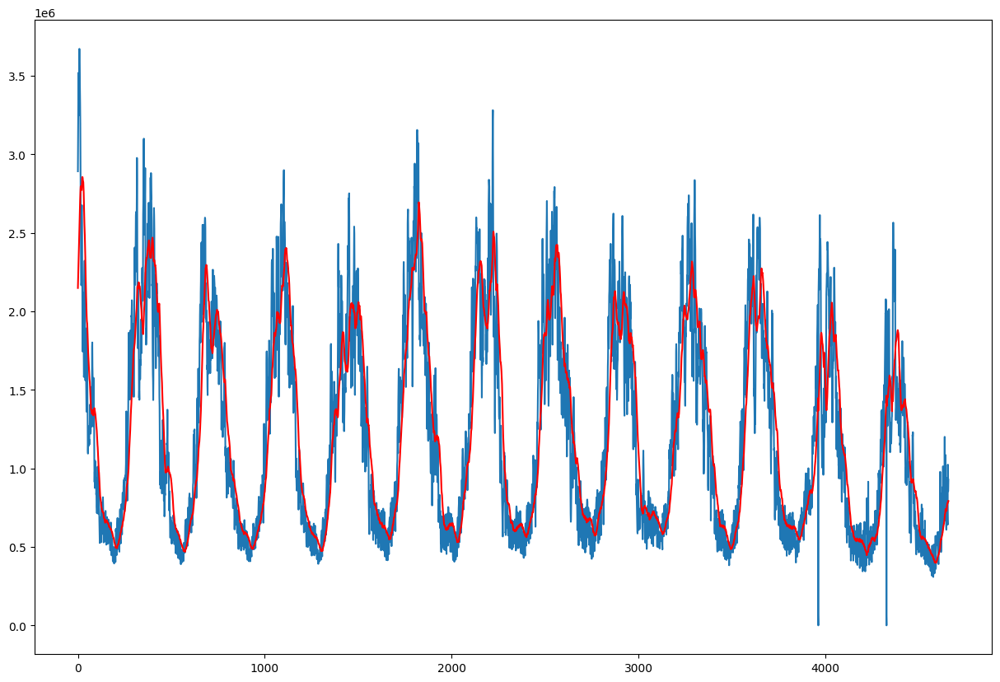

In [ ]:

window = 30
history = [series[i] for i in range(window)]
test = [series[i] for i in range(window,len(series))]
pred = []
for t in range(len(test)):
    length = len(history)
    yhat = np.mean([history[i] for i in range(length-window,length)])
    pred.append(yhat)
    history.append(test[t])

plt.figure(figsize=(15,10))
plt.plot(test)
plt.plot(pred, color='red')
plt.show()

<ipython-input-25-74b618a98007>:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history = [series[i] for i in range(window)]
<ipython-input-25-74b618a98007>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  test = [series[i] for i in range(window,len(series))]


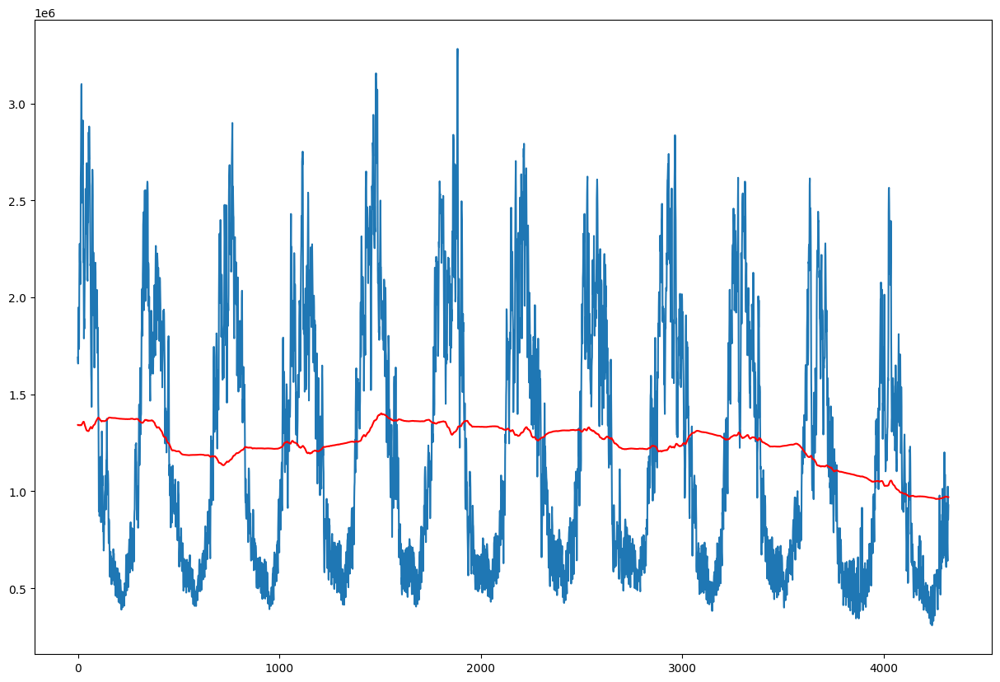

In [ ]:

window = 365
history = [series[i] for i in range(window)]
test = [series[i] for i in range(window,len(series))]
pred_1 = []
for t in range(len(test)):
    length = len(history)
    yhat = np.mean([history[i] for i in range(length-window,length)])
    pred_1.append(yhat)
    history.append(test[t])

plt.figure(figsize=(15,10))
plt.plot(test)
plt.plot(pred_1, color='red')
plt.show()

### *GARCH model*

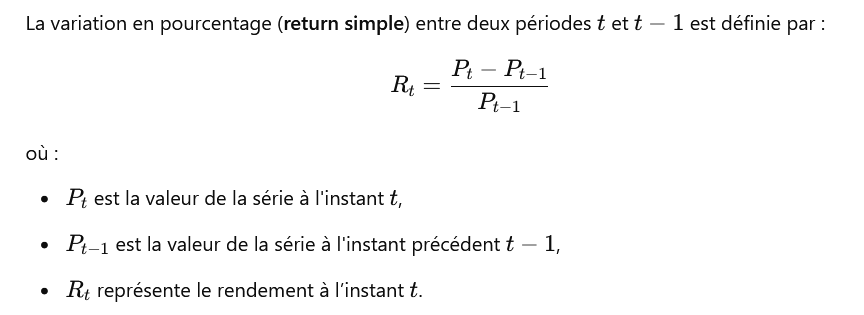

In [ ]:
!pip install arch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 985.3/985.3 kB 18.5 MB/s eta 0:00:00


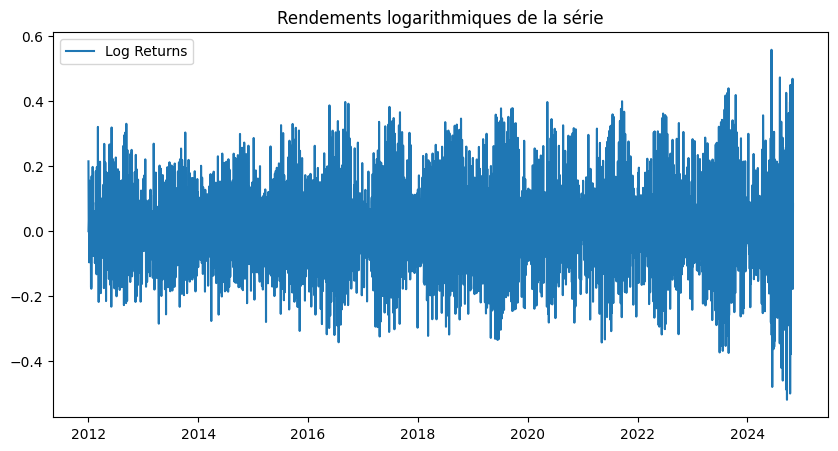

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from arch import arch_model

# Supposons que `series` est ta série temporelle (ex : consommation de gaz)
returns = series.pct_change().dropna()  # Rendements simples
# OU
log_returns = np.log(series).diff().dropna()  # Rendements logarithmiques

# Visualiser les rendements
plt.figure(figsize=(10, 5))
plt.plot(log_returns, label="Log Returns")
plt.legend()
plt.title("Rendements logarithmiques de la série")
plt.show()


In [ ]:
# Ajuster un modèle GARCH(1,1)
garch_model = arch_model(log_returns, vol="Garch", p=1, q=1, dist="skewt")
garch_fit = garch_model.fit(update_freq=5)

# Afficher les résultats
print(garch_fit.summary())


/usr/local/lib/python3.11/dist-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.01528. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     49,   Neg. LLF: 7798.5750470597395
Iteration:     10,   Func. Count:     90,   Neg. LLF: -2369.4614452127516
Iteration:     15,   Func. Count:    129,   Neg. LLF: -3361.3075243387575
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3361.3078923721205
            Iterations: 19
            Function evaluations: 156
            Gradient evaluations: 19
                                 Constant Mean - GARCH Model Results                                  
Dep. Variable:     Consommation brute gaz totale (MW PCS 0°C)   R-squared:                       0.000
Mean Model:                                     Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                              GARCH   Log-Likelihood:                3361.31
Distribution:                   Standardized Skew Student's t   AIC:                          -6710.62
Method:                                    Maximum L

                  h.01      h.02     h.03      h.04      h.05      h.06  \
Date - Heure                                                              
2024-10-31    0.039751  0.039514  0.03928  0.039048  0.038818  0.038591   

                  h.07      h.08      h.09      h.10  
Date - Heure                                          
2024-10-31    0.038367  0.038145  0.037925  0.037707  


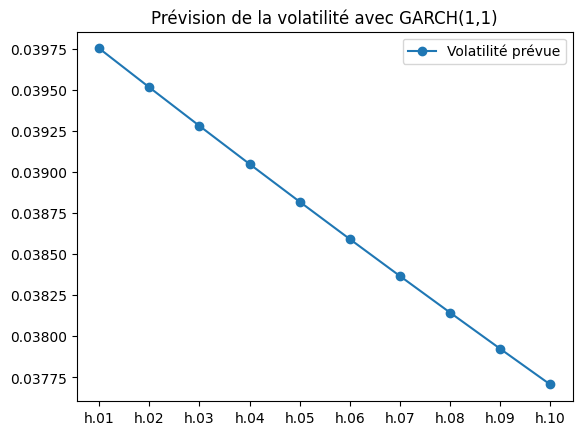

In [ ]:
# Prédire la volatilité future
forecast = garch_fit.forecast(horizon=10)
print(forecast.variance)

# Visualiser la volatilité prévue
plt.plot(forecast.variance.iloc[-1], marker="o", label="Volatilité prévue")
plt.legend()
plt.title("Prévision de la volatilité avec GARCH(1,1)")
plt.show()


               h.00001   h.00002  h.00003   h.00004   h.00005   h.00006  \
Date - Heure                                                              
2024-10-31    0.039751  0.039514  0.03928  0.039048  0.038818  0.038591   

               h.00007   h.00008   h.00009   h.00010  ...   h.09991   h.09992  \
Date - Heure                                          ...                       
2024-10-31    0.038367  0.038145  0.037925  0.037707  ...  0.017114  0.017114   

               h.09993   h.09994   h.09995   h.09996   h.09997   h.09998  \
Date - Heure                                                               
2024-10-31    0.017114  0.017114  0.017114  0.017114  0.017114  0.017114   

               h.09999   h.10000  
Date - Heure                      
2024-10-31    0.017114  0.017114  

[1 rows x 10000 columns]


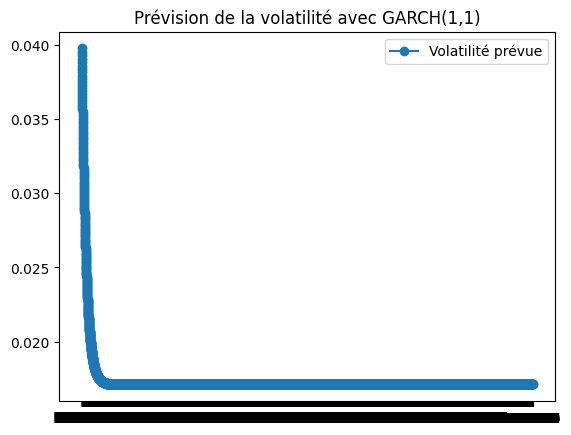

In [ ]:
# Prédire la volatilité future
forecast = garch_fit.forecast(horizon=10000)
print(forecast.variance)

# Visualiser la volatilité prévue
plt.plot(forecast.variance.iloc[-1], marker="o", label="Volatilité prévue")
plt.legend()
plt.title("Prévision de la volatilité avec GARCH(1,1)")
plt.show()


L'axe Y : représente la volatilité prévue (et non la consommation elle-même).

L'axe X : représente les prochaines heures (h.01, h.02, ..., h.10).

La tendance décroissante signifie que l’incertitude (volatilité) autour de la consommation de gaz diminue avec le temps.

La consommation de gaz peut rester stable ou évoluer, mais les variations seront de moins en moins imprévisibles

In [ ]:
# Ajuster un modèle GARCH(2,1)
garch_model = arch_model(log_returns, vol="Garch", p=2, q=1, dist="skewt")
garch_fit = garch_model.fit(update_freq=5)

# Afficher les résultats
print(garch_fit.summary())


/usr/local/lib/python3.11/dist-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.01528. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     54,   Neg. LLF: 836357.5258122877
Iteration:     10,   Func. Count:    109,   Neg. LLF: 178758.51542139007
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3359.987205267731
            Iterations: 18
            Function evaluations: 162
            Gradient evaluations: 14
                                 Constant Mean - GARCH Model Results                                  
Dep. Variable:     Consommation brute gaz totale (MW PCS 0°C)   R-squared:                       0.000
Mean Model:                                     Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                              GARCH   Log-Likelihood:                3359.99
Distribution:                   Standardized Skew Student's t   AIC:                          -6705.97
Method:                                    Maximum Likelihood   BIC:                          -6660.81
                          

In [ ]:
# Ajuster un modèle GARCH(1,2)
garch_model = arch_model(returns, mean="constant", vol="Garch", p=1, q=2, dist="skewt")
garch_fit = garch_model.fit(update_freq=5)

# Afficher les résultats
print(garch_fit.summary())


/usr/local/lib/python3.11/dist-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.01647. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     68,   Neg. LLF: 9714.806152604175
Iteration:     10,   Func. Count:    117,   Neg. LLF: 12168395.999281336
Iteration:     15,   Func. Count:    171,   Neg. LLF: 15677032.756723607
Iteration:     20,   Func. Count:    218,   Neg. LLF: -2681.720844142491
Iteration:     25,   Func. Count:    261,   Neg. LLF: 14840.360082055377
Iteration:     30,   Func. Count:    307,   Neg. LLF: -3132.9102013478805
Iteration:     35,   Func. Count:    348,   Neg. LLF: 25.51477230546849
Iteration:     40,   Func. Count:    399,   Neg. LLF: -3272.948676525767
Iteration:     45,   Func. Count:    439,   Neg. LLF: -3273.302187377365
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3273.3033364955872
            Iterations: 51
            Function evaluations: 473
            Gradient evaluations: 48
                                 Constant Mean - GARCH Model Results                                  
Dep. Variable:     Consommati

In [ ]:
# Ajuster un modèle GARCH(1,2)
garch_model = arch_model(returns, mean="constant", vol="Garch", p=1, q=2, dist="ged")
garch_fit = garch_model.fit(update_freq=5)

# Afficher les résultats
print(garch_fit.summary())


/usr/local/lib/python3.11/dist-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.01647. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     51,   Neg. LLF: 301393.37019719294
Iteration:     10,   Func. Count:    100,   Neg. LLF: -3284.5475100306912
Iteration:     15,   Func. Count:    158,   Neg. LLF: 7361413.370956
Iteration:     20,   Func. Count:    205,   Neg. LLF: -3301.6005428516987
Iteration:     25,   Func. Count:    245,   Neg. LLF: -3319.0979084853107
Iteration:     30,   Func. Count:    283,   Neg. LLF: -3326.408915051704
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3326.4089286376943
            Iterations: 38
            Function evaluations: 311
            Gradient evaluations: 34
                                 Constant Mean - GARCH Model Results                                  
Dep. Variable:     Consommation brute gaz totale (MW PCS 0°C)   R-squared:                       0.000
Mean Model:                                     Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                

In [ ]:
# Ajuster un modèle GARCH(1,2)
garch_model = arch_model(returns, mean="constant", vol="EGARCH", p=1, q=2, dist="skewt")
garch_fit = garch_model.fit(update_freq=5)

# Afficher les résultats
print(garch_fit.summary())


/usr/local/lib/python3.11/dist-packages/arch/univariate/base.py:309: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.01647. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


Iteration:      5,   Func. Count:     59,   Neg. LLF: 522.7105957403784
Iteration:     10,   Func. Count:    105,   Neg. LLF: 158302.58911760582
Iteration:     15,   Func. Count:    150,   Neg. LLF: -3333.169127106112
Iteration:     20,   Func. Count:    192,   Neg. LLF: -3334.13240025528
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3334.1324013741537
            Iterations: 22
            Function evaluations: 207
            Gradient evaluations: 22
                                 Constant Mean - EGARCH Model Results                                 
Dep. Variable:     Consommation brute gaz totale (MW PCS 0°C)   R-squared:                       0.000
Mean Model:                                     Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                             EGARCH   Log-Likelihood:                3334.13
Distribution:                   Standardized Skew Student's t   AIC:                  

#### **ARIMA**

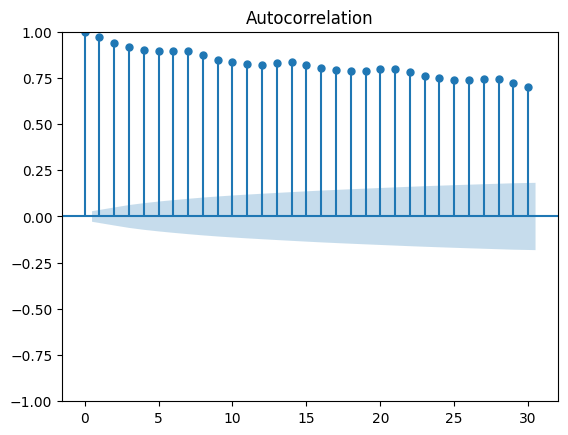

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(series, lags=30)
plt.show()

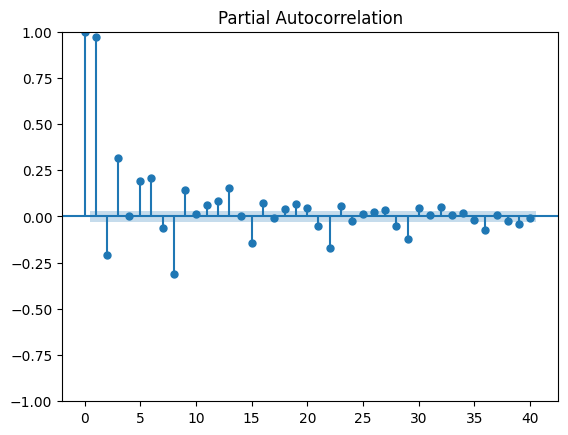

In [ ]:
plot_pacf(series, lags=40)
plt.show()

**Verification de correlation entre les lagged**

In [ ]:
#Correlation entre 1er var et 2eme
from pandas import *
values=DataFrame(series.values) # facilite la création des lagged values
dataframe=concat([values.shift(1),values],axis=1)
dataframe.columns=['t','t+1']
dataframe
result= dataframe.corr()
result

,t,t+1
t,1.000000,0.977388
t+1,0.977388,1.000000


In [ ]:
#Correlation entre 1er var et 2eme
values=DataFrame(series.values) # facilite la création des lagged values
dataframe=concat([values.shift(2),values],axis=1)
dataframe.columns=['t','t+2']
dataframe
result= dataframe.corr()
result

,t,t+2
t,1.000000,0.945057
t+2,0.945057,1.000000


In [ ]:
#Correlation entre 1er var et 15eme
values=DataFrame(series.values) # facilite la création des lagged values
dataframe=concat([values.shift(15),values],axis=1)
dataframe.columns=['t','t+15']
dataframe
result= dataframe.corr()
result

,t,t+15
t,1.000000,0.827581
t+15,0.827581,1.000000


In [ ]:
# Split data
n=len(series)
train_data= series[:int(0.8*n)] #80% pour le train
test_data= series[int(0.8*n):] #20% pour le test

In [ ]:
#model autoreg
#apres savoir qu'il y a une correlation entre les var et les lagged et le choix de p alors on va creer le model AR(1)
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
from math import sqrt
model=AutoReg(train_data,lags=15)
model_fit=model.fit()
coef=model_fit.params
print('Coefficients: %s' % coef)

Coefficients: const                                             15927.704781
Consommation brute gaz totale (MW PCS 0°C).L1         1.283790
Consommation brute gaz totale (MW PCS 0°C).L2        -0.491469
Consommation brute gaz totale (MW PCS 0°C).L3         0.164892
Consommation brute gaz totale (MW PCS 0°C).L4        -0.031374
Consommation brute gaz totale (MW PCS 0°C).L5        -0.047564
Consommation brute gaz totale (MW PCS 0°C).L6         0.082419
Consommation brute gaz totale (MW PCS 0°C).L7         0.340692
Consommation brute gaz totale (MW PCS 0°C).L8        -0.544807
Consommation brute gaz totale (MW PCS 0°C).L9         0.204939
Consommation brute gaz totale (MW PCS 0°C).L10       -0.016278
Consommation brute gaz totale (MW PCS 0°C).L11       -0.011642
Consommation brute gaz totale (MW PCS 0°C).L12       -0.034414
Consommation brute gaz totale (MW PCS 0°C).L13        0.067895
Consommation brute gaz totale (MW PCS 0°C).L14        0.219555
Consommation brute gaz totale (MW PCS 0°C

In [ ]:
from sklearn.metrics import mean_squared_error
import pandas as pd
# Prédire les valeurs pour les données de test
predictions_1 = model_fit.predict(start=len(train_data), end=len(series) - 1,dynamic=False)

# Afficher les prédictions et les valeurs attendues
for i in range(len(predictions_1)):
    print(f'Predicted={predictions_1[i]:.3f}, Expected={test_data[i]:.3f}')


<ipython-input-43-15ac2c559ad3>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Predicted={predictions_1[i]:.3f}, Expected={test_data[i]:.3f}')


Predicted=1420531.153, Expected=1542501.000
Predicted=1286444.701, Expected=1510997.000
Predicted=1204612.345, Expected=1367067.000
Predicted=1314095.826, Expected=1274855.000
Predicted=1235543.736, Expected=1115219.000
Predicted=1199918.729, Expected=1127315.000
Predicted=1259541.916, Expected=1033994.000
Predicted=1442911.536, Expected=864904.000
Predicted=1431505.998, Expected=695745.000
Predicted=1417788.594, Expected=673026.000
Predicted=1523267.816, Expected=756877.000
Predicted=1459113.077, Expected=1025035.000
Predicted=1377832.759, Expected=1065511.000
Predicted=1364275.697, Expected=1010038.000
Predicted=1432689.055, Expected=962565.000
Predicted=1372473.359, Expected=736377.000
Predicted=1331039.178, Expected=758276.000
Predicted=1391342.830, Expected=1029845.000
Predicted=1343393.140, Expected=1109178.000
Predicted=1277674.697, Expected=1084147.000
Predicted=1294602.838, Expected=1014106.000
Predicted=1377780.738, Expected=959973.000
Predicted=1358554.966, Expected=853725.0

In [ ]:
# Calculer le RMSE
rmse = sqrt(mean_squared_error(test_data, predictions_1))
print(f'Test RMSE de AR prediction sans walkforward: {rmse:.3f}')

Test RMSE de AR prediction sans walkforward: 612509.298


In [ ]:
#prediction à la main
# Initialiser l'historique avec les données d'entraînement
history = list(train_data)  # Convertir train_data en liste
window = 15  #taille de la fenetre
coef = list(coef)  #les coeff trouvées depuis le modele
predictions_2 = []  # Liste pour stocker les prédictions

# Parcourir les données de test
for t in range(len(test_data)):
    # Créer la fenêtre (lag) avec les données passées
    lag = [history[i] for i in range(len(history) - window, len(history))]

    # Initialiser la prédiction avec le premier coefficient (biais)
    yhat = coef[0]

    # Ajouter l'effet de chaque lag (valeur passée multipliée par son coefficient)
    for j in range(window):
        yhat += lag[j] * coef[window - j]

    # Ajouter la prédiction à la liste
    predictions_2.append(yhat)

    # Ajouter la valeur réelle de test_data[t] à l'historique pour la prochaine prédiction
    history.append(test_data[t])

# Afficher les prédictions et les valeurs attendues
for i in range(len(test_data)):
    print(f'Predicted={predictions_2[i]:.3f}, Expected={test_data[i]:.3f}')




<ipython-input-45-ef1c0083674c>:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history.append(test_data[t])
<ipython-input-45-ef1c0083674c>:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Predicted={predictions_2[i]:.3f}, Expected={test_data[i]:.3f}')


Predicted=1420531.153, Expected=1542501.000
Predicted=1443028.343, Expected=1510997.000
Predicted=1432945.913, Expected=1367067.000
Predicted=1432404.845, Expected=1274855.000
Predicted=1138525.558, Expected=1115219.000
Predicted=1078673.741, Expected=1127315.000
Predicted=1213274.650, Expected=1033994.000
Predicted=1222763.138, Expected=864904.000
Predicted=817427.875, Expected=695745.000
Predicted=682880.147, Expected=673026.000
Predicted=776215.045, Expected=756877.000
Predicted=751416.262, Expected=1025035.000
Predicted=1129726.165, Expected=1065511.000
Predicted=998361.242, Expected=1010038.000
Predicted=1008598.034, Expected=962565.000
Predicted=938207.476, Expected=736377.000
Predicted=679950.291, Expected=758276.000
Predicted=840592.830, Expected=1029845.000
Predicted=1181723.111, Expected=1109178.000
Predicted=1079640.250, Expected=1084147.000
Predicted=1043802.360, Expected=1014106.000
Predicted=938820.567, Expected=959973.000
Predicted=811775.306, Expected=853725.000
Predict

In [ ]:
# Calculer le RMSE
rmse = sqrt(mean_squared_error(test_data, predictions_2))
print(f'Test RMSE de AR avec walkforward: {rmse:.3f}')

Test RMSE de AR avec walkforward: 113299.508


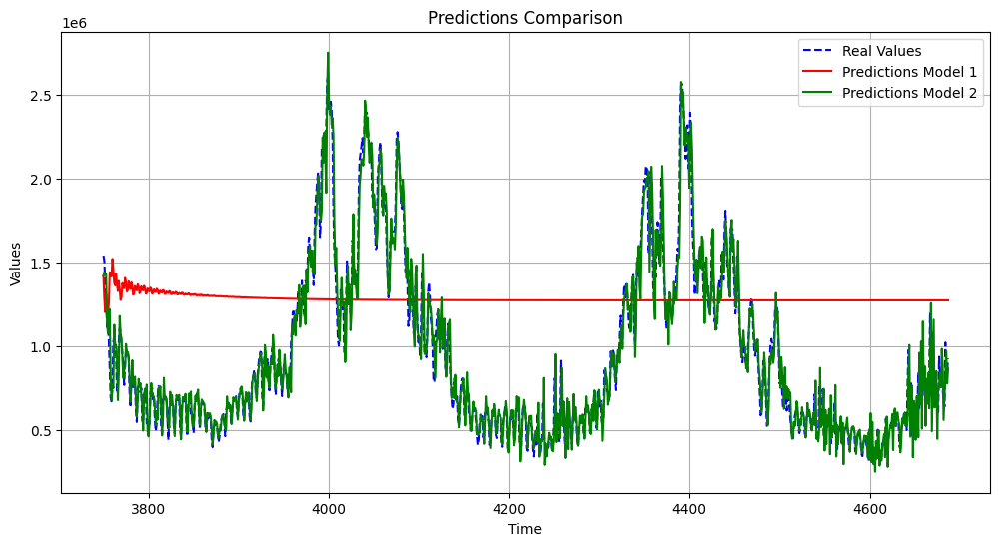

In [ ]:
import matplotlib.pyplot as plt

# Indices pour le jeu de données de test (après les données d'entraînement)
test_index = range(len(train_data), len(train_data) + len(test_data))

# Tracer les courbes
plt.figure(figsize=(12, 6))
#Valeurs reels
plt.plot(test_index, test_data, label="Real Values", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle 1
plt.plot(test_index, predictions_1, label="Predictions Model 1", color='red')

# Courbe des prédictions du modèle 2
plt.plot(test_index, predictions_2, label="Predictions Model 2", color='green')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


In [ ]:
# Calcul des erreurs résiduelles pour chaque modèle
residuals_1 = test_data - predictions_1
residuals_2 = test_data - predictions_2

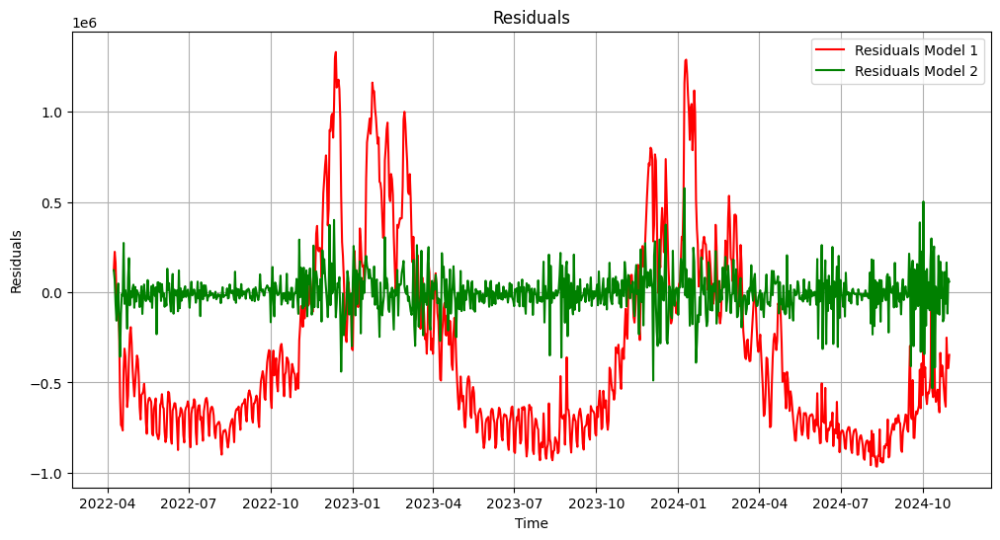

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(residuals_1, label="Residuals Model 1", color='red')
plt.plot(residuals_2, label="Residuals Model 2", color='green')
plt.title("Residuals")
plt.xlabel("Time")
plt.ylabel("Residuals")
plt.legend()
plt.grid()
plt.show()

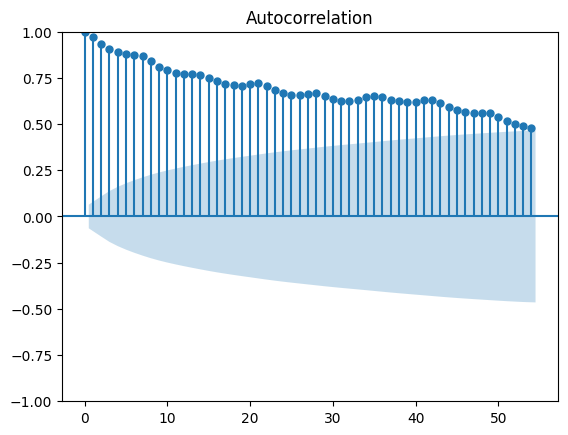

In [ ]:
#verification de q à partir de residus de model 1 à ameleorer
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(residuals_1,lags=54)
plt.show()


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Paramètre q déterminé via l'ACF
q = 53

# Ajustement du modèle MA sur les résiduels
ma_model = ARIMA(residuals_1, order=(0, 0, q)).fit()



# Prédiction pour les données de test
predictions_ma = ma_model.predict()


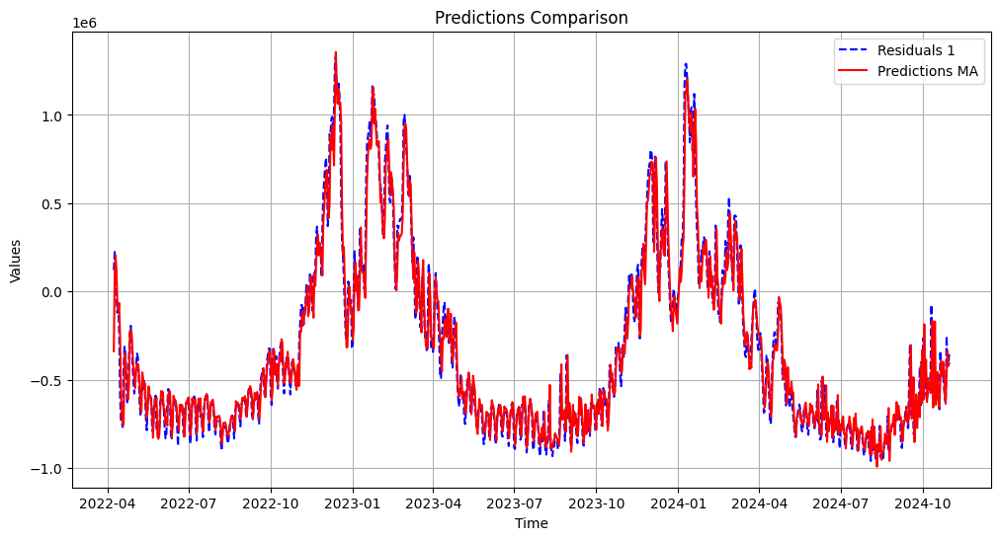

In [ ]:
import numpy as np
# Tracer les courbes
plt.figure(figsize=(12, 6))
plt.plot(residuals_1, label="Residuals 1", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle MA
plt.plot(predictions_ma, label="Predictions MA", color='red')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


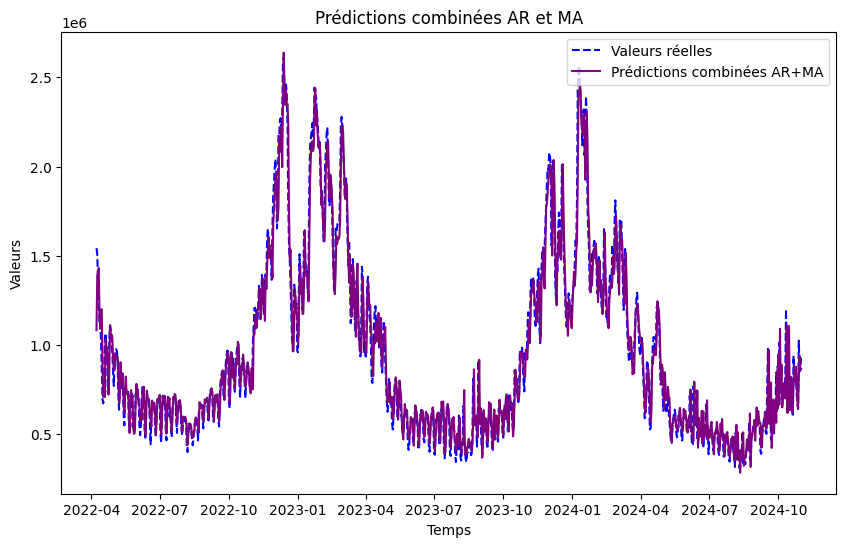

In [ ]:
predictions_combined = predictions_1 + predictions_ma
import numpy as np
# Tracer les données réelles, les prédictions AR, MA, et combinées
plt.figure(figsize=(10, 6))
plt.plot(test_data, label='Valeurs réelles', color='blue', linestyle='dashed')

plt.plot(predictions_combined, label='Prédictions combinées AR+MA', color='purple')
plt.title('Prédictions combinées AR et MA')
plt.xlabel('Temps')
plt.ylabel('Valeurs')
plt.legend()
plt.show()

In [ ]:
# Calculer le RMSE des prédictions combinées
rmse_combined = np.sqrt(mean_squared_error(test_data, predictions_combined))
print(f"RMSE des Prédictions combinées AR+MA: {rmse_combined}")

RMSE des Prédictions combinées AR+MA: 105609.01720633278


In [ ]:
from sklearn.metrics import r2_score
# Calcul du R²
r2 = r2_score(test_data.values, predictions_combined)

print(f"Coefficient de détermination (R²) du Model ARMA : {r2:.4f}")


Coefficient de détermination (R²) du Model ARMA : 0.9567


In [ ]:
# Recherche par grille pour les paramètres ARIMA
import itertools
def grid_search_arima(train_data, p_values, d_values, q_values):
    best_score, best_cfg = float("inf"), None #initialisation de aic à plus petit float et la conf à none
    for p, d, q in itertools.product(p_values, d_values, q_values): #genere toutes les combinaisons possibles des valeurs de p, d, et q
        try:
            model = ARIMA(train_data, order=(p, d, q))
            model_fit = model.fit()
            aic = model_fit.aic
            if aic < best_score:
                best_score, best_cfg = aic, (p, d, q)
        except:
            continue
    return best_cfg, best_score

In [ ]:
# Définir les plages pour p, d, q
p_values = range(0, 6)  # Paramètres pour AR (p)
d_values = range(0, 3)  # Paramètres pour différenciation (d)
q_values = range(0, 6)  # Paramètres pour MA (q)

best_cfg, best_score = grid_search_arima(train_data.values, p_values, d_values, q_values)
print(f"Meilleurs paramètres ARIMA: {best_cfg} avec AIC: {best_score}")

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: Conver

Meilleurs paramètres ARIMA: (5, 1, 5) avec AIC: 97608.1346803951


In [ ]:
# Validation par glissement (Walk Forward Validation)
history = list(train_data.values)
predictions = []
for t in range(len(test_data)):
    model = ARIMA(history, order=best_cfg)  # Utilisation des paramètres optimisés
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)
    history.append(test_data.values[t])  # Mise à jour avec la vraie valeur

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

In [ ]:
from pandas import DataFrame
data=DataFrame()
data['Reel values']=test_data.values
data['Predictions ARIMA ']=predictions
data['Predictions ARMA']=predictions_combined.values
print(data)

     Reel values  Predictions ARIMA   Predictions ARMA
0      1542501.0        1.425177e+06      1.082773e+06
1      1510997.0        1.481359e+06      1.386888e+06
2      1367067.0        1.491388e+06      1.411325e+06
3      1274855.0        1.485124e+06      1.431346e+06
4      1115219.0        1.232051e+06      1.167156e+06
..           ...                 ...               ...
933     641222.0        6.703851e+05      6.441943e+05
934    1024206.0        7.326753e+05      8.106767e+05
935     855905.0        1.086588e+06      9.389237e+05
936     854964.0        7.537255e+05      8.608245e+05
937     928329.0        9.098252e+05      8.676621e+05

[938 rows x 3 columns]


In [ ]:
rmse = sqrt(mean_squared_error(test_data, predictions))
print(f'Test RMSE de ARIMA: {rmse:.3f}')

Test RMSE de ARIMA: 106705.281


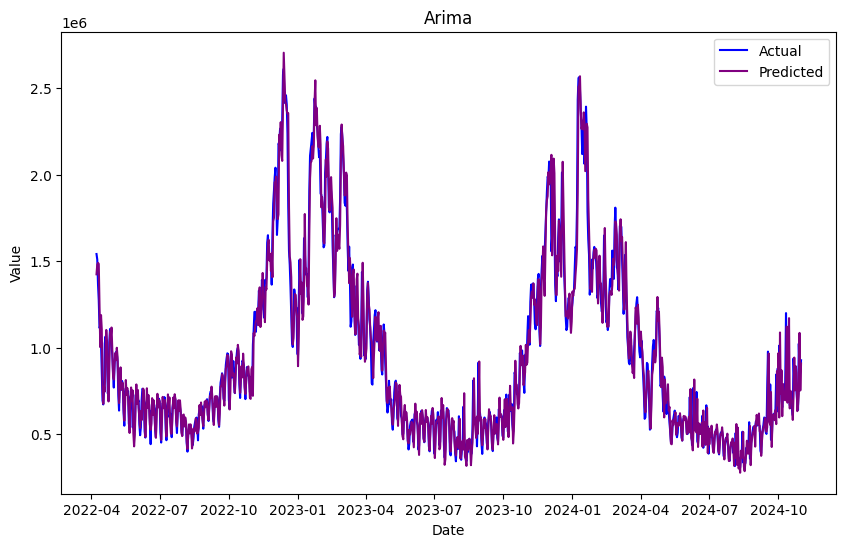

In [ ]:
# Visualisation des prédictions vs valeurs réelles
plt.figure(figsize=(10, 6))
plt.plot(test_data.index, test_data.values, label="Actual", color="blue")
plt.plot(test_data.index, predictions, label="Predicted", color="purple")
plt.title("Arima")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import r2_score
# Calcul du R²
r2 = r2_score(test_data.values, predictions)

print(f"Coefficient de détermination (R²) model ARIMA : {r2:.4f}")


Coefficient de détermination (R²) model ARIMA : 0.9558


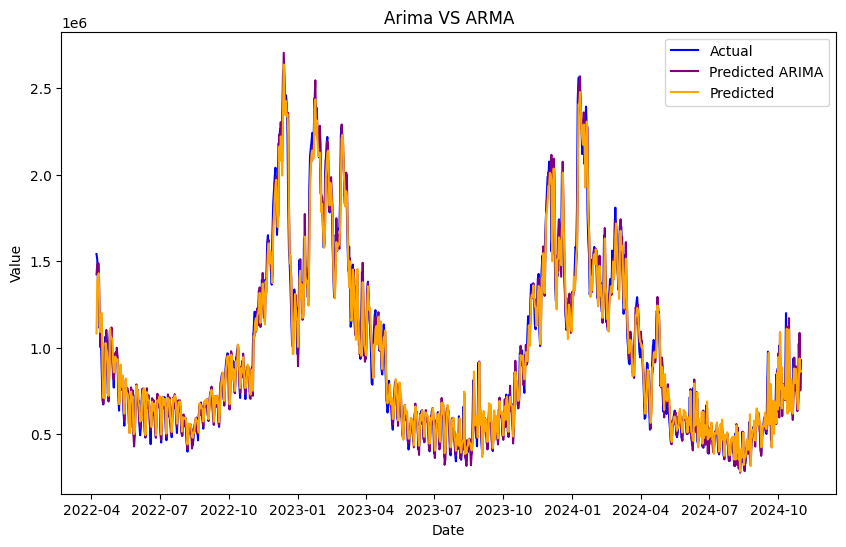

In [ ]:
# Visualisation des prédictions vs valeurs réelles
plt.figure(figsize=(10, 6))
plt.plot(test_data.index, test_data.values, label="Actual", color="blue")
plt.plot(test_data.index, predictions, label="Predicted ARIMA", color="purple")
plt.plot(test_data.index, predictions_combined.values, label="Predicted", color="orange")
plt.title("Arima VS ARMA")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.show()

#### **DL models**

In [ ]:
series.shape

(4688,)

In [ ]:
data = pd.DataFrame(series)
data

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2012-01-01,1446815.0
2012-01-02,1791945.0
2012-01-03,2005753.0
2012-01-04,1997598.0
2012-01-05,2038430.0
...,...
2024-10-27,641222.0
2024-10-28,1024206.0
2024-10-29,855905.0


In [ ]:
from sklearn.preprocessing import MinMaxScaler


data = pd.DataFrame(series)

# Normalisation des données
scaler = MinMaxScaler()
data['Consommation brute gaz totale (MW PCS 0°C)'] = scaler.fit_transform(data[['Consommation brute gaz totale (MW PCS 0°C)']])
data.head()

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2012-01-01,0.393988
2012-01-02,0.487972
2012-01-03,0.546195
2012-01-04,0.543974
2012-01-05,0.555094


In [ ]:
data.shape

(4688, 1)

In [ ]:
def create_sequences(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)

window_size = 365  # Taille de la fenêtre (ajustable)
X, y = create_sequences(data['Consommation brute gaz totale (MW PCS 0°C)'].values, window_size)

In [ ]:
# Reshape pour RNN, LSTM, GRU (ajout de la dimension feature)
X_dl = X.reshape((X.shape[0], X.shape[1], 1))

In [ ]:
series.isna().sum()

0

In [ ]:
4688-365

4323

In [ ]:
y.shape

(4323,)

In [ ]:
X.shape, X_dl.shape

((4323, 365), (4323, 365, 1))

In [ ]:
X_dl

array([[[0.33842685],
        [0.44102746],
        [0.50458853],
        ...,
        [0.40300908],
        [0.37427954],
        [0.38982347]],

       [[0.44102746],
        [0.50458853],
        [0.50216421],
        ...,
        [0.37427954],
        [0.38982347],
        [0.41077436]],

       [[0.50458853],
        [0.50216421],
        [0.51430279],
        ...,
        [0.38982347],
        [0.41077436],
        [0.40136006]],

       ...,

       [[0.1926197 ],
        [0.19525212],
        [0.17761592],
        ...,
        [0.10879268],
        [0.0989393 ],
        [0.21279319]],

       [[0.19525212],
        [0.17761592],
        [0.2265796 ],
        ...,
        [0.0989393 ],
        [0.21279319],
        [0.16276049]],

       [[0.17761592],
        [0.2265796 ],
        [0.26009656],
        ...,
        [0.21279319],
        [0.16276049],
        [0.16248075]]])

# **ANN**

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)  # Mise à l'échelle des entrées
y_scaled = scaler.fit_transform(y.reshape(-1, 1))

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42, shuffle=False)


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers, regularizers
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(365,),
                       kernel_regularizer=regularizers.l2(0.001)),  # Régularisation L2
    keras.layers.Dropout(0.1),  # Réduction du Dropout
    keras.layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dense(1)  # Couche de sortie
])

In [ ]:
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1990 - mae: 0.1502 - val_loss: 0.1109 - val_mae: 0.0600
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1053 - mae: 0.0753 - val_loss: 0.0753 - val_mae: 0.0539
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0730 - mae: 0.0669 - val_loss: 0.0551 - val_mae: 0.0565
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0548 - mae: 0.0665 - val_loss: 0.0421 - val_mae: 0.0549
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0418 - mae: 0.0614 - val_loss: 0.0337 - val_mae: 0.0636
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0319 - mae: 0.0552 - val_loss: 0.0281 - val_mae: 0.0688
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0257 - mae: 0.0545 - val_loss: 0.0215 - val_mae: 0.0576
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0210 - mae: 0.0535 - val_loss: 0.0186 - val_mae: 0.0611
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - l

In [ ]:
loss, mae = model.evaluate(X_test, y_test)
print(f"Erreur moyenne absolue : {mae}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0044 - mae: 0.0395
Erreur moyenne absolue : 0.04697467014193535


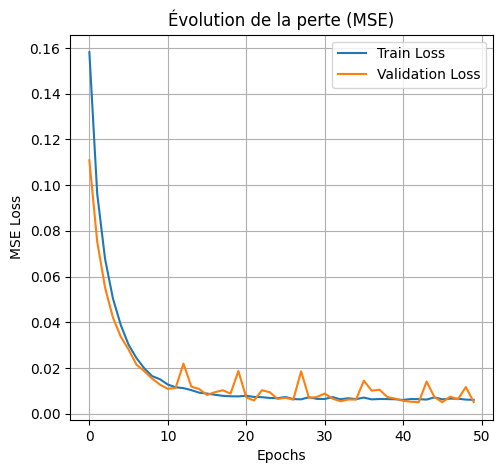

In [ ]:
import matplotlib.pyplot as plt

# Récupérer l'historique des pertes
history_dict = history.history

# Tracer la perte (MSE)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Évolution de la perte (MSE)')
plt.legend()
plt.grid()

In [ ]:
# Prédictions
predictions = model.predict(X_test)

from sklearn.metrics import mean_squared_error, r2_score

# Calcul du MSE
mse = mean_squared_error(y_test, predictions)
print(f"MSE: {mse}")

# Calcul du R²
r2 = r2_score(y_test, predictions)
print(f"R²: {r2}")

import numpy as np

rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
MSE: 0.0031356510400269624
R²: 0.8984882870953552
RMSE: 0.05599688419927454


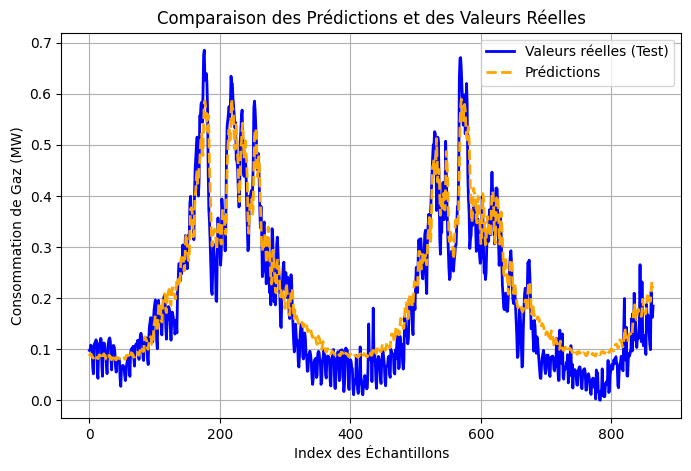

In [ ]:
y_pred_original = scaler.inverse_transform(predictions)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))
plt.figure(figsize=(8, 5))
plt.plot(y_test_original, label="Valeurs réelles (Test)", color="blue", linewidth=2)
plt.plot(y_pred_original, label="Prédictions", color="orange", linestyle="--", linewidth=2)
plt.title("Comparaison des Prédictions et des Valeurs Réelles")
plt.xlabel("Index des Échantillons")
plt.ylabel("Consommation de Gaz (MW)")
plt.legend()
plt.grid(True)
plt.show()

###  ▶ RNN ( Consommation de GAZ )

In [ ]:
X_r, y_r = [], []
window_size = 365
for i in range(len(series) - window_size):
    X_r.append(series.iloc[i:i+window_size])  # Séquence en entrée
    y_r.append(series.iloc[i+window_size])    # Valeur cible


X_r, y_r = np.array(X_r), np.array(y_r)

# Reshape (ajout de la dimension feature)
X_r = X_r.reshape((X_r.shape[0], X_r.shape[1], 1))


In [ ]:
X_r.shape

(4323, 365, 1)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Normalisation des données
scaler = MinMaxScaler(feature_range=(0, 1))
X_r = scaler.fit_transform(X_r.reshape(-1, 1)).reshape(X_r.shape)  # Normalisation sur la séquence
y_r = scaler.fit_transform(y_r.reshape(-1, 1))

In [ ]:
# Division en ensembles d'entraînement et de test
train_size = int(len(X_r) * 0.8)
test_size = len(X_r) - train_size
X_train, X_test = X_r[:train_size], X_r[train_size:]
y_train, y_test = y_r[:train_size], y_r[train_size:]

In [ ]:
!pip install tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense


In [ ]:
# Initialisation du modèle
model = Sequential()
model.add(SimpleRNN(50, activation='relu', return_sequences=True,  input_shape=(X_train.shape[1], 1)))
model.add(SimpleRNN(50, activation='relu'))
model.add(Dense(1))  # Sortie avec une seule valeur
model.compile(optimizer='adam', loss='mean_squared_error')
# Résumé du modèle
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_2 (SimpleRNN)             │ (None, 365, 50)             │           2,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_3 (SimpleRNN)             │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,701 (30.08 KB)

 Trainable params: 7,701 (30.08 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 26s 174ms/step - loss: 0.0306 - val_loss: 0.0026
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0027 - val_loss: 0.0015
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 180ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0013 - val_loss: 0.0015
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0012 - val_loss: 0.0014
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0012 - val_loss: 0.0014
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0013 - val_loss: 0.0016
Epoch 12/20
109/109

In [ ]:
# Prédictions
predictions = model.predict(X_test)

from sklearn.metrics import mean_squared_error, r2_score

# Calcul du MSE
mse = mean_squared_error(y_test, predictions)
print(f"MSE: {mse}")

# Calcul du R²
r2 = r2_score(y_test, predictions)
print(f"R²: {r2}")

import numpy as np

rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step
MSE: 0.0013881576591067905
R²: 0.9550606046531184
RMSE: 0.037257987856388466


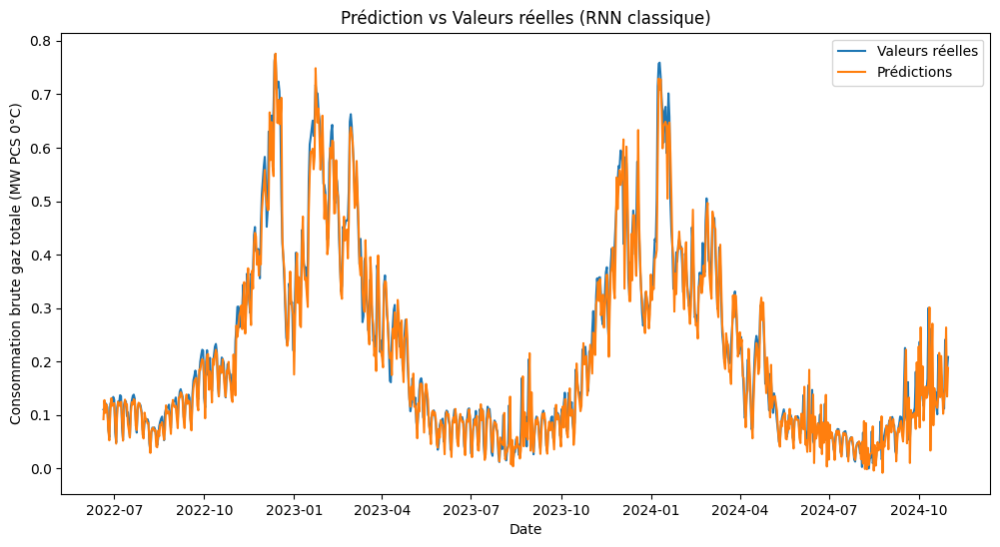

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(series.index[-len(y_test):], y_test, label='Valeurs réelles')
plt.plot(series.index[-len(y_test):], predictions, label='Prédictions')
plt.title('Prédiction vs Valeurs réelles (RNN classique)')
plt.xlabel('Date')
plt.ylabel('Consommation brute gaz totale (MW PCS 0°C)')
plt.legend()
plt.show()

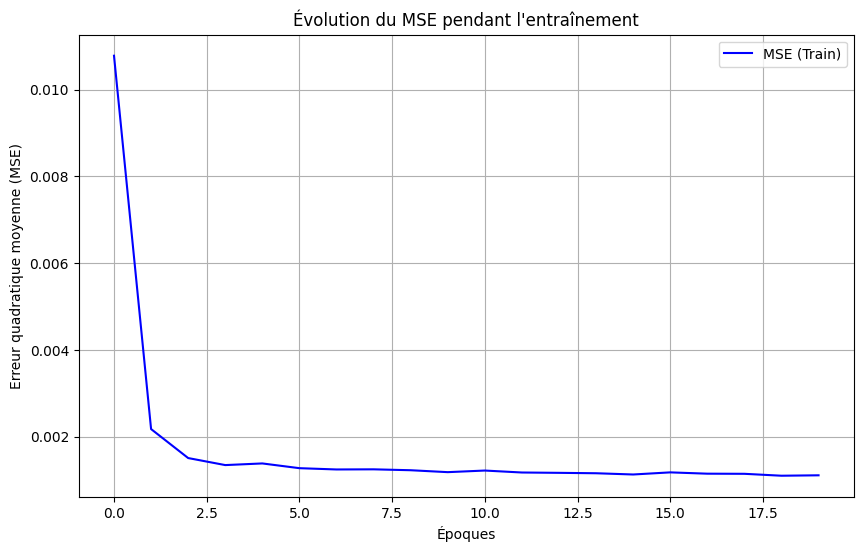

In [ ]:
# Extraire l'historique de l'entraînement
history_mse = history.history['loss']  # Cette liste contient les valeurs de la loss (MSE) à chaque époque

# Tracer l'évolution du MSE pendant l'entraînement
plt.figure(figsize=(10, 6))
plt.plot(history_mse, label='MSE (Train)', color='blue')
plt.title('Évolution du MSE pendant l\'entraînement')
plt.xlabel('Époques')
plt.ylabel('Erreur quadratique moyenne (MSE)')
plt.legend()
plt.grid(True)
plt.show()


 ### LSTM ( Consommation de GAZ )

In [ ]:
lenght_train = 0.8*len(X_dl)
X_train, y_train = X_dl[:int(lenght_train)], y[:int(lenght_train)]
X_test, y_test = X_dl[int(lenght_train):], y[int(lenght_train):]



In [ ]:
X_train

array([[[0.33842685],
        [0.44102746],
        [0.50458853],
        ...,
        [0.40300908],
        [0.37427954],
        [0.38982347]],

       [[0.44102746],
        [0.50458853],
        [0.50216421],
        ...,
        [0.37427954],
        [0.38982347],
        [0.41077436]],

       [[0.50458853],
        [0.50216421],
        [0.51430279],
        ...,
        [0.38982347],
        [0.41077436],
        [0.40136006]],

       ...,

       [[0.10539684],
        [0.09826745],
        [0.06448651],
        ...,
        [0.11492202],
        [0.11602613],
        [0.11591227]],

       [[0.09826745],
        [0.06448651],
        [0.05006986],
        ...,
        [0.11602613],
        [0.11591227],
        [0.10757056]],

       [[0.06448651],
        [0.05006986],
        [0.09727453],
        ...,
        [0.11591227],
        [0.10757056],
        [0.07710639]]])

In [ ]:
X_train.shape, y_train.shape

((3458, 365, 1), (3458,))

In [ ]:
from tensorflow import keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, SimpleRNN




In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    #keras.layers.LSTM(50, activation='relu', return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='mse')

history = model_lstm.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - loss: 0.0275 - val_loss: 0.0042
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.0048 - val_loss: 0.0036
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0043 - val_loss: 0.0032
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0043 - val_loss: 0.0030
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0038 - val_loss: 0.0025
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0037 - val_loss: 0.0023
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0035 - val_loss: 0.0022
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0031 - val_loss: 0.0022
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0030 - val_loss: 0.0020
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0028 - val_loss: 0.0020
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0028 - val_loss: 0.0018
Epoch 12/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 

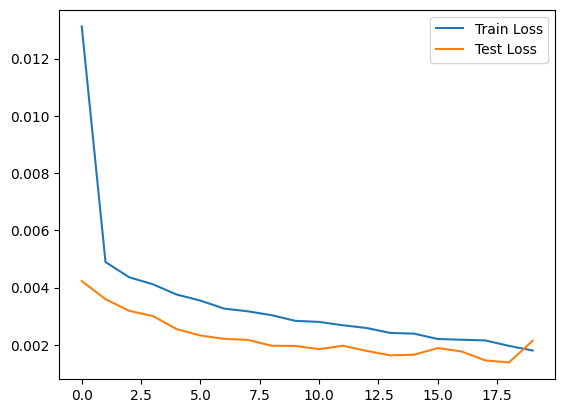

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
MSE: 0.002144161847036936
RMSE: 0.046305095259992025


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


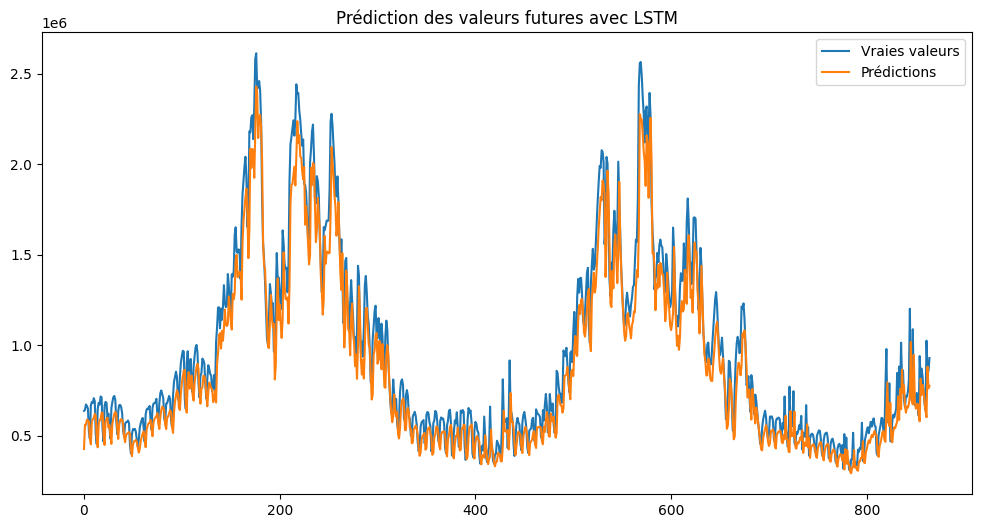

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(150, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='mse')

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.0303 - val_loss: 0.0047
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.0055 - val_loss: 0.0039
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.0047 - val_loss: 0.0032
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.0037 - val_loss: 0.0027
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.0035 - val_loss: 0.0024
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.0034 - val_loss: 0.0021
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.0028 - val_loss: 0.0029
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.0030 - val_loss: 0.0016
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.0019 - val_loss: 0.0014
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.0018 - val_loss: 0.0013
Epoch 12/50
109/109 ━━━━━━━━━━━━━

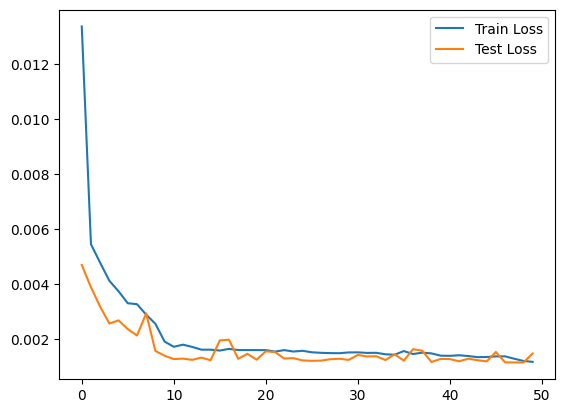

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step
MSE: 0.0014879178937053056
RMSE: 0.038573538776022424


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


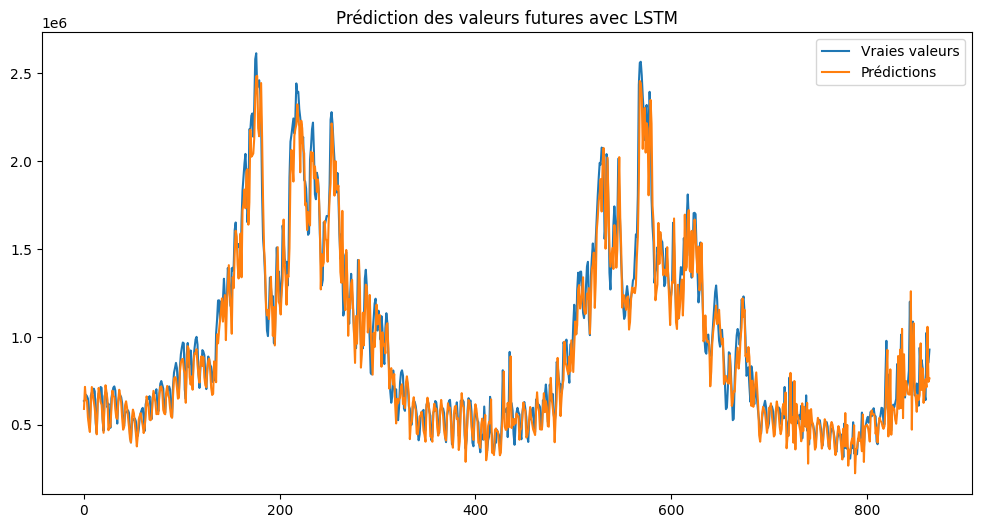

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(150, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='sgd', loss='mse')

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - loss: 0.0552 - val_loss: 0.0248
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.0270 - val_loss: 0.0207
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.0240 - val_loss: 0.0161
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.0204 - val_loss: 0.0135
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.0164 - val_loss: 0.0128
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.0129 - val_loss: 0.0089
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.0103 - val_loss: 0.0069
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.0082 - val_loss: 0.0060
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.0071 - val_loss: 0.0054
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.0063 - val_loss: 0.0052
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.0063 - val_loss: 0.0054
Epoch 12/50
109/109 ━━━━━━━━━━━━━━━

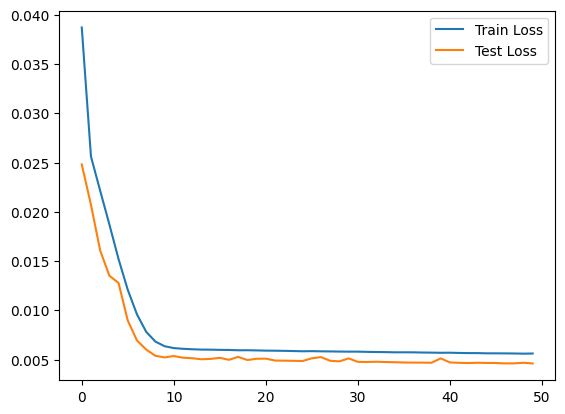

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step
MSE: 0.004596875612860114
RMSE: 0.06780026263120309
R2 Score: 0.8095206140193263


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step


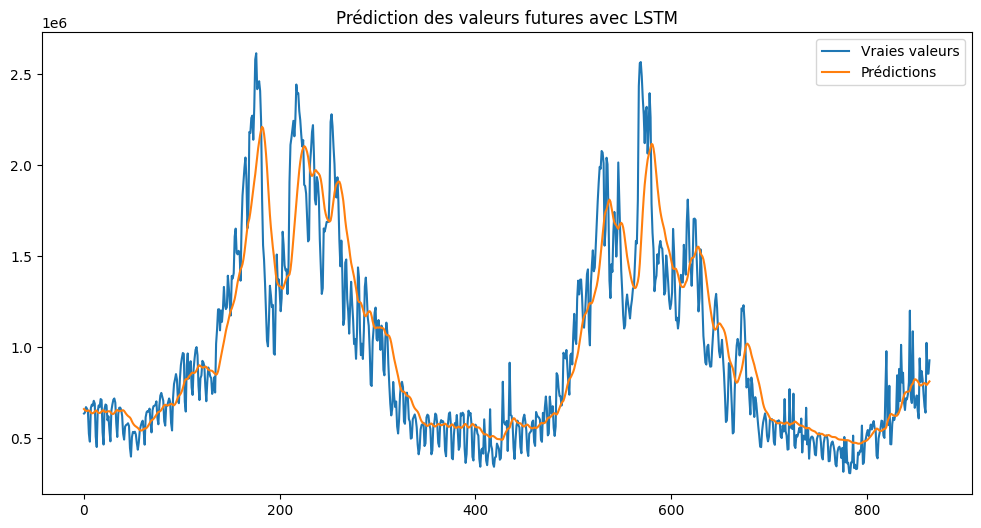

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 25s 167ms/step - loss: 0.0201 - val_loss: 0.0032
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0036 - val_loss: 0.0025
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0031 - val_loss: 0.0017
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.0027 - val_loss: 0.0014
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.0022 - val_loss: 0.0014
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0018 - val_loss: 0.0013
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0017 - val_loss: 9.5712e-04
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.0017 - val_loss: 8.8183e-04
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0016 - val_loss: 7.7688e-04
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.0011 - val_loss: 7.6635e-04
Epo

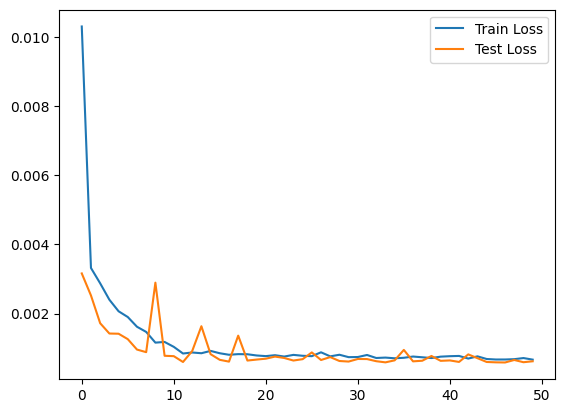

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step
MSE: 0.0012367936169824267
RMSE: 0.035168076674484586
R2 Score: 0.9487513457861323


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step


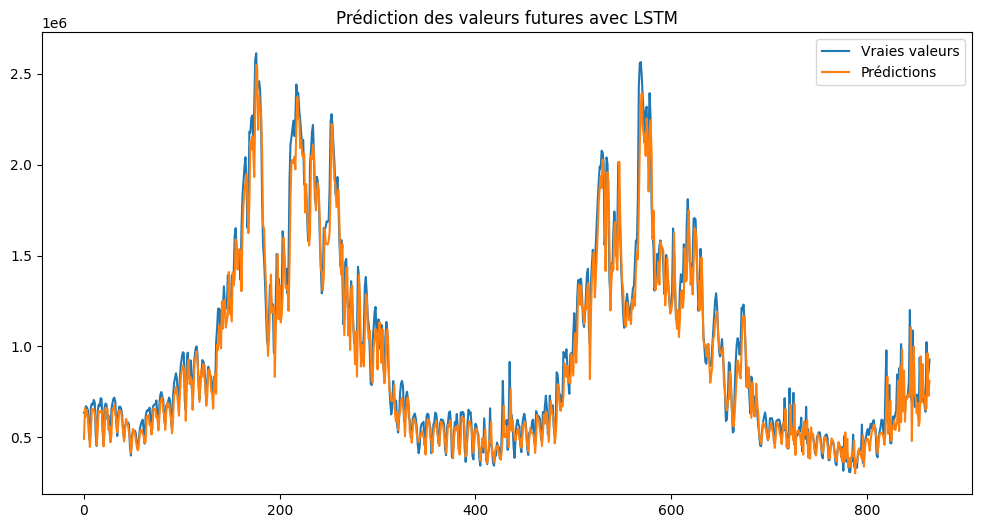

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='tanh', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(200, activation='tanh', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='tanh', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=70, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.0082 - val_loss: 0.0026
Epoch 2/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 0.0031 - val_loss: 0.0015
Epoch 3/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.0021 - val_loss: 0.0014
Epoch 4/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.0020 - val_loss: 0.0016
Epoch 5/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 0.0019 - val_loss: 0.0011
Epoch 6/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.0014 - val_loss: 7.4356e-04
Epoch 7/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 9.5637e-04 - val_loss: 6.6852e-04
Epoch 8/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - loss: 8.4998e-04 - val_loss: 9.2130e-04
Epoch 9/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - loss: 9.2224e-04 - val_loss: 6.9643e-04
Epoch 10/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - loss: 9.1897e-04 - val_loss: 6.9176e-04
Epoch 11/70
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - loss: 0.0010 - val_loss: 8.015

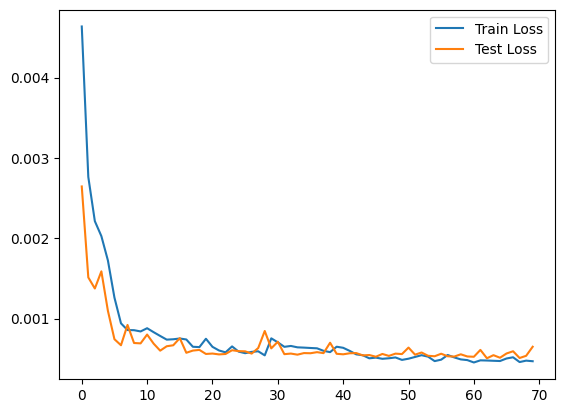

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
MSE: 0.0012994442966830382
RMSE: 0.036047805712456873
R2 Score: 0.9461553079539884


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step


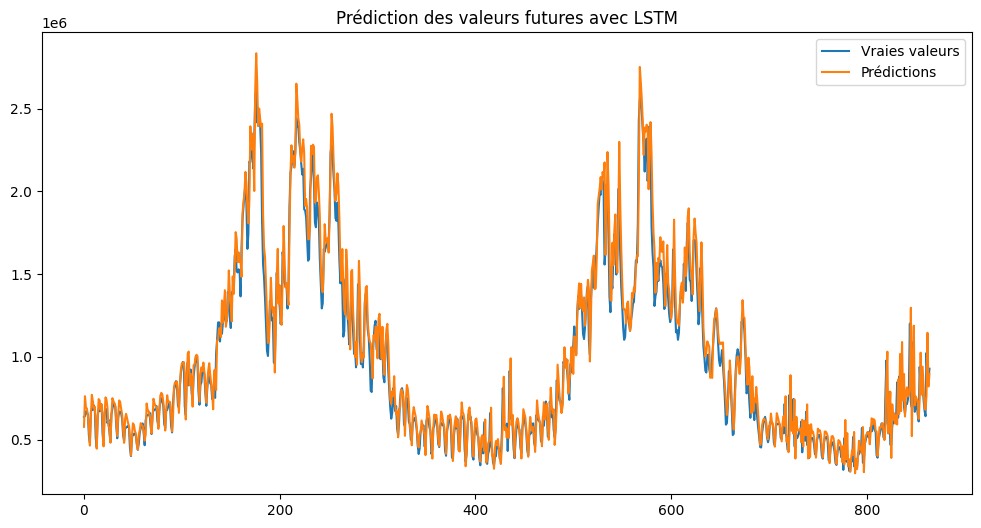

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


###Series after MAS

In [ ]:
series_mas = pd.Series([np.nan] * window + pred, index=series.index, name=series.name)
series_mas

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2012-01-01,NaN
2012-01-02,NaN
2012-01-03,NaN
2012-01-04,NaN
2012-01-05,NaN
...,...
2024-10-27,780177.200000
2024-10-28,779971.333333
2024-10-29,785906.500000


In [ ]:
series_mas.isna().sum()

30

In [ ]:
series_mas = series_mas[30:]
series_mas

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2012-01-31,2.148922e+06
2012-02-01,2.197101e+06
2012-02-02,2.241768e+06
2012-02-03,2.288811e+06
2012-02-04,2.339565e+06
...,...
2024-10-27,7.801772e+05
2024-10-28,7.799713e+05
2024-10-29,7.859065e+05


In [ ]:
from sklearn.preprocessing import MinMaxScaler


data = pd.DataFrame(series_mas)

# Normalisation des données
scaler = MinMaxScaler()
data['Consommation brute gaz totale (MW PCS 0°C)'] = scaler.fit_transform(data[['Consommation brute gaz totale (MW PCS 0°C)']])
data.head()

,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,
2012-01-31,0.712403
2012-02-01,0.732004
2012-02-02,0.750176
2012-02-03,0.769316
2012-02-04,0.789965


In [ ]:
def create_sequences(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)

window_size = 365  # Taille de la fenêtre (ajustable)
X, y = create_sequences(data['Consommation brute gaz totale (MW PCS 0°C)'].values, window_size)

In [ ]:
# Reshape pour RNN, LSTM, GRU (ajout de la dimension feature)
X_dl = X.reshape((X.shape[0], X.shape[1], 1))

In [ ]:
lenght_train = 0.8*len(X_dl)
X_train, y_train = X_dl[:int(lenght_train)], y[:int(lenght_train)]
X_test, y_test = X_dl[int(lenght_train):], y[int(lenght_train):]


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='tanh', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(200, activation='tanh', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='tanh', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.0109 - val_loss: 5.3629e-04
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 3.7515e-04 - val_loss: 2.6027e-04
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 2.9263e-04 - val_loss: 2.0629e-04
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - loss: 2.6878e-04 - val_loss: 2.0104e-04
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 2.3951e-04 - val_loss: 1.8271e-04
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 1.8750e-04 - val_loss: 1.1442e-04
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - loss: 1.1864e-04 - val_loss: 1.1945e-04
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 1.2832e-04 - val_loss: 7.1693e-05
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 9.6246e-05 - val_loss: 7.4424e-05
Epoch 10/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 7.4439e-05 - val_loss: 9.7417e-05
Epoch 11/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 59

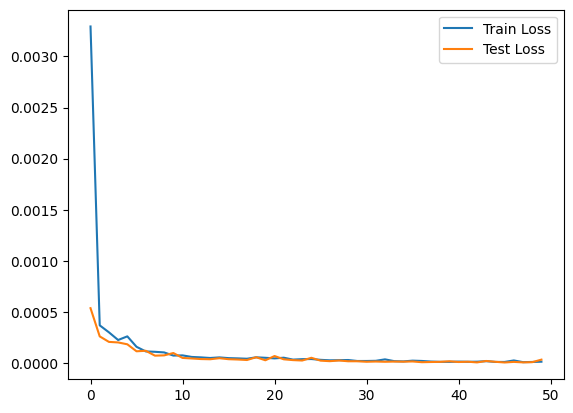

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
MSE: 6.510603401909994e-05
RMSE: 0.008068831019367052
R2 Score: 0.9982758509294287


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step


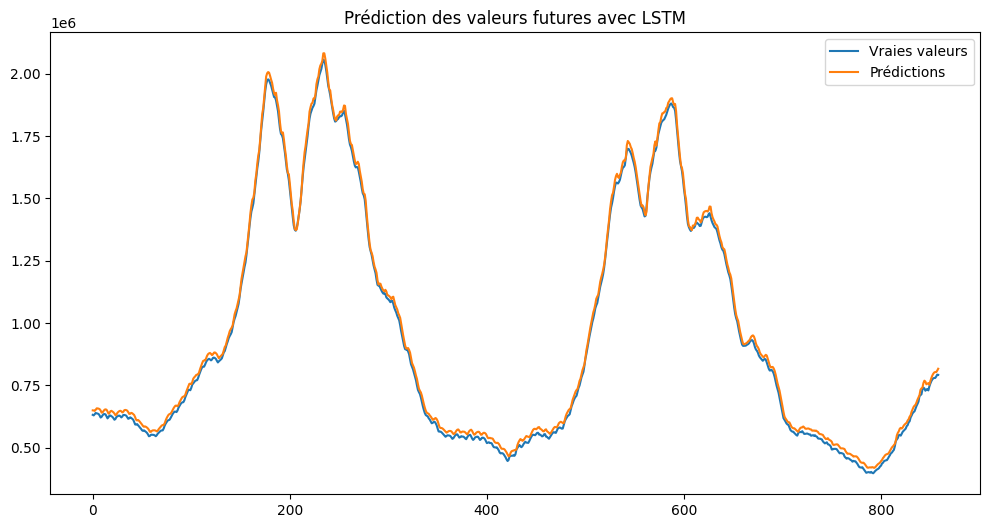

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


# GRU

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


109/109 ━━━━━━━━━━━━━━━━━━━━ 67s 49ms/step - loss: 0.0193 - val_loss: 0.0036
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - loss: 0.0033 - val_loss: 0.0034
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - loss: 0.0020 - val_loss: 0.0042
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - loss: 0.0016 - val_loss: 0.0022
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - loss: 0.0015 - val_loss: 0.0020
Epoch 12/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 

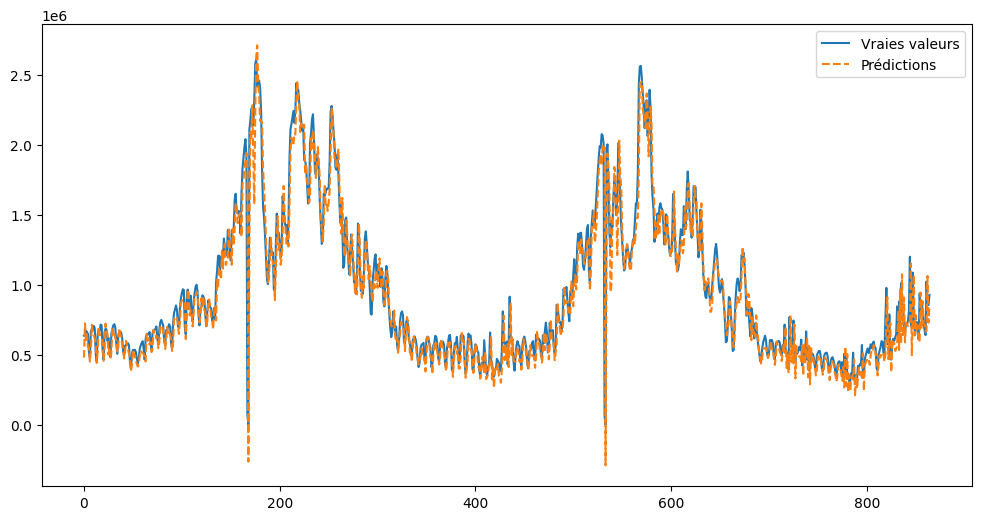

RMSE: 155179.66243208776
R² Score: 0.9122403621929818


In [ ]:

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split



scaler = MinMaxScaler()
series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

X, y = [], []
window_size = 365
for i in range(len(series_scaled) - window_size):
    X.append(series_scaled[i:i+window_size])
    y.append(series_scaled[i+window_size])

X, y = np.array(X), np.array(y)

X_dl = X.reshape((X.shape[0], X.shape[1], 1))
test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(X_dl, y, test_size=test_size, shuffle=False)
model_gru1 = Sequential([
    GRU(200, activation='tanh', return_sequences=True, kernel_initializer="glorot_uniform", input_shape=(window_size, 1)),
    Dropout(0.2),
    GRU(150, activation='tanh', kernel_initializer="glorot_uniform", return_sequences=True),
    Dropout(0.2),
    GRU(100, activation='tanh', kernel_initializer="glorot_uniform"),

    Dense(1)
])

model_gru1.compile(optimizer='adam', loss='mse')

model_gru1.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

predictions1 = model_gru1.predict(X_test)

predictions_inv1 = scaler.inverse_transform(predictions1)
y_inv1 = scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_inv1, label='Vraies valeurs')
plt.plot(predictions_inv1, label='Prédictions', linestyle='dashed')
plt.legend()
plt.show()
rmse1 = np.sqrt(mean_squared_error(y_inv1, predictions_inv1))
print(f'RMSE: {rmse1}')
r1 = r2_score(y_inv1, predictions_inv1)
print(f'R² Score: {r1}')
#RMSE 155179.66243208776 R² Score: 0.9122403621929818


In [ ]:

data_gaz_subset = data_gaz.tail(len(y_inv1.flatten()))

df_results_gru2 = pd.DataFrame({
    'Date': data_gaz_subset.index,
    'Consommation Réelle': y_inv1.flatten(),
    'Prédiction GRU': predictions_inv1.flatten()
})

df_results_gru2.to_csv("predictions_grugaz.csv", index=False)
print("Fichier CSV des prédictions sauvegardé avec succès !")

Fichier CSV des prédictions sauvegardé avec succès !


### * Consomation brute gaz total with two features of grtgaz and terega

In [ ]:
data_gaz_with_fetures = df[['Date - Heure', 'Consommation brute gaz (MW PCS 0°C) - GRTgaz', 'Consommation brute gaz (MW PCS 0°C) - Teréga', 'Consommation brute gaz totale (MW PCS 0°C)']]
data_gaz_with_fetures.head()

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C)
0,2024-10-31 23:00:00,30998.0,1734.0,32732.0
1,2024-10-31 22:00:00,33674.0,1867.0,35541.0
2,2024-10-31 21:00:00,37801.0,1969.0,39770.0
3,2024-10-31 20:00:00,40558.0,2094.0,42652.0
4,2024-10-31 19:00:00,41563.0,2188.0,43751.0


In [ ]:
data_gaz_with_fetures["Date - Heure"] = pd.to_datetime(data_gaz_with_fetures["Date - Heure"])
data_gaz_with_fetures.set_index('Date - Heure', inplace=True)  # Définir comme index
data_gaz_with_fetures.head()

<ipython-input-34-c2a0113d8410>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_gaz_with_fetures["Date - Heure"] = pd.to_datetime(data_gaz_with_fetures["Date - Heure"])


,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,,,
2024-10-31 23:00:00,30998.0,1734.0,32732.0
2024-10-31 22:00:00,33674.0,1867.0,35541.0
2024-10-31 21:00:00,37801.0,1969.0,39770.0
2024-10-31 20:00:00,40558.0,2094.0,42652.0
2024-10-31 19:00:00,41563.0,2188.0,43751.0


In [ ]:
data_gaz_with_fetures.isna().sum()

,0
Consommation brute gaz (MW PCS 0°C) - GRTgaz,98
Consommation brute gaz (MW PCS 0°C) - Teréga,100
Consommation brute gaz totale (MW PCS 0°C),101


In [ ]:
data_gaz_with_fetures = data_gaz_with_fetures.interpolate(method='linear', axis=0)
data_gaz_with_fetures.isna().sum()


,0
Consommation brute gaz (MW PCS 0°C) - GRTgaz,0
Consommation brute gaz (MW PCS 0°C) - Teréga,0
Consommation brute gaz totale (MW PCS 0°C),0


In [ ]:
data_gaz_with_fetures = data_gaz_with_fetures.resample('D').sum()
data_gaz_with_fetures

,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C)
Date - Heure,,,
2012-01-01,1355720.0,91095.0,1446815.0
2012-01-02,1669919.0,122026.0,1791945.0
2012-01-03,1872159.0,133594.0,2005753.0
2012-01-04,1870828.0,126770.0,1997598.0
2012-01-05,1906693.0,131737.0,2038430.0
...,...,...,...
2024-10-27,601025.0,40197.0,641222.0
2024-10-28,970701.0,53505.0,1024206.0
2024-10-29,805147.0,50758.0,855905.0


# ANN

In [ ]:
n_lags = 365

# Ajouter les lags de la colonne "Total_Gaz"
for i in range(1, n_lags + 1):
    data_gaz_with_fetures[f"lag_{i}"] = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"].shift(i)

# Supprimer les premières lignes avec NaN (car les premiers lags seront vides)
data_gaz_with_fetures.dropna(inplace=True)

data_gaz_with_fetures.shape
features = ["Consommation brute gaz (MW PCS 0°C) - GRTgaz", "Consommation brute gaz (MW PCS 0°C) - Teréga"] + [f"lag_{i}" for i in range(1, n_lags + 1)]
X_f = data_gaz_with_fetures[features].values

# Définir la target (Total_Gaz)
y_f = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"].values


<ipython-input-51-397e295e4382>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_gaz_with_fetures[f"lag_{i}"] = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"].shift(i)
<ipython-input-51-397e295e4382>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_gaz_with_fetures[f"lag_{i}"] = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"].shift(i)
<ipython-input-51-397e295e4382>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many 

In [ ]:
X_f.shape

(4323, 367)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_f)  # Mise à l'échelle des entrées
y_scaled = scaler.fit_transform(y_f.reshape(-1, 1))

In [ ]:
from tensorflow.keras import layers, regularizers

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42, shuffle=False)


In [ ]:
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(367,),
                       kernel_regularizer=regularizers.l2(0.001)),  # Régularisation L2
    keras.layers.Dropout(0.1),  # Réduction du Dropout
    keras.layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dense(1)  # Couche de sortie
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.1895 - mae: 0.1284 - val_loss: 0.1212 - val_mae: 0.0551
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 0.1160 - mae: 0.0729 - val_loss: 0.0863 - val_mae: 0.0494
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0833 - mae: 0.0638 - val_loss: 0.0635 - val_mae: 0.0433
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0612 - mae: 0.0538 - val_loss: 0.0480 - val_mae: 0.0431
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0462 - mae: 0.0478 - val_loss: 0.0367 - val_mae: 0.0419
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0362 - mae: 0.0488 - val_loss: 0.0290 - val_mae: 0.0428
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0280 - mae: 0.0411 - val_loss: 0.0227 - val_mae: 0.0374
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0222 - mae: 0.0387 - val_loss: 0.0191 - val_mae: 0.0442
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - l

In [ ]:
predictions = model.predict(X_test)

from sklearn.metrics import mean_squared_error, r2_score

# Calcul du MSE
mse = mean_squared_error(y_test, predictions)
print(f"MSE: {mse}")

# Calcul du R²
r2 = r2_score(y_test, predictions)
print(f"R²: {r2}")

import numpy as np

rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
MSE: 0.0015766378776646244
R²: 0.9489588574911373
RMSE: 0.03970689962291975


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0035 - mae: 0.0307
Erreur moyenne absolue : 0.03197832405567169


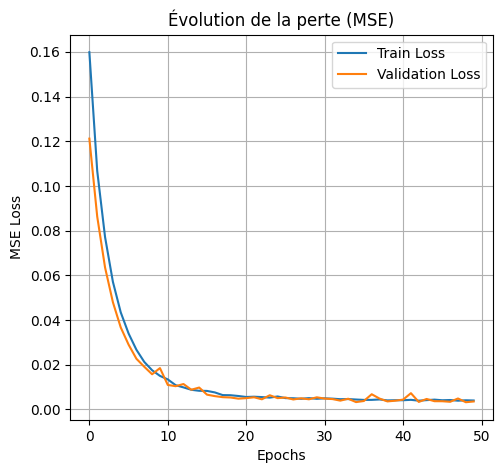

In [ ]:
loss, mae = model.evaluate(X_test, y_test)
print(f"Erreur moyenne absolue : {mae}")
import matplotlib.pyplot as plt

# Récupérer l'historique des pertes
history_dict = history.history

# Tracer la perte (MSE)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Évolution de la perte (MSE)')
plt.legend()
plt.grid()

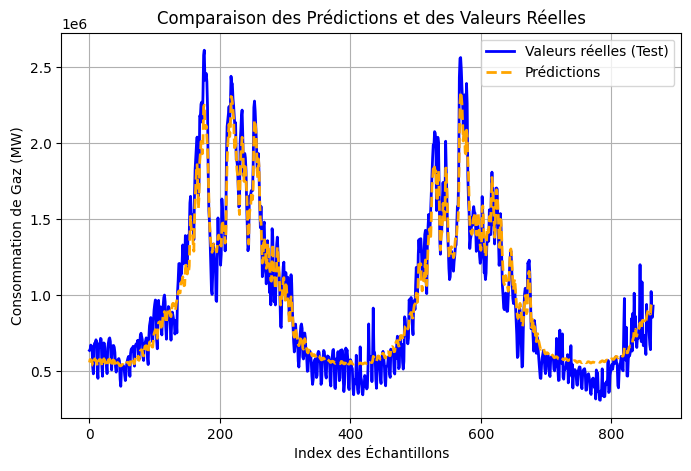

In [ ]:
y_pred_original = scaler.inverse_transform(predictions)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))
plt.figure(figsize=(8, 5))
plt.plot(y_test_original, label="Valeurs réelles (Test)", color="blue", linewidth=2)
plt.plot(y_pred_original, label="Prédictions", color="orange", linestyle="--", linewidth=2)
plt.title("Comparaison des Prédictions et des Valeurs Réelles")
plt.xlabel("Index des Échantillons")
plt.ylabel("Consommation de Gaz (MW)")
plt.legend()
plt.grid(True)
plt.show()

#### RNN : de Consomation brute gaz total with two features of grtgaz and terega

In [ ]:
# Préparation des données avec X1 et Y1
window_size = 365
X1, Y1 = [], []
for i in range(len(data_gaz_with_fetures) - window_size):
    X1.append(data_gaz_with_fetures.iloc[i:i+window_size].values)  # Séquence en entrée avec toutes les colonnes
    Y1.append(data_gaz_with_fetures.iloc[i+window_size]['Consommation brute gaz totale (MW PCS 0°C)'])  # Valeur cible

X1, Y1 = np.array(X1), np.array(Y1)

# Normalisation des données
scaler = MinMaxScaler(feature_range=(0, 1))
X1 = scaler.fit_transform(X1.reshape(-1, X1.shape[2])).reshape(X1.shape)  # Normalisation des séquences d'entrée
Y1 = scaler.fit_transform(Y1.reshape(-1, 1))  # Normalisation de la cible

In [ ]:
X1_train, X1_test = X1[:train_size], X1[train_size:]
Y1_train, Y1_test = Y1[:train_size], Y1[train_size:]
# Initialisation du modèle
model = Sequential()
model.add(SimpleRNN(50, activation='relu', return_sequences=True, input_shape=(X1_train.shape[1], X1_train.shape[2])))
model.add(SimpleRNN(50, activation='relu'))
model.add(Dense(1))  # Sortie avec une seule valeur
model.compile(optimizer='adam', loss='mean_squared_error')

# Résumé du modèle
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_9 (SimpleRNN)             │ (None, 365, 50)             │           2,700 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_10 (SimpleRNN)            │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,801 (30.47 KB)

 Trainable params: 7,801 (30.47 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Entraînement du modèle
history = model.fit(X1_train, Y1_train, epochs=20, batch_size=32, validation_data=(X1_test, Y1_test))

Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0595 - val_loss: 0.0026
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 28s 228ms/step - loss: 0.0032 - val_loss: 0.0019
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0022 - val_loss: 0.0016
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 35s 188ms/step - loss: 0.0021 - val_loss: 0.0016
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 22s 169ms/step - loss: 0.0014 - val_loss: 0.0016
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0014 - val_loss: 0.0013
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0012 - val_loss: 0.0014
Epoch 12/20
109/109

In [ ]:
# Prédictions
predictions = model.predict(X1_test)



28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step


In [ ]:
# Calcul du MSE, R², et RMSE
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(Y1_test, predictions)
r2 = r2_score(Y1_test, predictions)
rmse = np.sqrt(mse)
# Affichage des métriques
print(f"MSE: {mse}")
print(f"R²: {r2}")
print(f"RMSE: {rmse}")

MSE: 0.0013706661854046539
R²: 0.9556268632814111
RMSE: 0.037022509172186774


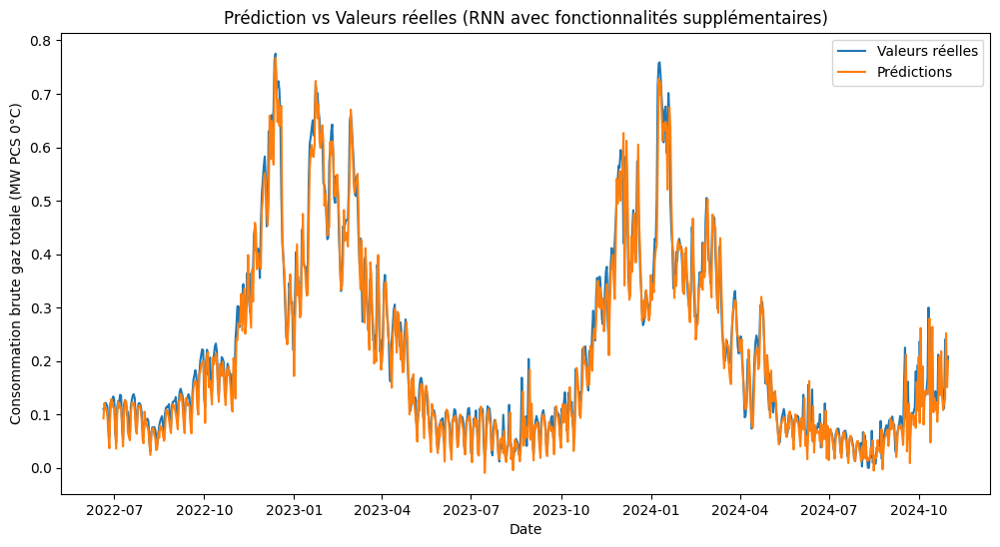

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(data_gaz_with_fetures.index[-len(Y1_test):], Y1_test, label='Valeurs réelles')
plt.plot(data_gaz_with_fetures.index[-len(Y1_test):], predictions, label='Prédictions')
plt.title('Prédiction vs Valeurs réelles (RNN avec fonctionnalités supplémentaires)')
plt.xlabel('Date')
plt.ylabel('Consommation brute gaz totale (MW PCS 0°C)')
plt.legend()
plt.show()

Inerpretation -->  L'ajout de ces deux nouvelles colonnes a permis d'améliorer légèrement les performances du modèle, avec une réduction de l'erreur MSE et une légère augmentation du R², ce qui indique une meilleure capacité à expliquer la variance des données.


#### lags --> avec LSTM

In [ ]:
# Nombre de lags
n_lags = 365

# Ajouter les lags de la colonne "Total_Gaz"
for i in range(1, n_lags + 1):
    data_gaz_with_fetures[f"lag_{i}"] = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"].shift(i)

# Supprimer les premières lignes avec NaN (car les premiers lags seront vides)
data_gaz_with_fetures.dropna(inplace=True)

data_gaz_with_fetures.shape

<ipython-input-130-48bbed723b3f>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_gaz_with_fetures[f"lag_{i}"] = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"].shift(i)
<ipython-input-130-48bbed723b3f>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_gaz_with_fetures[f"lag_{i}"] = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"].shift(i)
<ipython-input-130-48bbed723b3f>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` ma

(4323, 368)

In [ ]:
features = ["Consommation brute gaz (MW PCS 0°C) - GRTgaz", "Consommation brute gaz (MW PCS 0°C) - Teréga"] + [f"lag_{i}" for i in range(1, n_lags + 1)]
X_f = data_gaz_with_fetures[features] # Select features before scaling
y_f = data_gaz_with_fetures["Consommation brute gaz totale (MW PCS 0°C)"] # Select target before scaling
X_f

,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,...,lag_356,lag_357,lag_358,lag_359,lag_360,lag_361,lag_362,lag_363,lag_364,lag_365
Date - Heure,,,,,,,,,,,,,,,,,,,,,
2012-12-31,1571149.0,119030.0,1619704.0,1567417.0,1664058.0,1664935.0,1625375.0,1436937.0,1493738.0,1449945.0,...,2101160.0,2109822.0,1808600.0,1914766.0,2110627.0,2038430.0,1997598.0,2005753.0,1791945.0,1446815.0
2013-01-01,1546390.0,112121.0,1690179.0,1619704.0,1567417.0,1664058.0,1664935.0,1625375.0,1436937.0,1493738.0,...,2131675.0,2101160.0,2109822.0,1808600.0,1914766.0,2110627.0,2038430.0,1997598.0,2005753.0,1791945.0
2013-01-02,1812119.0,135644.0,1658511.0,1690179.0,1619704.0,1567417.0,1664058.0,1664935.0,1625375.0,1436937.0,...,2254425.0,2131675.0,2101160.0,2109822.0,1808600.0,1914766.0,2110627.0,2038430.0,1997598.0,2005753.0
2013-01-03,1790185.0,146101.0,1947763.0,1658511.0,1690179.0,1619704.0,1567417.0,1664058.0,1664935.0,1625375.0,...,2295264.0,2254425.0,2131675.0,2101160.0,2109822.0,1808600.0,1914766.0,2110627.0,2038430.0,1997598.0
2013-01-04,1705201.0,139428.0,1936286.0,1947763.0,1658511.0,1690179.0,1619704.0,1567417.0,1664058.0,1664935.0,...,2270743.0,2295264.0,2254425.0,2131675.0,2101160.0,2109822.0,1808600.0,1914766.0,2110627.0,2038430.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-27,601025.0,40197.0,674367.0,742003.0,824798.0,869553.0,809772.0,939254.0,609494.0,652060.0,...,1265850.0,1017929.0,1046113.0,1183326.0,1070581.0,905876.0,965201.0,956346.0,739883.0,799631.0
2024-10-28,970701.0,53505.0,641222.0,674367.0,742003.0,824798.0,869553.0,809772.0,939254.0,609494.0,...,1365574.0,1265850.0,1017929.0,1046113.0,1183326.0,1070581.0,905876.0,965201.0,956346.0,739883.0
2024-10-29,805147.0,50758.0,1024206.0,641222.0,674367.0,742003.0,824798.0,869553.0,809772.0,939254.0,...,1289891.0,1365574.0,1265850.0,1017929.0,1046113.0,1183326.0,1070581.0,905876.0,965201.0,956346.0


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Normalisation des données ***after feature and target selection***
scaler = MinMaxScaler()
X_f = scaler.fit_transform(X_f) # Scale only the features
y_f = scaler.fit_transform(y_f.values[:, None])


In [ ]:
X_f

array([[0.46048568, 0.50108789, 0.44102823, ..., 0.49928851, 0.43504745,
        0.33134919],
       [0.45155103, 0.46833745, 0.46473109, ..., 0.49683824, 0.49928851,
        0.43504745],
       [0.54744324, 0.57984253, 0.45408019, ..., 0.50910669, 0.49683824,
        0.49928851],
       ...,
       [0.18406263, 0.17746102, 0.24074437, ..., 0.16881787, 0.18664275,
        0.18398216],
       [0.18354154, 0.17984537, 0.18413968, ..., 0.21830537, 0.16881787,
        0.18664275],
       [0.21023362, 0.17699174, 0.1838232 , ..., 0.2521809 , 0.21830537,
        0.16881787]])

In [ ]:
X_f.shape

(4323, 367)

In [ ]:
# for DL models without ANN
X_dl_f = X_f.reshape((X_f.shape[0], X_f.shape[1], 1))

In [ ]:
lenght_train = 0.8*len(X_dl_f)
X_train, y_train = X_dl_f[:int(lenght_train)], y[:int(lenght_train)]
X_test, y_test = X_dl_f[int(lenght_train):], y[int(lenght_train):]



In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='mse') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.0489 - val_loss: 0.0078
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0096 - val_loss: 0.0082
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0094 - val_loss: 0.0060
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.0090 - val_loss: 0.0060
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0089 - val_loss: 0.0118
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.0100 - val_loss: 0.0070
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.0095 - val_loss: 0.0063
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0088 - val_loss: 0.0066
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.0088 - val_loss: 0.0068
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0087 - val_loss: 0.0077
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0089 - val_loss: 0.0094
Epoch 12/50
109/109 ━━━━━━━━━━━━━━━━━

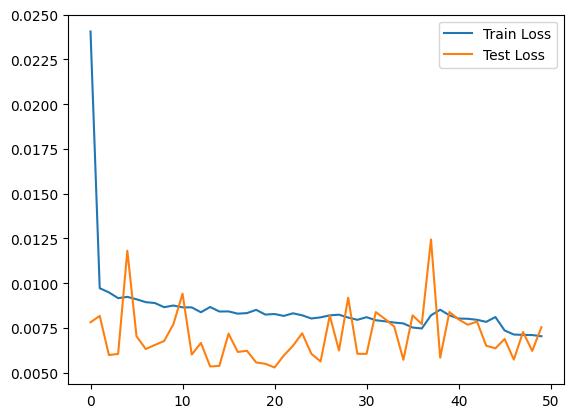

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step
MSE: 0.007541955633127452
RMSE: 0.08684443351837498
R2 Score: 0.6874861973483386


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


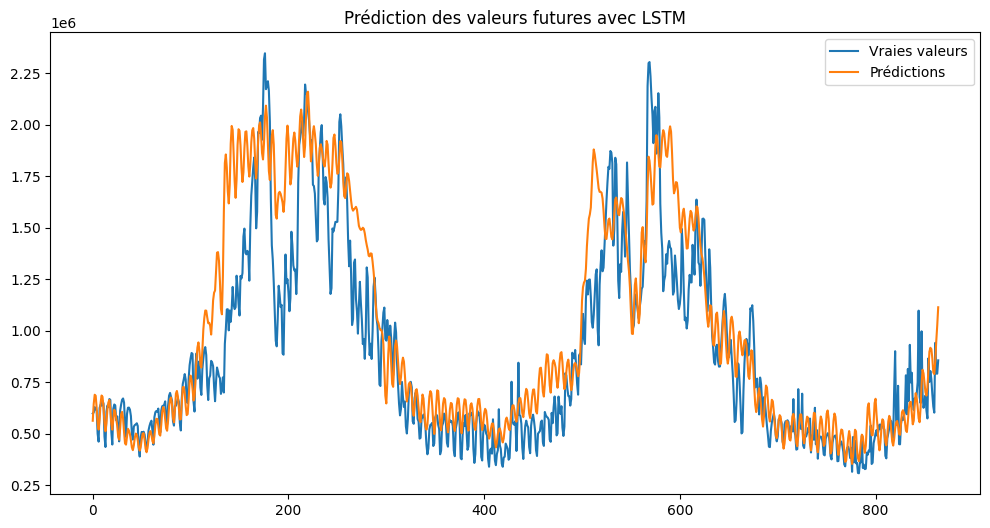

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 25s 170ms/step - loss: 0.0207 - val_loss: 0.0038
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 34s 128ms/step - loss: 0.0051 - val_loss: 0.0045
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0051 - val_loss: 0.0042
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.0047 - val_loss: 0.0041
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0050 - val_loss: 0.0029
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.0047 - val_loss: 0.0040
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.0049 - val_loss: 0.0032
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.0046 - val_loss: 0.0034
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.0045 - val_loss: 0.0033
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 128ms/step - loss: 0.0048 - val_loss: 0.0057
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 0.0052 - val_loss: 0.0050
Epoch 12/50
109/109

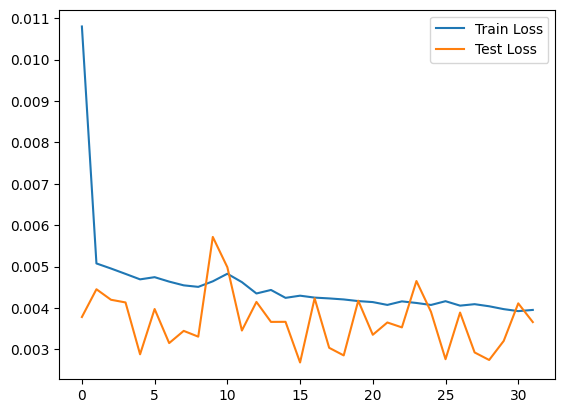

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

## gru

In [ ]:
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data_gaz_with_fetures)

window_size = 365
X, y = [], []

for i in range(len(data_scaled) - window_size):
    X.append(data_scaled[i:i + window_size])
    y.append(data_scaled[i + window_size, -1])

X, y = np.array(X), np.array(y)

X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

model = Sequential([
    GRU(128, activation='tanh', return_sequences=True, input_shape=(window_size, X.shape[2])),
    Dropout(0.2),
    GRU(64, activation='tanh'),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

# Compilation du modèle avec une loss robuste aux outliers
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tf.keras.losses.Huber())

history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

y_pred = model.predict(X_test)

y_test_inv = scaler.inverse_transform(np.c_[np.zeros((len(y_test), 2)), y_test])[:, -1]
y_pred_inv = scaler.inverse_transform(np.c_[np.zeros((len(y_pred), 2)), y_pred])[:, -1]



Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0090 - val_loss: 0.0012
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0020 - val_loss: 0.0011
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0018 - val_loss: 9.5242e-04
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.0016 - val_loss: 7.7070e-04
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.0014 - val_loss: 6.4457e-04
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 9.8467e-04 - val_loss: 7.3898e-04
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step - loss: 0.0011 - val_loss: 6.6674e-04
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - loss: 9.3341e-04 - val_loss: 6.1645e-04
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0010 - val_loss: 6.1481e-04
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 9.7097e-04 - val_loss: 8.0334e-04
Epoch 

NameError: name 'mean_absolute_error' is not defined

RMSE: 113045.67150407676
R² Score: 0.9532019659321878


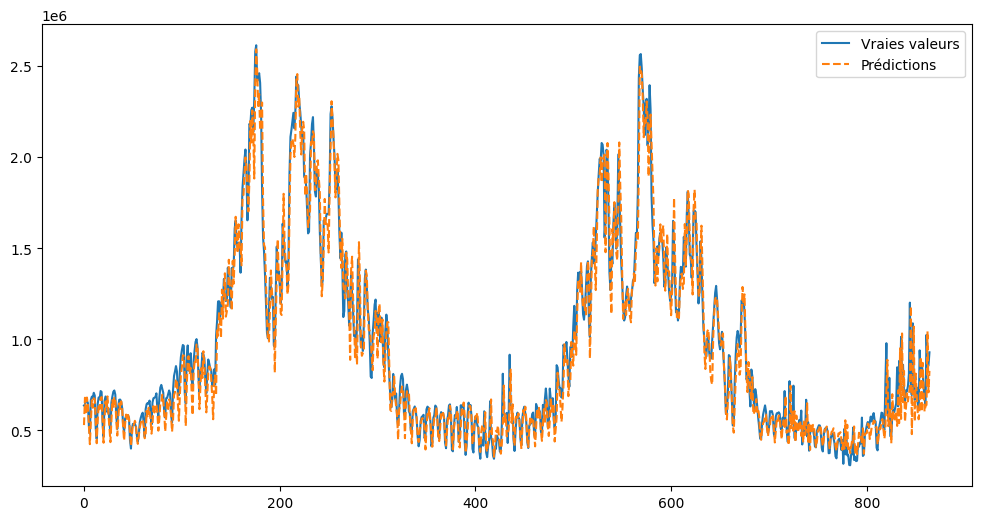

In [ ]:
rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'RMSE: {rmse}')
print(f'R² Score: {r2}')

plt.figure(figsize=(12, 6))
plt.plot(y_test_inv, label="Vraies valeurs")
plt.plot(y_pred_inv, label="Prédictions", linestyle="dashed")
plt.legend()
plt.show()

In [ ]:

data_gaz_with_fetures_subset = data_gaz_with_fetures.tail(len(y_test_inv.flatten()))

df_results_gru2 = pd.DataFrame({
    'Date': data_gaz_with_fetures_subset.index,
    'Consommation Réelle': y_test_inv.flatten(),
    'Prédiction GRU': y_pred_inv.flatten()
})

df_results_gru2.to_csv("predictions_gru2f.csv", index=False)
print("Fichier CSV des prédictions sauvegardé avec succès !")

Fichier CSV des prédictions sauvegardé avec succès !


# Consommation brute électricité (MW) - RTE

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('/content/data_filtred_v2.csv')
df.head()

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
0,2024-10-31 23:00:00,30998.0,1734.0,32732.0,47753.0,80485.0,31/10/2024,23:00
1,2024-10-31 22:00:00,33674.0,1867.0,35541.0,47498.0,83039.0,31/10/2024,22:00
2,2024-10-31 21:00:00,37801.0,1969.0,39770.0,47832.0,87602.0,31/10/2024,21:00
3,2024-10-31 20:00:00,40558.0,2094.0,42652.0,50389.0,93041.0,31/10/2024,20:00
4,2024-10-31 19:00:00,41563.0,2188.0,43751.0,53387.0,97138.0,31/10/2024,19:00


In [ ]:
#data_grtgaz = df[['Date', 'Heure', 'Consommation brute gaz (MW PCS 0°C) - GRTgaz']]
#data_terega = df[['Date', 'Heure', 'Consommation brute gaz (MW PCS 0°C) - Teréga']]
data_rte = df[['Date - Heure', 'Consommation brute électricité (MW) - RTE']]
data_total = df[['Date - Heure', 'Consommation brute totale (MW)']]

In [ ]:
data_rte.head()

,Date - Heure,Consommation brute électricité (MW) - RTE
0,2024-10-31 23:00:00,47753.0
1,2024-10-31 22:00:00,47498.0
2,2024-10-31 21:00:00,47832.0
3,2024-10-31 20:00:00,50389.0
4,2024-10-31 19:00:00,53387.0


In [ ]:
data_rte["Date - Heure"] = pd.to_datetime(data_rte["Date - Heure"])


<ipython-input-4-cbf522f62a6b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_rte["Date - Heure"] = pd.to_datetime(data_rte["Date - Heure"])


In [ ]:
data_rte.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112512 entries, 0 to 112511
Data columns (total 2 columns):
 #   Column                                     Non-Null Count   Dtype         
---  ------                                     --------------   -----         
 0   Date - Heure                               112512 non-null  datetime64[ns]
 1   Consommation brute électricité (MW) - RTE  112509 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.7 MB


In [ ]:
data_rte.set_index('Date - Heure', inplace=True)
series_rte = pd.Series(data_rte['Consommation brute électricité (MW) - RTE'])
series_rte

,Consommation brute électricité (MW) - RTE
Date - Heure,
2024-10-31 23:00:00,47753.0
2024-10-31 22:00:00,47498.0
2024-10-31 21:00:00,47832.0
2024-10-31 20:00:00,50389.0
2024-10-31 19:00:00,53387.0
...,...
2012-01-01 04:00:00,49160.0
2012-01-01 03:00:00,52496.0
2012-01-01 02:00:00,55531.0


In [ ]:
series_rte.isna().sum()

3

In [ ]:
series_rte = series_rte.interpolate(method='linear')
series_rte.isna().sum()

0

In [ ]:
series_rte = series_rte.resample('D').sum()
series_rte

,Consommation brute électricité (MW) - RTE
Date - Heure,
2012-01-01,1237536.0
2012-01-02,1453549.0
2012-01-03,1625894.0
2012-01-04,1632020.0
2012-01-05,1660291.0
...,...
2024-10-27,986420.0
2024-10-28,1123980.0
2024-10-29,1156473.0


In [ ]:
series_rte.isna().sum()

0

<Axes: >

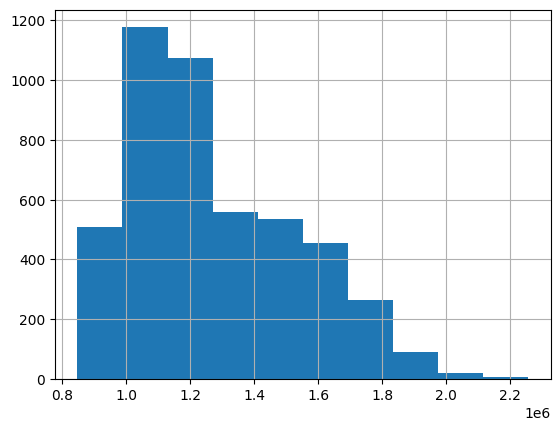

In [ ]:
series_rte.hist()

<Axes: xlabel='Date - Heure'>

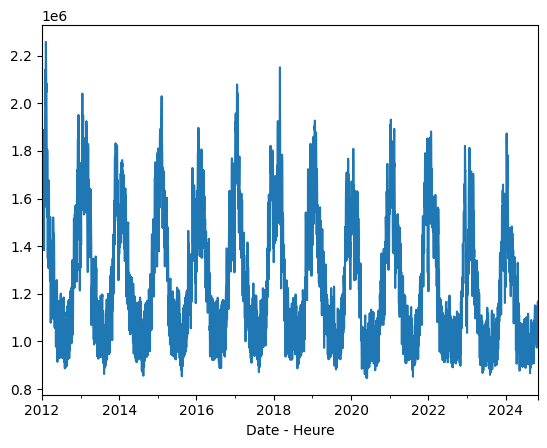

In [ ]:
series_rte.plot()

<Axes: xlabel='Date - Heure'>

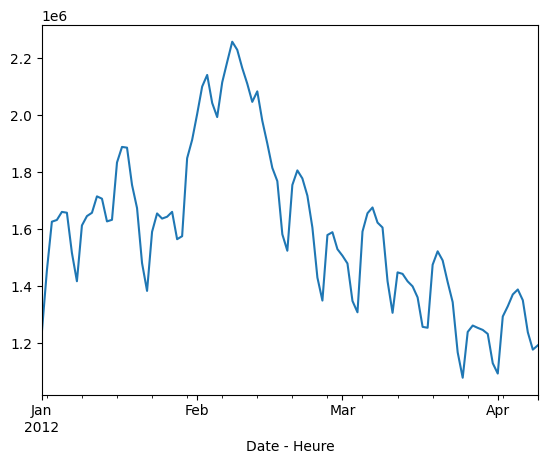

In [ ]:
series_rte[:100].plot()

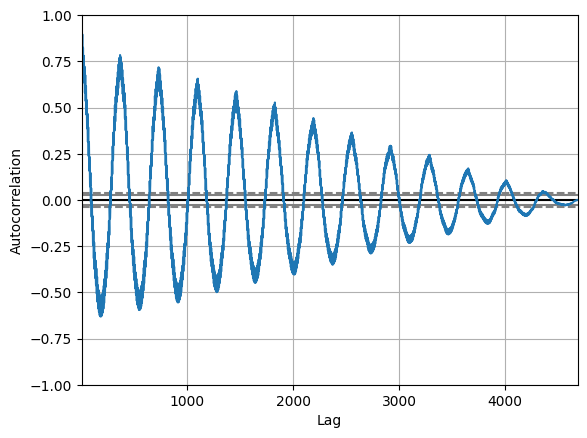

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_rte)
plt.show()

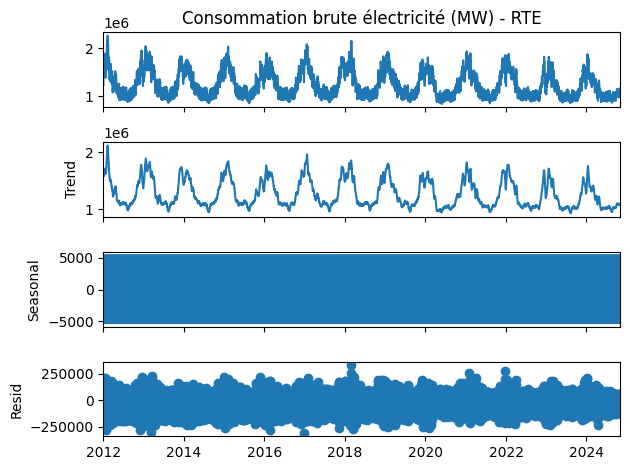

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(series_rte, model='additive', period=12)
result.plot()
plt.show()

In [ ]:
size = len(series_rte)/2
mean_1 = series_rte[:int(size)].mean()
std_1 = series_rte[:int(size)].std()
mean_2 = series_rte[int(size):].mean()
std_2 = series_rte[int(size):].std()

print("mean 1:",mean_1," std 1 :",std_1)
print("mean 2:",mean_2," std 2 :",std_2)

mean 1: 1318769.0255972696  std 1 : 269637.9491209155
mean 2: 1228671.2815699659  std 2 : 241543.4600575401


In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(series_rte)
print("ADF stats : ", result[0])
print("p-value : ", result[1])
print("Critical value:")
for key,value in result[4].items():
    print(key,"  :  ",value)


ADF stats :  -4.623627037270771
p-value :  0.00011681863383080069
Critical value:
1%   :   -3.431755263940016
5%   :   -2.862160964607231
10%   :   -2.5671005419475


<ipython-input-78-eb2d4fe9b727>:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history = [series_rte[i] for i in range(window)]
<ipython-input-78-eb2d4fe9b727>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  test = [series_rte[i] for i in range(window,len(series_rte))]


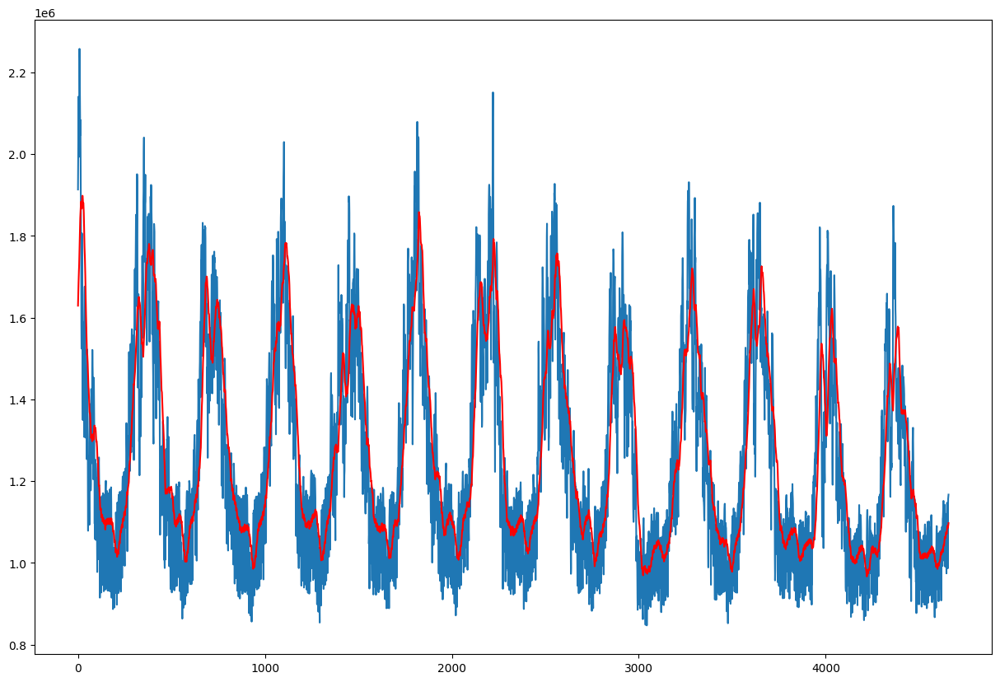

In [ ]:

window = 30
history = [series_rte[i] for i in range(window)]
test = [series_rte[i] for i in range(window,len(series_rte))]
pred = []
for t in range(len(test)):
    length = len(history)
    yhat = np.mean([history[i] for i in range(length-window,length)])
    pred.append(yhat)
    history.append(test[t])

plt.figure(figsize=(15,10))
plt.plot(test)
plt.plot(pred, color='red')
plt.show()

<ipython-input-79-8f351f2fe108>:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history = [series_rte[i] for i in range(window)]
<ipython-input-79-8f351f2fe108>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  test = [series_rte[i] for i in range(window,len(series_rte))]


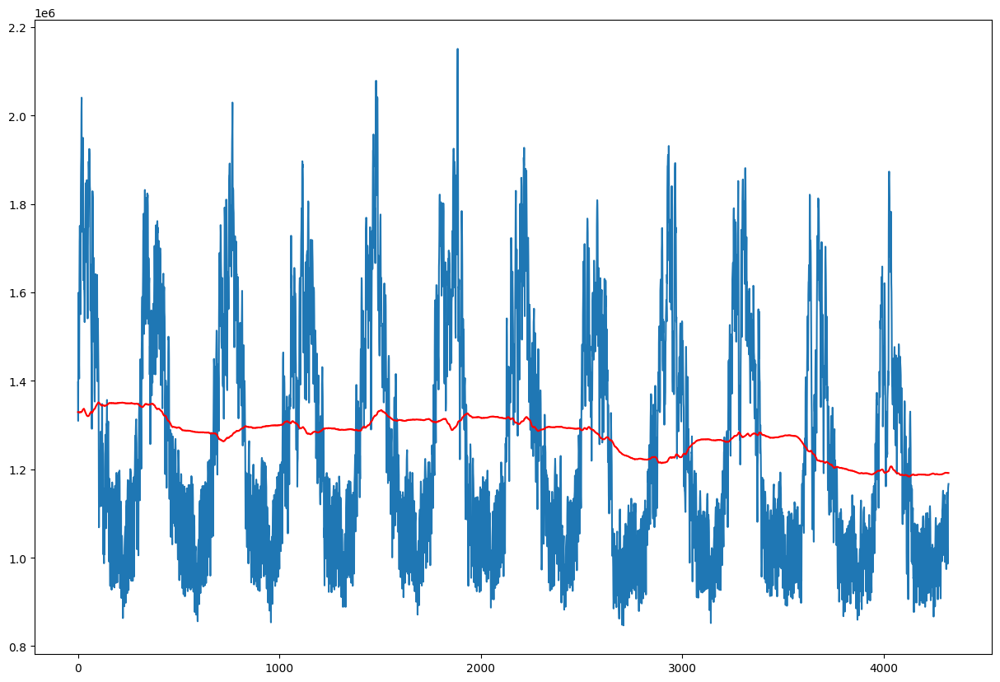

In [ ]:

window = 365
history = [series_rte[i] for i in range(window)]
test = [series_rte[i] for i in range(window,len(series_rte))]
pred = []
for t in range(len(test)):
    length = len(history)
    yhat = np.mean([history[i] for i in range(length-window,length)])
    pred.append(yhat)
    history.append(test[t])

plt.figure(figsize=(15,10))
plt.plot(test)
plt.plot(pred, color='red')
plt.show()

**ARMA ARIMA**

In [ ]:
##calcule de correlation
from pandas import *
values=DataFrame(series_rte.values) # facilite la création des lagged values
dataframe=concat([values.shift(1),values],axis=1)
dataframe.columns=['t','t+1']
dataframe
result= dataframe.corr()
result

,t,t+1
t,1.00000,0.94171
t+1,0.94171,1.00000


In [ ]:
values=DataFrame(series_rte.values) # facilite la création des lagged values
dataframe=concat([values.shift(20),values],axis=1)
dataframe.columns=['t','t+20']
dataframe
result= dataframe.corr()
result

,t,t+20
t,1.000000,0.747877
t+20,0.747877,1.000000


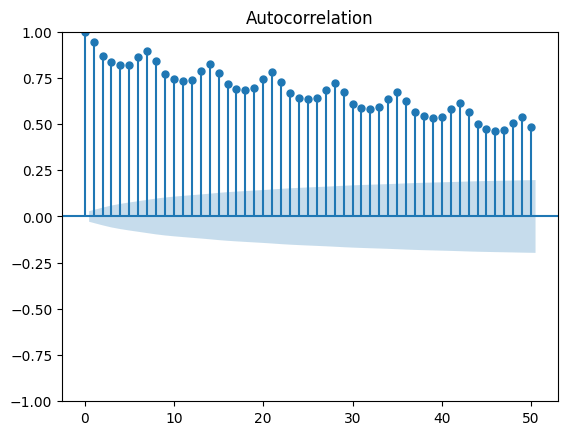

In [ ]:
#verification de la correlation à l'aide de plot_acf
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(series_rte,lags=50)
plt.show()

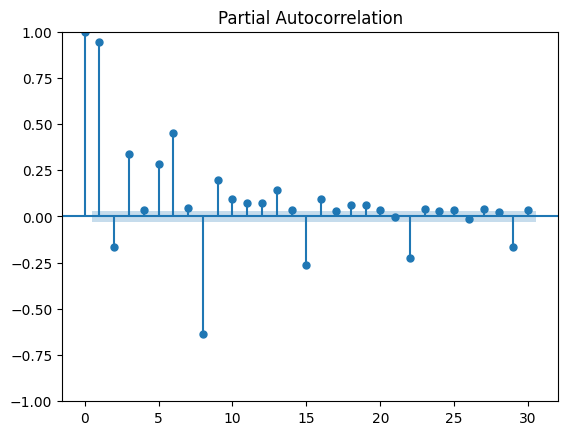

In [ ]:
# Visualiser le PACF pour identifier l'ordre p
# utilité de p : . Le modèle AR(p) utilise les p dernières observations pour prédire la valeur à t
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(series_rte, lags=30)
plt.show()

In [ ]:
n=len(series_rte)
train_data_rte= series_rte[:int(0.8*n)] #80% pour le train
test_data_rte= series_rte[int(0.8*n):] #20% pour le test

In [ ]:
#model autoreg
#apres savoir qu'il y a une correlation entre les var et les lagged et le choix de p alors on va creer le model AR(1)
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
from math import sqrt
model=AutoReg(train_data_rte,lags=15)
model_fit=model.fit()
coef=model_fit.params
print('Coefficients: %s' % coef)

Coefficients: const                                            22206.280826
Consommation brute électricité (MW) - RTE.L1         1.088082
Consommation brute électricité (MW) - RTE.L2        -0.222968
Consommation brute électricité (MW) - RTE.L3         0.047171
Consommation brute électricité (MW) - RTE.L4        -0.046486
Consommation brute électricité (MW) - RTE.L5         0.026949
Consommation brute électricité (MW) - RTE.L6         0.029459
Consommation brute électricité (MW) - RTE.L7         0.473026
Consommation brute électricité (MW) - RTE.L8        -0.602601
Consommation brute électricité (MW) - RTE.L9         0.111857
Consommation brute électricité (MW) - RTE.L10        0.017231
Consommation brute électricité (MW) - RTE.L11        0.023838
Consommation brute électricité (MW) - RTE.L12       -0.071641
Consommation brute électricité (MW) - RTE.L13        0.051350
Consommation brute électricité (MW) - RTE.L14        0.323313
Consommation brute électricité (MW) - RTE.L15       -0.2

In [ ]:
from sklearn.metrics import mean_squared_error
import pandas as pd
# Prédire les valeurs pour les données de test
predictions_1_rte = model_fit.predict(start=len(train_data_rte), end=len(series_rte) - 1,dynamic=False)

# Afficher les prédictions et les valeurs attendues
for i in range(len(predictions_1_rte)):
    print(f'Predicted={predictions_1_rte[i]:.3f}, Expected={test_data_rte[i]:.3f}')


<ipython-input-34-36cdebf422f6>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Predicted={predictions_1_rte[i]:.3f}, Expected={test_data_rte[i]:.3f}')


Predicted=1455087.949, Expected=1396961.000
Predicted=1351257.541, Expected=1299474.000
Predicted=1281299.387, Expected=1236460.000
Predicted=1366992.405, Expected=1300058.000
Predicted=1334722.732, Expected=1248968.000
Predicted=1310378.402, Expected=1231934.000
Predicted=1340598.027, Expected=1189276.000
Predicted=1439722.556, Expected=1128624.000
Predicted=1378177.828, Expected=1009084.000
Predicted=1334373.200, Expected=957021.000
Predicted=1423225.834, Expected=982547.000
Predicted=1394900.591, Expected=1141118.000
Predicted=1357984.542, Expected=1181117.000
Predicted=1372587.274, Expected=1173821.000
Predicted=1439493.240, Expected=1142748.000
Predicted=1366058.448, Expected=1051171.000
Predicted=1314578.195, Expected=1021611.000
Predicted=1385939.940, Expected=1161817.000
Predicted=1360637.316, Expected=1175976.000
Predicted=1322891.942, Expected=1161317.000
Predicted=1345425.648, Expected=1145840.000
Predicted=1414643.132, Expected=1122651.000
Predicted=1355147.345, Expected=10

In [ ]:

# Calculer le RMSE
rmse = sqrt(mean_squared_error(test_data_rte, predictions_1_rte))
print(f'Test RMSE AR sans walkforward: {rmse:.3f}')

Test RMSE AR sans walkforward: 250112.394


In [ ]:
#prediction à la main
# Initialiser l'historique avec les données d'entraînement
history = list(train_data_rte)  # Convertir train_data en liste
window = 15  #taille de la fenetre
coef = list(coef.values)  #les coeff trouvées depuis le modele
predictions_2_rte = []  # Liste pour stocker les prédictions

# Parcourir les données de test
for t in range(len(test_data_rte)):
    # Créer la fenêtre (lag) avec les données passées
    lag = [history[i] for i in range(len(history) - window, len(history))]

    # Initialiser la prédiction avec le premier coefficient (biais)
    yhat = coef[0]

    # Ajouter l'effet de chaque lag (valeur passée multipliée par son coefficient)
    for j in range(window):
        yhat += lag[j] * coef[window - j]

    # Ajouter la prédiction à la liste
    predictions_2_rte.append(yhat)

    # Ajouter la valeur réelle de test_data[t] à l'historique pour la prochaine prédiction
    history.append(test_data_rte[t])

# Afficher les prédictions et les valeurs attendues
for i in range(len(test_data_rte)):
    print(f'Predicted={predictions_2_rte[i]:.3f}, Expected={test_data_rte[i]:.3f}')




Predicted=1455087.949, Expected=1396961.000
Predicted=1288010.655, Expected=1299474.000
Predicted=1237915.078, Expected=1236460.000
Predicted=1327007.602, Expected=1300058.000
Predicted=1272149.713, Expected=1248968.000
Predicted=1230720.020, Expected=1231934.000
Predicted=1270183.758, Expected=1189276.000
Predicted=1261399.268, Expected=1128624.000
Predicted=1081110.748, Expected=1009084.000
Predicted=997852.187, Expected=957021.000
Predicted=1071215.489, Expected=982547.000
Predicted=982682.404, Expected=1141118.000
Predicted=1175861.083, Expected=1181117.000
Predicted=1178970.993, Expected=1173821.000
Predicted=1164068.171, Expected=1142748.000
Predicted=1061708.991, Expected=1051171.000
Predicted=1023758.519, Expected=1021611.000
Predicted=1080555.773, Expected=1161817.000
Predicted=1256867.447, Expected=1175976.000
Predicted=1175521.371, Expected=1161317.000
Predicted=1146584.563, Expected=1145840.000
Predicted=1110500.422, Expected=1122651.000
Predicted=1042304.722, Expected=1013

<ipython-input-36-5fcef65e6a57>:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history.append(test_data_rte[t])
<ipython-input-36-5fcef65e6a57>:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Predicted={predictions_2_rte[i]:.3f}, Expected={test_data_rte[i]:.3f}')


In [ ]:
# Calculer le RMSE
rmse = sqrt(mean_squared_error(test_data_rte, predictions_2_rte))
print(f'Test RMSE de AR avec walkforward: {rmse:.3f}')

Test RMSE de AR avec walkforward: 44140.689


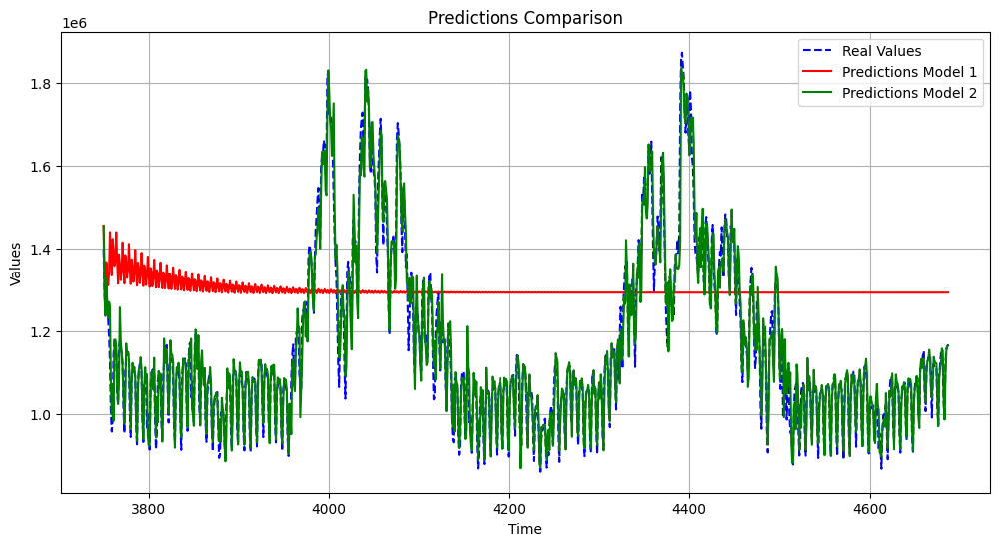

In [ ]:
import matplotlib.pyplot as plt

# Indices pour le jeu de données de test (après les données d'entraînement)
test_index = range(len(train_data_rte), len(train_data_rte) + len(test_data_rte))

# Tracer les courbes
plt.figure(figsize=(12, 6))
#Valeurs reels
plt.plot(test_index, test_data_rte, label="Real Values", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle 1
plt.plot(test_index, predictions_1_rte, label="Predictions Model 1", color='red')

# Courbe des prédictions du modèle 2
plt.plot(test_index, predictions_2_rte, label="Predictions Model 2", color='green')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


In [ ]:
# Calcul des erreurs résiduelles pour chaque modèle
residuals_1_rte = test_data_rte - predictions_1_rte
residuals_2_rte = test_data_rte - predictions_2_rte

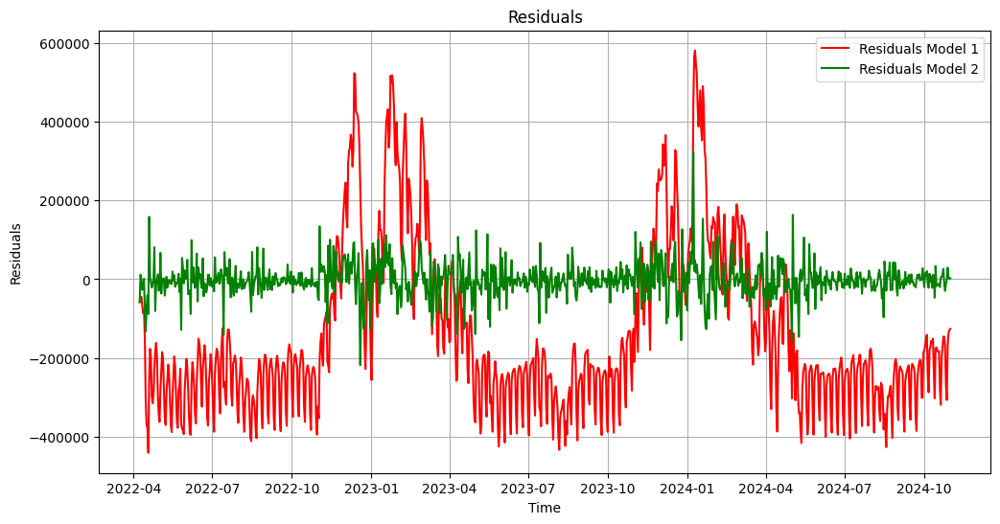

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(residuals_1_rte, label="Residuals Model 1", color='red')
plt.plot(residuals_2_rte, label="Residuals Model 2", color='green')
plt.title("Residuals")
plt.xlabel("Time")
plt.ylabel("Residuals")
plt.legend()
plt.grid()
plt.show()

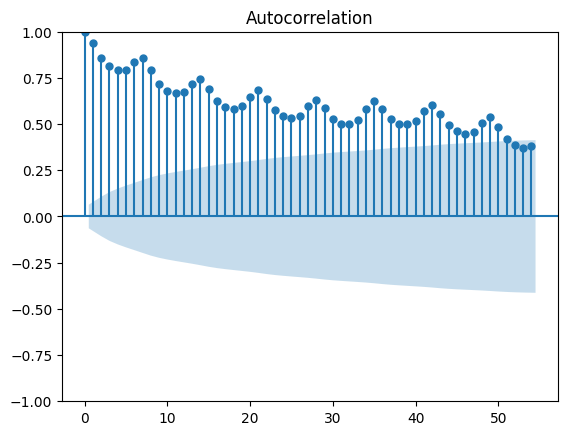

In [ ]:
#verification de q à partir de residus de model 1 à ameleorer
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(residuals_1_rte,lags=54)
plt.show()


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Paramètre q déterminé via l'ACF
q = 48

# Ajustement du modèle MA sur les résiduels
ma_model = ARIMA(residuals_1_rte, order=(0, 0, q)).fit()



# Prédiction pour les données de test
predictions_ma = ma_model.predict()


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


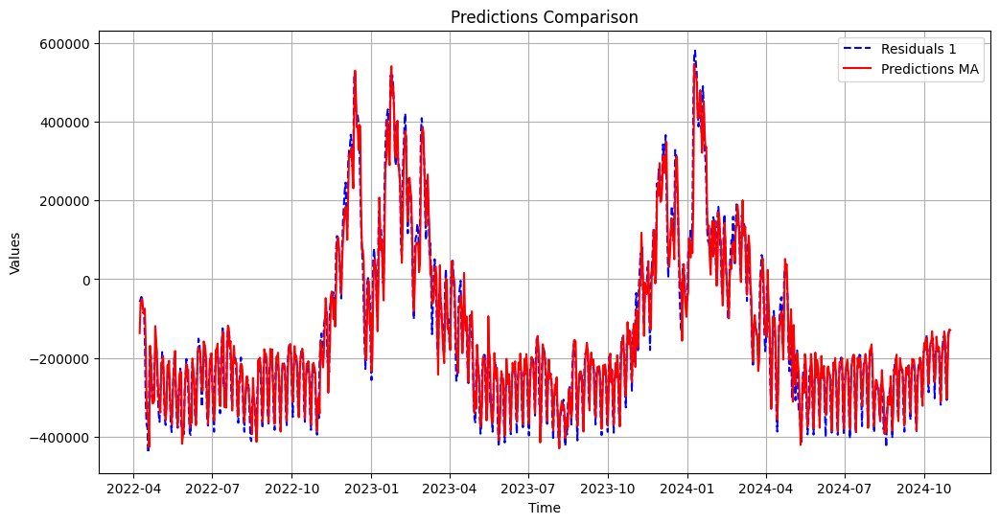

In [ ]:
import numpy as np
# Tracer les courbes
plt.figure(figsize=(12, 6))
plt.plot(residuals_1_rte, label="Residuals 1", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle MA
plt.plot(predictions_ma, label="Predictions MA", color='red')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


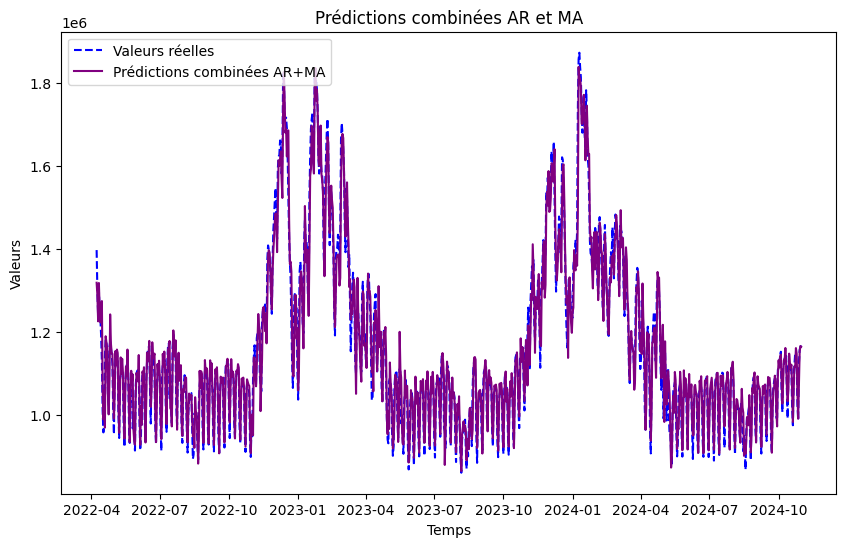

In [ ]:
predictions_combined_rte = predictions_1_rte + predictions_ma
import numpy as np
# Tracer les données réelles, les prédictions AR, MA, et combinées
plt.figure(figsize=(10, 6))
plt.plot(test_data_rte, label='Valeurs réelles', color='blue', linestyle='dashed')

plt.plot(predictions_combined_rte, label='Prédictions combinées AR+MA', color='purple')
plt.title('Prédictions combinées AR et MA')
plt.xlabel('Temps')
plt.ylabel('Valeurs')
plt.legend()
plt.show()


In [ ]:
# Calculer le RMSE des prédictions combinées
rmse_combined_rte = np.sqrt(mean_squared_error(test_data_rte, predictions_combined_rte))
print(f"RMSE des Prédictions combinées AR+MA: {rmse_combined_rte}")

RMSE des Prédictions combinées AR+MA: 43523.41694936044


In [ ]:
from sklearn.metrics import r2_score
# Calcul du R²
r2 = r2_score(test_data_rte.values, predictions_combined_rte)

print(f"Coefficient de détermination (R²) de ARMA: {r2:.4f}")


Coefficient de détermination (R²) de ARMA: 0.9557


In [ ]:
# Recherche par grille pour les paramètres ARIMA
import itertools
def grid_search_arima(train_data, p_values, d_values, q_values):
    best_score, best_cfg = float("inf"), None #initialisation de aic à plus petit float et la conf à none
    for p, d, q in itertools.product(p_values, d_values, q_values): #genere toutes les combinaisons possibles des valeurs de p, d, et q
        try:
            model = ARIMA(train_data, order=(p, d, q))
            model_fit = model.fit()
            aic = model_fit.aic
            if aic < best_score:
                best_score, best_cfg = aic, (p, d, q)
        except:
            continue
    return best_cfg, best_score

In [ ]:
# Définir les plages pour p, d, q
p_values = range(0, 5)  # Paramètres pour AR (p)
d_values = range(0, 3)  # Paramètres pour différenciation (d)
q_values = range(0, 6)  # Paramètres pour MA (q)

best_cfg, best_score = grid_search_arima(train_data_rte.values, p_values, d_values, q_values)
print(f"Meilleurs paramètres ARIMA: {best_cfg} avec AIC: {best_score}")

Meilleurs paramètres ARIMA: None avec AIC: inf


In [ ]:
# Validation par glissement (Walk Forward Validation)
from statsmodels.tsa.statespace.sarimax import SARIMAX
history = list(train_data_rte.values)
predictions_rte = []
for t in range(len(test_data_rte)):
    model = SARIMAX(history, order=(5,1,5))  # Utilisation des paramètres optimisés
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions_rte.append(yhat)
    history.append(test_data_rte.values[t])  # Mise à jour avec la vraie valeur

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

LinAlgError: LU decomposition error.

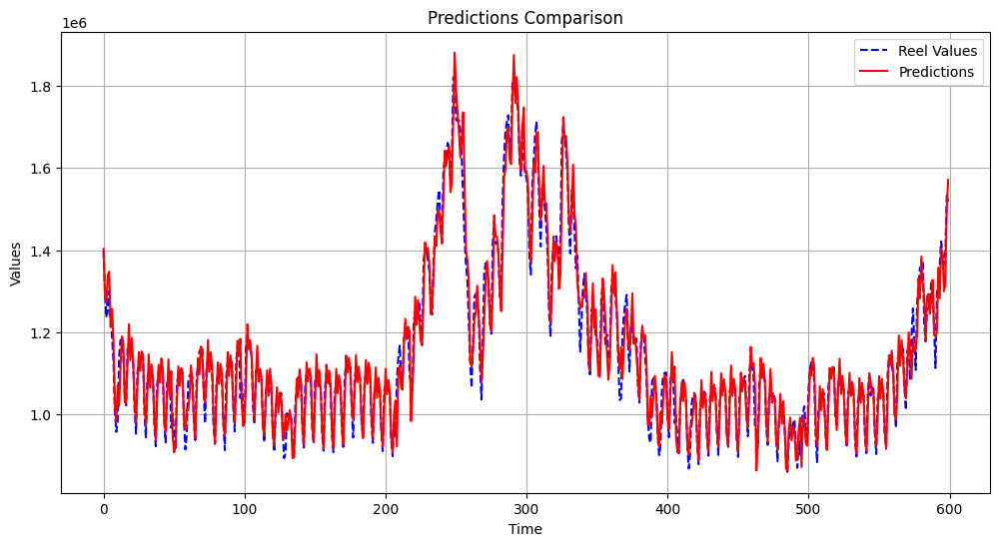

In [ ]:
import numpy as np
# Tracer les courbes
plt.figure(figsize=(12, 6))
plt.plot(test_data_rte.values[:600], label="Reel Values", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle MA
plt.plot(predictions_rte[:600], label="Predictions", color='red')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


In [ ]:
from math import sqrt
from sklearn.metrics import mean_squared_error
rmse = sqrt(mean_squared_error(test_data_rte[:590], predictions_rte[:590]))
print(f'Test RMSE ARIMA: {rmse:.3f}')

Test RMSE ARIMA: 42765.597


In [ ]:
from sklearn.metrics import r2_score
# Calcul du R²
r2 = r2_score(test_data_rte.values[:590], predictions_rte[:590])

print(f"Coefficient de détermination (R²) ARIMA : {r2:.4f}")


Coefficient de détermination (R²) ARIMA : 0.9545


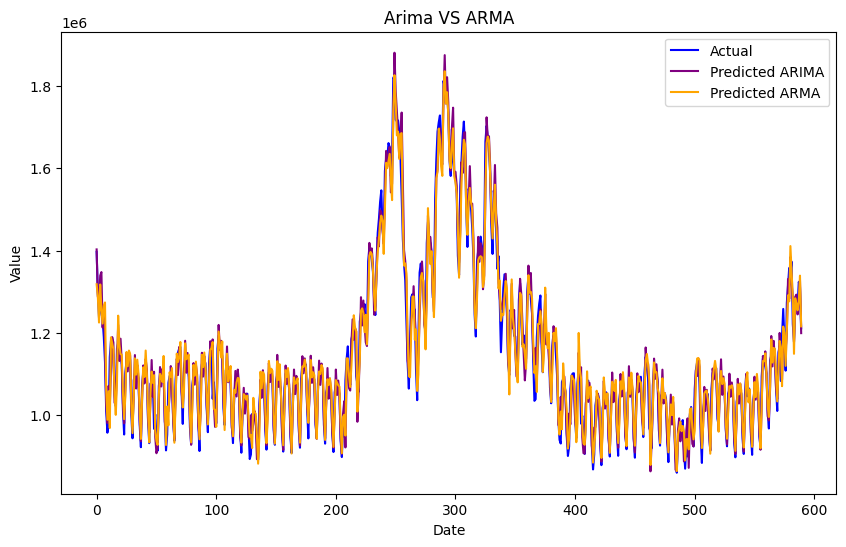

In [ ]:
# Visualisation des prédictions vs valeurs réelles
plt.figure(figsize=(10, 6))
plt.plot( test_data_rte.values[:590], label="Actual", color="blue")
plt.plot( predictions_rte[:590], label="Predicted ARIMA", color="purple")
plt.plot( predictions_combined_rte[:590].values, label="Predicted ARMA", color="orange")
plt.title("Arima VS ARMA")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.show()

In [ ]:
data=pd.DataFrame()

In [ ]:
data['Reel Values']=test_data_rte.values[:590]
data['Prediction ARMA']=predictions_combined_rte.values[:590]
data['Prediction ARIMA']=predictions_rte[:590]

In [ ]:
data.head(10)

,Reel Values,Prediction ARMA,Prediction ARIMA
0,1396961.0,1.318174e+06,1.402865e+06
1,1299474.0,1.288657e+06,1.288413e+06
2,1236460.0,1.225011e+06,1.273465e+06
3,1300058.0,1.317528e+06,1.339086e+06
4,1248968.0,1.257136e+06,1.347762e+06
5,1231934.0,1.222547e+06,1.212896e+06
6,1189276.0,1.265836e+06,1.256710e+06
7,1128624.0,1.273917e+06,1.181699e+06
8,1009084.0,1.062634e+06,1.026605e+06
9,957021.0,9.885814e+05,9.805329e+05


In [ ]:
data.to_csv('pred_rte.csv', index=False)

###**DL models**

In [ ]:
series_rte

,Consommation brute électricité (MW) - RTE
Date - Heure,
2012-01-01,1237536.0
2012-01-02,1453549.0
2012-01-03,1625894.0
2012-01-04,1632020.0
2012-01-05,1660291.0
...,...
2024-10-27,986420.0
2024-10-28,1123980.0
2024-10-29,1156473.0


In [ ]:
from sklearn.preprocessing import MinMaxScaler


data = pd.DataFrame(series_rte)

# Normalisation des données
scaler = MinMaxScaler()
data['Consommation brute électricité (MW) - RTE'] = scaler.fit_transform(data[['Consommation brute électricité (MW) - RTE']])
data.head()

,Consommation brute électricité (MW) - RTE
Date - Heure,
2012-01-01,0.276922
2012-01-02,0.430083
2012-01-03,0.552282
2012-01-04,0.556625
2012-01-05,0.576671


In [ ]:
def create_sequences(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)

window_size = 365  # Taille de la fenêtre (ajustable)
X, y = create_sequences(data['Consommation brute électricité (MW) - RTE'].values, window_size)

In [ ]:
# Reshape pour RNN, LSTM, GRU (ajout de la dimension feature)
X_dl = X.reshape((X.shape[0], X.shape[1], 1))

In [ ]:
X_dl

array([[[0.27692193],
        [0.43008299],
        [0.55228186],
        ...,
        [0.40333814],
        [0.34688893],
        [0.33790898]],

       [[0.43008299],
        [0.55228186],
        [0.55662541],
        ...,
        [0.34688893],
        [0.33790898],
        [0.38999124]],

       [[0.55228186],
        [0.55662541],
        [0.57667058],
        ...,
        [0.33790898],
        [0.38999124],
        [0.32789739]],

       ...,

       [[0.21681551],
        [0.2275177 ],
        [0.16724607],
        ...,
        [0.12596597],
        [0.09887157],
        [0.1964066 ]],

       [[0.2275177 ],
        [0.16724607],
        [0.24533365],
        ...,
        [0.09887157],
        [0.1964066 ],
        [0.21944532]],

       [[0.16724607],
        [0.24533365],
        [0.29147703],
        ...,
        [0.1964066 ],
        [0.21944532],
        [0.22433625]]])

In [ ]:
lenght_train = 0.8*len(X_dl)
X_train, y_train = X_dl[:int(lenght_train)], y[:int(lenght_train)]
X_test, y_test = X_dl[int(lenght_train):], y[int(lenght_train):]



# ANN

In [ ]:
X_t, y_t = np.array(X), np.array(y)
X_t.shape

(4323, 365)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_t)  # Mise à l'échelle des entrées
y_scaled = scaler.fit_transform(y_t.reshape(-1, 1))
from tensorflow.keras import layers, regularizers
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42, shuffle=False)

model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(365,),
                       kernel_regularizer=regularizers.l2(0.001)),  # Régularisation L2
    keras.layers.Dropout(0.1),  # Réduction du Dropout
    keras.layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dense(1)  # Couche de sortie
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.1873 - mae: 0.1305 - val_loss: 0.1115 - val_mae: 0.0631
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1058 - mae: 0.0810 - val_loss: 0.0754 - val_mae: 0.0605
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0704 - mae: 0.0704 - val_loss: 0.0513 - val_mae: 0.0522
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0499 - mae: 0.0664 - val_loss: 0.0374 - val_mae: 0.0548
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0357 - mae: 0.0590 - val_loss: 0.0272 - val_mae: 0.0467
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0272 - mae: 0.0573 - val_loss: 0.0210 - val_mae: 0.0443
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0216 - mae: 0.0558 - val_loss: 0.0174 - val_mae: 0.0440
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0175 - mae: 0.0528 - val_loss: 0.0143 - val_mae: 0.0477
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - l

In [ ]:
predictions = model.predict(X_test)

from sklearn.metrics import mean_squared_error, r2_score

# Calcul du MSE
mse = mean_squared_error(y_test, predictions)
print(f"MSE: {mse}")

# Calcul du R²
r2 = r2_score(y_test, predictions)
print(f"R²: {r2}")

import numpy as np

rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
MSE: 0.0027491608146877453
R²: 0.8961080883099068
RMSE: 0.05243244047999049


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0048 - mae: 0.0374
Erreur moyenne absolue : 0.0379360057413578


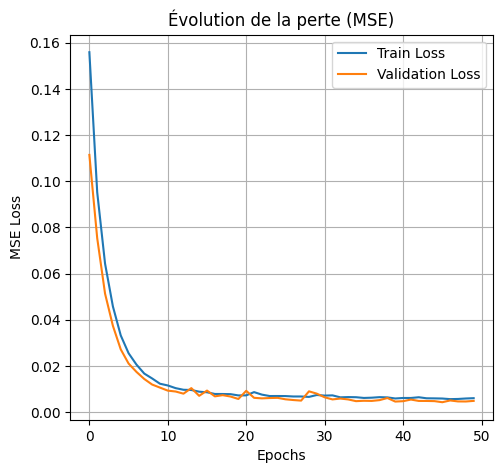

In [ ]:
loss, mae = model.evaluate(X_test, y_test)
print(f"Erreur moyenne absolue : {mae}")
import matplotlib.pyplot as plt

# Récupérer l'historique des pertes
history_dict = history.history

# Tracer la perte (MSE)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Évolution de la perte (MSE)')
plt.legend()
plt.grid()

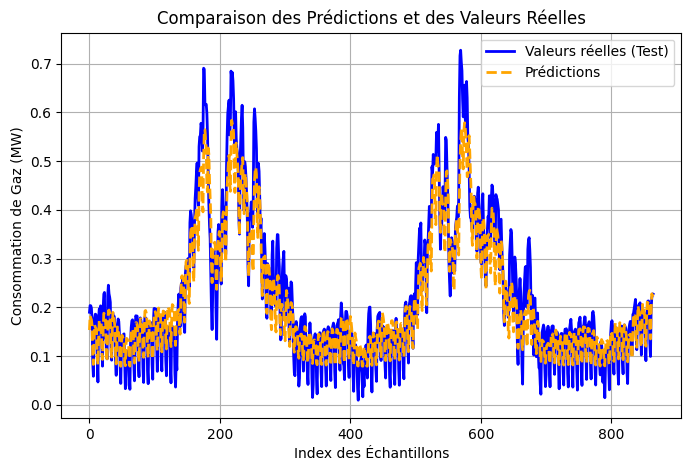

In [ ]:
y_pred_original = scaler.inverse_transform(predictions)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))
plt.figure(figsize=(8, 5))
plt.plot(y_test_original, label="Valeurs réelles (Test)", color="blue", linewidth=2)
plt.plot(y_pred_original, label="Prédictions", color="orange", linestyle="--", linewidth=2)
plt.title("Comparaison des Prédictions et des Valeurs Réelles")
plt.xlabel("Index des Échantillons")
plt.ylabel("Consommation de Gaz (MW)")
plt.legend()
plt.grid(True)
plt.show()

### ▶  RNN

In [ ]:
!pip install tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense

In [ ]:
# Initialisation du modèle
model = Sequential()
model.add(SimpleRNN(50, activation='relu', return_sequences=True,  input_shape=(X_train.shape[1], 1)))
model.add(SimpleRNN(50, activation='relu'))
model.add(Dense(1))  # Sortie avec une seule valeur
model.compile(optimizer='adam', loss='mean_squared_error')
# Résumé du modèle
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_11 (SimpleRNN)            │ (None, 365, 50)             │           2,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_12 (SimpleRNN)            │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,701 (30.08 KB)

 Trainable params: 7,701 (30.08 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 39s 356ms/step - loss: 9.1532e-04 - val_loss: 6.6056e-04
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 184ms/step - loss: 8.8139e-04 - val_loss: 7.2698e-04
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 9.3043e-04 - val_loss: 8.4221e-04
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 19s 170ms/step - loss: 8.6467e-04 - val_loss: 8.1676e-04
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - loss: 9.4316e-04 - val_loss: 7.9090e-04
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 40s 220ms/step - loss: 8.9057e-04 - val_loss: 7.0923e-04
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 192ms/step - loss: 8.8034e-04 - val_loss: 7.9034e-04
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 34s 309ms/step - loss: 9.5806e-04 - val_loss: 7.4778e-04
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 31s 215ms/step - loss: 0.0010 - val_loss: 7.0578e-04
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 19s 171ms/step - loss: 9.2626e-04 - val_loss: 6.6892e-04
Epoch 11/20
109/109 ━━━━━━━━━━━━━

In [ ]:
# Prédictions
predictions = model.predict(X_test)
from sklearn.metrics import mean_squared_error, r2_score

# Calcul du MSE
mse = mean_squared_error(y_test, predictions)
print(f"MSE: {mse}")

# Calcul du R²
r2 = r2_score(y_test, predictions)
print(f"R²: {r2}")

import numpy as np

rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step
MSE: 0.000786410037215985
R²: 0.9652263392555355
RMSE: 0.028043003355845912


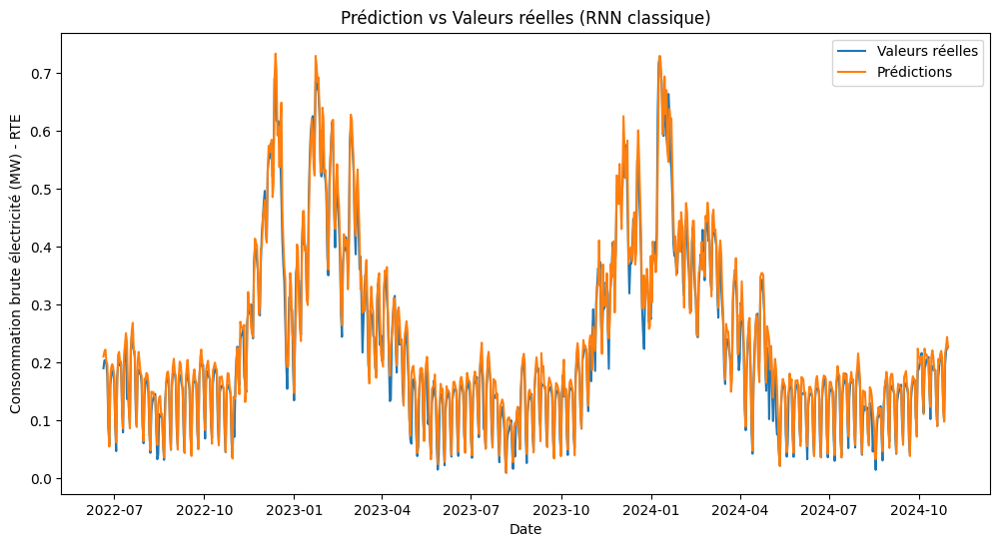

In [ ]:

plt.figure(figsize=(12, 6))
plt.plot(series.index[-len(y_test):], y_test, label='Valeurs réelles')
plt.plot(series.index[-len(y_test):], predictions, label='Prédictions')
plt.title('Prédiction vs Valeurs réelles (RNN classique)')
plt.xlabel('Date')
plt.ylabel('Consommation brute électricité (MW) - RTE')
plt.legend()
plt.show()

#### ajouté une nouvelle variable : la moyenne de la consommation des 90 jours précédents.

In [ ]:
import numpy as np

# Assurez-vous que series_rte est un DataFrame avec une colonne 'Consommation brute électricité (MW) - RTE'
# Si series_rte est une Series, convertissez-la en DataFrame
# Par exemple, si series_rte est une Series avec un index DatetimeIndex:
series_rte_1 = series_rte.to_frame(name='Consommation brute électricité (MW) - RTE')

# Maintenant vous pouvez accéder à la colonne :
series_rte_1['moyenne_90j'] = series_rte_1['Consommation brute électricité (MW) - RTE'].rolling(window=90).mean()

# Suppression des premières valeurs NaN causées par le rolling
series_rte_1.dropna(inplace=True)

# Normalisation des deux features
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))
series_rte_scaled = scaler.fit_transform(series_rte_1)

# Création des séquences pour le RNN
X, y = [], []
window_size = 365  # Fenêtre de 1 an

for i in range(len(series_rte_scaled) - window_size):
    X.append(series_rte_scaled[i:i+window_size])  # Séquence de 365 jours avec 2 features
    y.append(series_rte_scaled[i+window_size, 0])  # Valeur cible (seule la consommation brute)

X, y = np.array(X), np.array(y)

# Reshape pour correspondre au format attendu par le RNN
X = X.reshape((X.shape[0], X.shape[1], 2))  # 2 features au lieu d’une seule


In [ ]:
# Division en ensemble d'entraînement et de test
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]
# Initialisation du modèle
model = Sequential()
model.add(SimpleRNN(50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], 2)))
model.add(SimpleRNN(50, activation='relu'))
model.add(Dense(1))  # Sortie avec une seule valeur prédite

# Compilation du modèle
model.compile(optimizer='adam', loss='mean_squared_error')

# Résumé du modèle
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_13 (SimpleRNN)            │ (None, 365, 50)             │           2,650 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_14 (SimpleRNN)            │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,751 (30.28 KB)

 Trainable params: 7,751 (30.28 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0529 - val_loss: 0.0025
Epoch 2/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.0024 - val_loss: 0.0015
Epoch 3/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 4/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 5/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 6/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 7/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 8/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 9/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0013 - val_loss: 0.0012
Epoch 10/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 22s 172ms/step - loss: 0.0014 - val_loss: 9.5326e-04
Epoch 11/20
106/106 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0012 - val_loss: 9.6712e-04
Epoch 12/20

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Prédictions
predictions = model.predict(X_test)

# Calcul des métriques
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = np.sqrt(mse)

print(f"MSE: {mse}")
print(f"R²: {r2}")
print(f"RMSE: {rmse}")



27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
MSE: 0.0010161388521183214
R²: 0.9621480175407409
RMSE: 0.03187693291579856


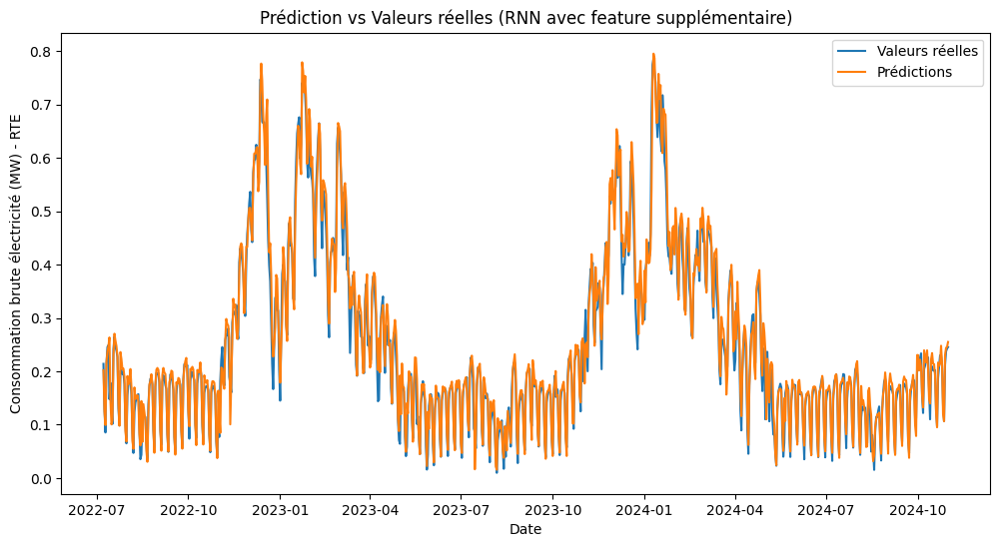

In [ ]:
# Visualisation des résultats
plt.figure(figsize=(12, 6))
plt.plot(series_rte.index[-len(y_test):], y_test, label='Valeurs réelles')
plt.plot(series_rte.index[-len(y_test):], predictions, label='Prédictions')
plt.title('Prédiction vs Valeurs réelles (RNN avec feature supplémentaire)')
plt.xlabel('Date')
plt.ylabel('Consommation brute électricité (MW) - RTE')
plt.legend()
plt.show()

###**LSTM**

In [ ]:
from tensorflow import keras
from tensorflow.keras import Sequential


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    #keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=False),
    #keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='mse') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - loss: 0.0428 - val_loss: 0.0055
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0069 - val_loss: 0.0051
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0060 - val_loss: 0.0052
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0063 - val_loss: 0.0049
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0060 - val_loss: 0.0041
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0054 - val_loss: 0.0041
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0052 - val_loss: 0.0037
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0051 - val_loss: 0.0037
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0051 - val_loss: 0.0034
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0048 - val_loss: 0.0039
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0045 - val_loss: 0.0031
Epoch 12/20
109/109 ━━━━━━━━━━━━━━━━━━━━

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
MSE: 0.002070239524120464
RMSE: 0.045499884880299026
R2 Score: 0.9084576703440843


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


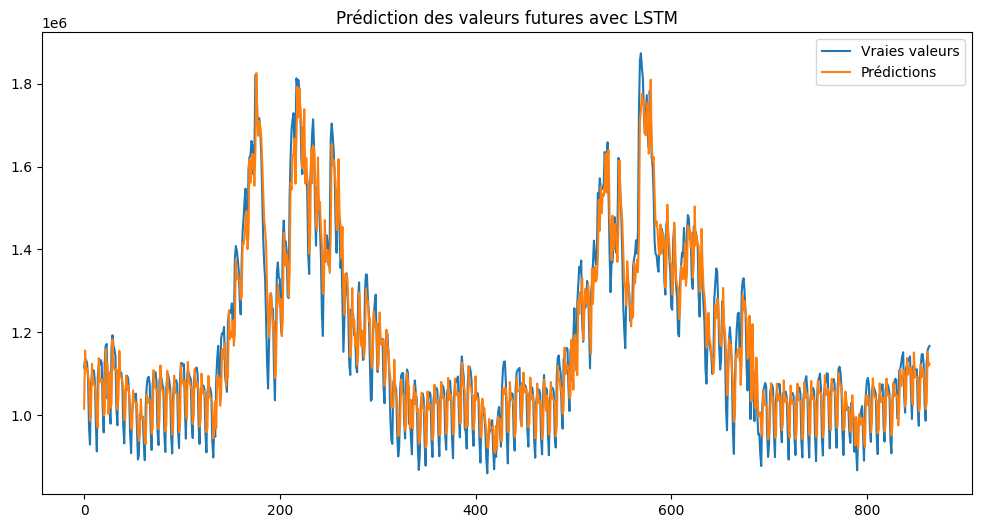

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='tanh', return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='tanh', return_sequences=True),
    keras.layers.LSTM(50, activation='tanh'),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='mse') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.0193 - val_loss: 0.0064
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - loss: 0.0076 - val_loss: 0.0062
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.0073 - val_loss: 0.0051
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.0068 - val_loss: 0.0050
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - loss: 0.0066 - val_loss: 0.0054
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - loss: 0.0072 - val_loss: 0.0048
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - loss: 0.0065 - val_loss: 0.0046
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - loss: 0.0067 - val_loss: 0.0045
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - loss: 0.0060 - val_loss: 0.0042
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.0044 - val_loss: 0.0025
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.0031 - val_loss: 0.0018
Epoch 12/50
109/109 ━━━━━━━━━━━

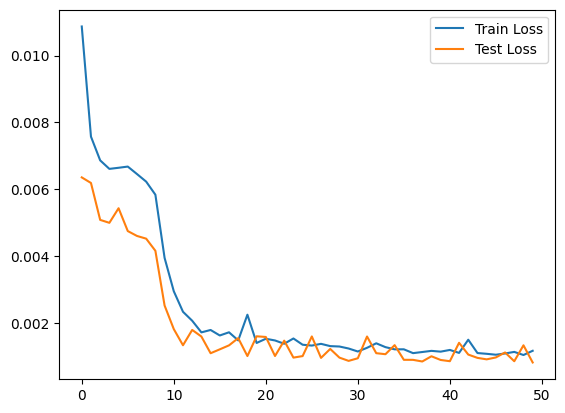

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step
MSE: 0.0008218137236123594
RMSE: 0.028667293622041817
R2 Score: 0.9636608508695921


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


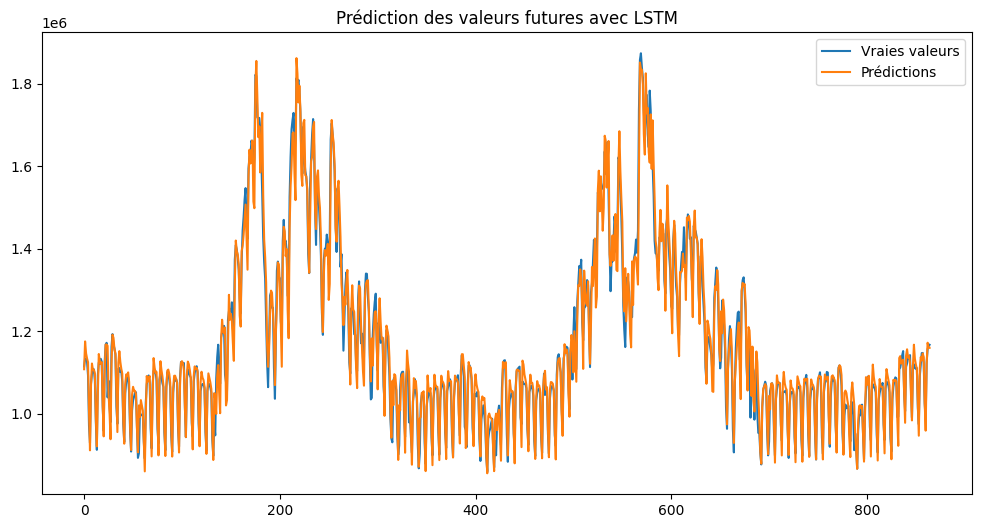

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 25s 168ms/step - loss: 0.0169 - val_loss: 0.0044
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.0042 - val_loss: 0.0031
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0038 - val_loss: 0.0026
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.0034 - val_loss: 0.0024
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.0032 - val_loss: 0.0026
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.0037 - val_loss: 0.0022
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 127ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0034 - val_loss: 0.0022
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 0.0036 - val_loss: 0.0021
Epoch 12/50
109/109

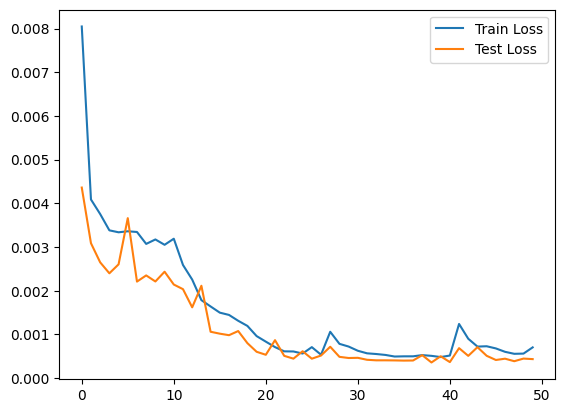

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step
MSE: 0.0008692643368208329
RMSE: 0.029483289111305624
R2 Score: 0.9615626686901407


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step


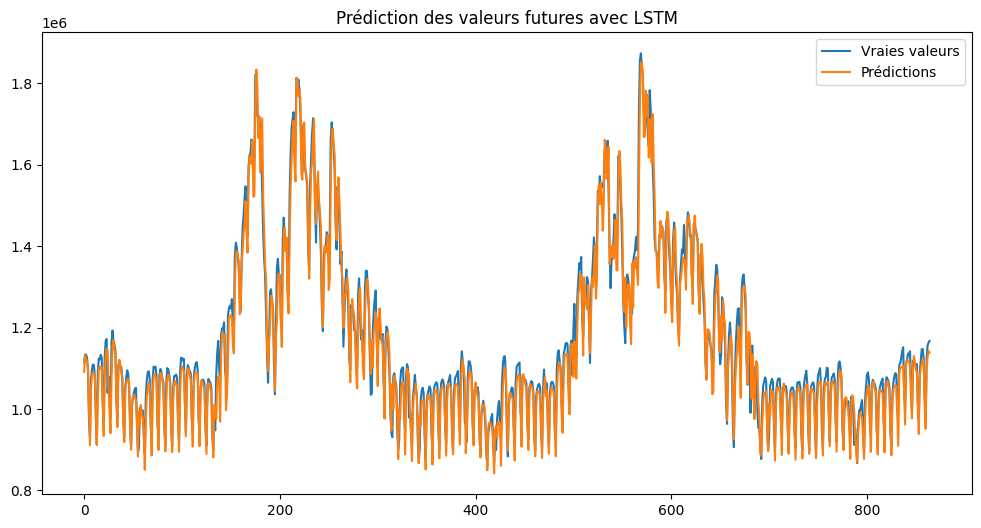

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


# gru

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


109/109 ━━━━━━━━━━━━━━━━━━━━ 101s 870ms/step - loss: 0.0228 - val_loss: 0.0062
Epoch 2/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 135s 811ms/step - loss: 0.0068 - val_loss: 0.0045
Epoch 3/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 86s 787ms/step - loss: 0.0060 - val_loss: 0.0026
Epoch 4/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 146s 823ms/step - loss: 0.0043 - val_loss: 0.0024
Epoch 5/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 139s 793ms/step - loss: 0.0035 - val_loss: 0.0028
Epoch 6/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 147s 840ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 7/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 134s 769ms/step - loss: 0.0030 - val_loss: 0.0017
Epoch 8/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 147s 817ms/step - loss: 0.0024 - val_loss: 0.0015
Epoch 9/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 90s 828ms/step - loss: 0.0023 - val_loss: 0.0014
Epoch 10/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 135s 761ms/step - loss: 0.0025 - val_loss: 0.0012
28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step


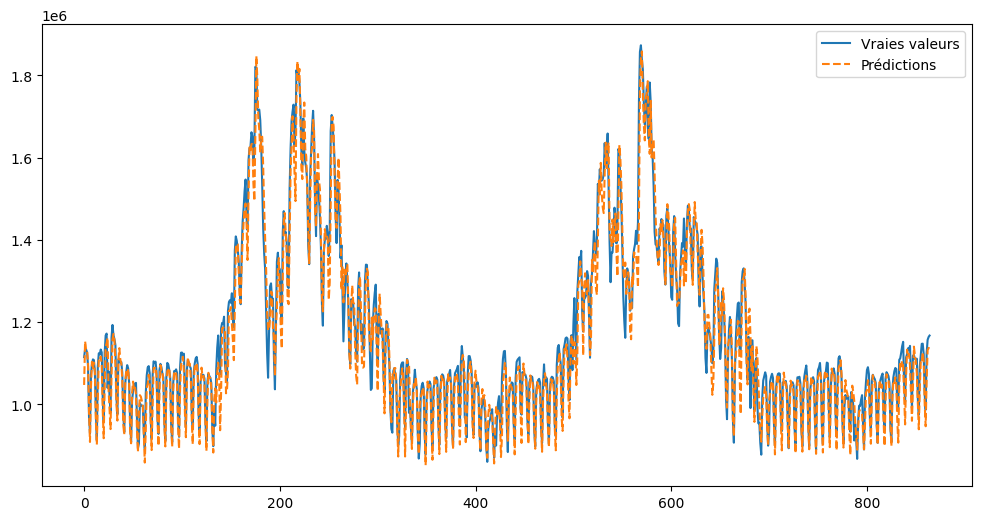

RMSE: 49082.5296979645
R² Score: 0.9464459651055435


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dropout



scaler = MinMaxScaler()
series_rte = scaler.fit_transform(series_rte.values.reshape(-1, 1))

X, y = [], []
window_size = 365
for i in range(len(series_rte) - window_size):
    X.append(series_rte[i:i+window_size])
    y.append(series_rte[i+window_size])

X, y = np.array(X), np.array(y)

X_dl = X.reshape((X.shape[0], X.shape[1], 1))
test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(X_dl, y, test_size=test_size, shuffle=False)
model_gru3 = Sequential([
    GRU(150, activation='tanh', return_sequences=True, input_shape=(window_size, 1)),
    Dropout(0.2),
    GRU(100, activation='relu', return_sequences=True),
    Dropout(0.2),

    GRU(50, activation='tanh'),

    Dense(1)
])

model_gru3.compile(optimizer='adam', loss='mse')

model_gru3.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))


predictions3 = model_gru3.predict(X_test)

predictions_inv3 = scaler.inverse_transform(predictions3)
y_inv3 = scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_inv3, label='Vraies valeurs')
plt.plot(predictions_inv3, label='Prédictions', linestyle='dashed')
plt.legend()
plt.show()
rmse3 = np.sqrt(mean_squared_error(y_inv3, predictions_inv3))
print(f'RMSE: {rmse3}')
r3 = r2_score(y_inv3, predictions_inv3)
print(f'R² Score: {r3}')
#RMSE: 49082.5296979645 R² Score: 0.9464459651055435

In [ ]:
data_rte_subset = data_rte.tail(len(y_inv3.flatten()))

df_results = pd.DataFrame({
    'Date': data_rte_subset.index,  # Dates de l'index
    'Consommation Réelle': y_inv3.flatten(),
    'Prédiction GRU': predictions_inv3.flatten()
})

df_results.to_csv("predictions_gru_electricity.csv", index=False)
print("Fichier CSV des prédictions sauvegardé avec succès !")

Fichier CSV des prédictions sauvegardé avec succès !


###Seires after MAS

In [ ]:
series_rte_mas = pd.Series([np.nan] * window + pred, index=series_rte.index, name=series_rte.name)
series_rte_mas

,Consommation brute électricité (MW) - RTE
Date - Heure,
2012-01-01,NaN
2012-01-02,NaN
2012-01-03,NaN
2012-01-04,NaN
2012-01-05,NaN
...,...
2024-10-27,1.088745e+06
2024-10-28,1.085438e+06
2024-10-29,1.089839e+06


In [ ]:
series_rte_mas.isna().sum()

30

In [ ]:
series_rte_mas = series_rte_mas[30:]
series_rte_mas

,Consommation brute électricité (MW) - RTE
Date - Heure,
2012-01-31,1.629028e+06
2012-02-01,1.651552e+06
2012-02-02,1.669894e+06
2012-02-03,1.685701e+06
2012-02-04,1.702659e+06
...,...
2024-10-27,1.088745e+06
2024-10-28,1.085438e+06
2024-10-29,1.089839e+06


In [ ]:
from sklearn.preprocessing import MinMaxScaler


data = pd.DataFrame(series_rte_mas)

# Normalisation des données
scaler = MinMaxScaler()
data['Consommation brute électricité (MW) - RTE'] = scaler.fit_transform(data[['Consommation brute électricité (MW) - RTE']])
data.head()

,Consommation brute électricité (MW) - RTE
Date - Heure,
2012-01-31,0.711192
2012-02-01,0.735377
2012-02-02,0.755073
2012-02-03,0.772046
2012-02-04,0.790255


In [ ]:
def create_sequences(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)

window_size = 365  # Taille de la fenêtre (ajustable)
X, y = create_sequences(data['Consommation brute électricité (MW) - RTE'].values, window_size)

In [ ]:
# Reshape pour RNN, LSTM, GRU (ajout de la dimension feature)
X_dl = X.reshape((X.shape[0], X.shape[1], 1))

In [ ]:
lenght_train = 0.8*len(X_dl)
X_train, y_train = X_dl[:int(lenght_train)], y[:int(lenght_train)]
X_test, y_test = X_dl[int(lenght_train):], y[int(lenght_train):]



In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 25s 176ms/step - loss: 0.0229 - val_loss: 8.7540e-04
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 5.8164e-04 - val_loss: 5.0976e-04
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 5.3842e-04 - val_loss: 5.6495e-04
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 6.5745e-04 - val_loss: 5.4673e-04
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 3.6561e-04 - val_loss: 4.0213e-04
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 3.7144e-04 - val_loss: 4.9497e-04
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 21s 134ms/step - loss: 2.9270e-04 - val_loss: 2.4746e-04
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 133ms/step - loss: 1.8358e-04 - val_loss: 2.4758e-04
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 1.4990e-04 - val_loss: 1.2975e-04
Epoch 10/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 1.1402e-04 - val_loss: 1.0827e-04
Epoch 11/50
108/108 ━━━━━━━━━━━━━

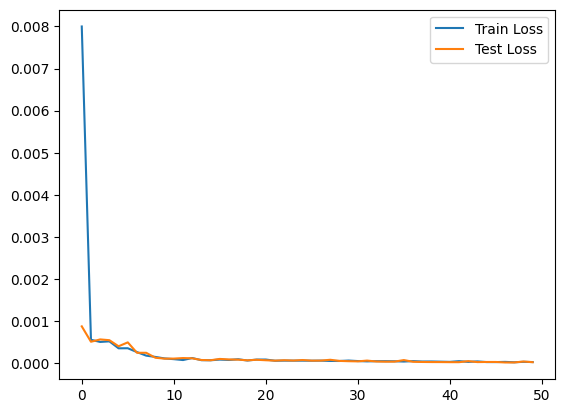

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step
MSE: 4.839396791982793e-05
RMSE: 0.006956577313580862
R2 Score: 0.9987625738308993


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step


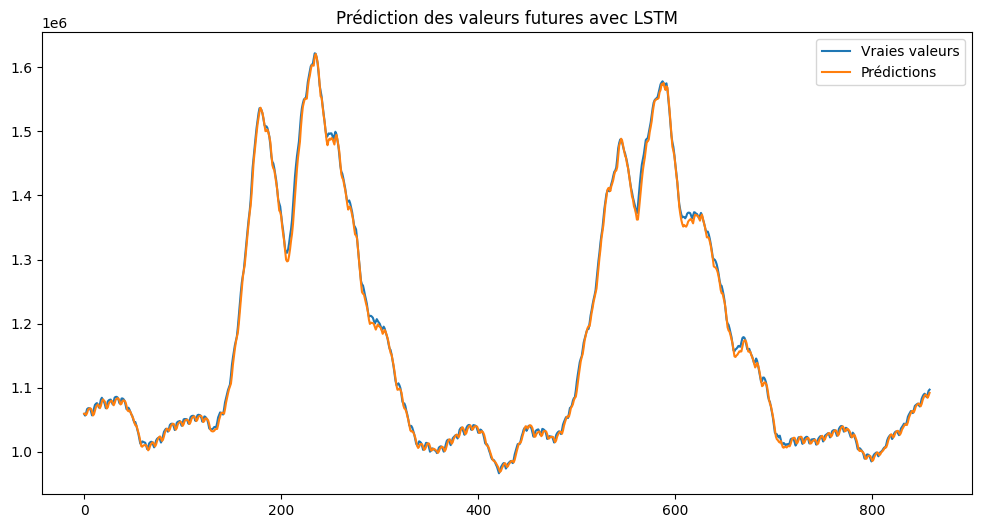

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


# Consommation brute totale (MW)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('/content/data_filtred_v2.csv')
df.head()

,Date - Heure,Consommation brute gaz (MW PCS 0°C) - GRTgaz,Consommation brute gaz (MW PCS 0°C) - Teréga,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW),Date,Heure
0,2024-10-31 23:00:00,30998.0,1734.0,32732.0,47753.0,80485.0,31/10/2024,23:00
1,2024-10-31 22:00:00,33674.0,1867.0,35541.0,47498.0,83039.0,31/10/2024,22:00
2,2024-10-31 21:00:00,37801.0,1969.0,39770.0,47832.0,87602.0,31/10/2024,21:00
3,2024-10-31 20:00:00,40558.0,2094.0,42652.0,50389.0,93041.0,31/10/2024,20:00
4,2024-10-31 19:00:00,41563.0,2188.0,43751.0,53387.0,97138.0,31/10/2024,19:00


In [2]:
#data_grtgaz = df[['Date', 'Heure', 'Consommation brute gaz (MW PCS 0°C) - GRTgaz']]
#data_terega = df[['Date', 'Heure', 'Consommation brute gaz (MW PCS 0°C) - Teréga']]
data_gaz = df[['Date - Heure', 'Consommation brute gaz totale (MW PCS 0°C)']]
data_rte = df[['Date - Heure', 'Consommation brute électricité (MW) - RTE']]
data_total = df[['Date - Heure', 'Consommation brute totale (MW)']]

In [3]:
data_total.head()

,Date - Heure,Consommation brute totale (MW)
0,2024-10-31 23:00:00,80485.0
1,2024-10-31 22:00:00,83039.0
2,2024-10-31 21:00:00,87602.0
3,2024-10-31 20:00:00,93041.0
4,2024-10-31 19:00:00,97138.0


In [4]:
data_total["Date - Heure"] = pd.to_datetime(data_total["Date - Heure"])


<ipython-input-4-614b74494900>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_total["Date - Heure"] = pd.to_datetime(data_total["Date - Heure"])


In [5]:
data_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112512 entries, 0 to 112511
Data columns (total 2 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date - Heure                    112512 non-null  datetime64[ns]
 1   Consommation brute totale (MW)  112411 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.7 MB


In [6]:
data_total.set_index('Date - Heure', inplace=True)
series_total_cons = pd.Series(data_total['Consommation brute totale (MW)'])
series_total_cons

,Consommation brute totale (MW)
Date - Heure,
2024-10-31 23:00:00,80485.0
2024-10-31 22:00:00,83039.0
2024-10-31 21:00:00,87602.0
2024-10-31 20:00:00,93041.0
2024-10-31 19:00:00,97138.0
...,...
2012-01-01 04:00:00,106242.0
2012-01-01 03:00:00,108544.0
2012-01-01 02:00:00,110996.0


In [7]:
series_total_cons.isna().sum()

101

In [8]:
series_total_cons = series_total_cons.interpolate(method='linear')
series_total_cons.isna().sum()

0

In [9]:
series_total_cons = series_total_cons.resample('D').sum()
series_total_cons

,Consommation brute totale (MW)
Date - Heure,
2012-01-01,2684351.0
2012-01-02,3245494.0
2012-01-03,3631647.0
2012-01-04,3629618.0
2012-01-05,3698721.0
...,...
2024-10-27,1627642.0
2024-10-28,2148186.0
2024-10-29,2012378.0


In [10]:
series_total_cons.isna().sum()

0

<Axes: >

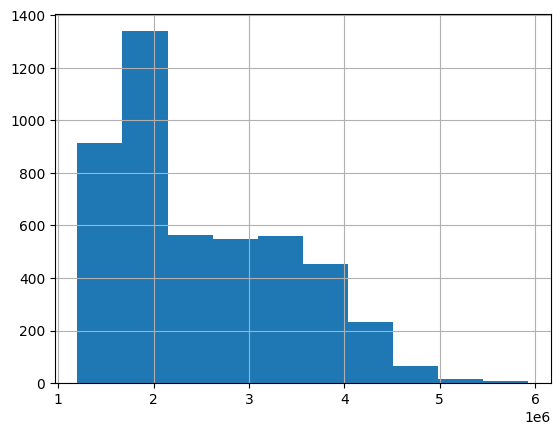

In [11]:
series_total_cons.hist()

<Axes: xlabel='Date - Heure'>

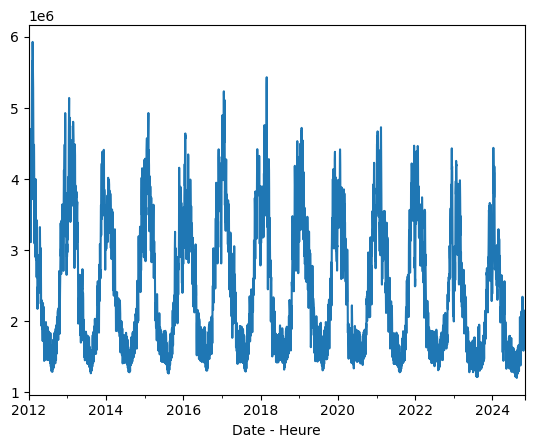

In [12]:
series_total_cons.plot()

<Axes: xlabel='Date - Heure'>

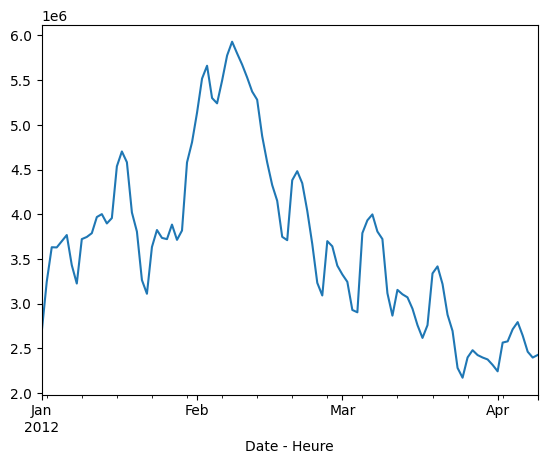

In [ ]:
series_total_cons[:100].plot()

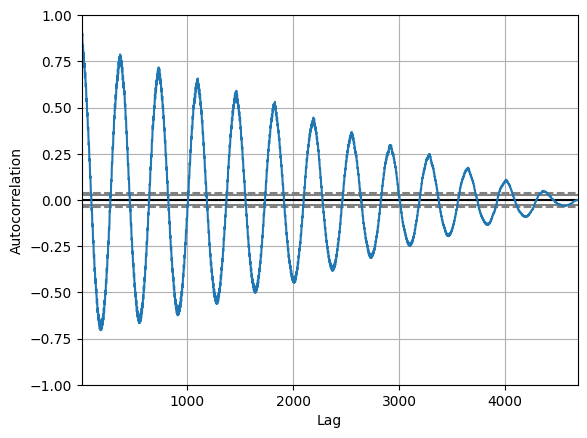

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_total_cons)
plt.show()

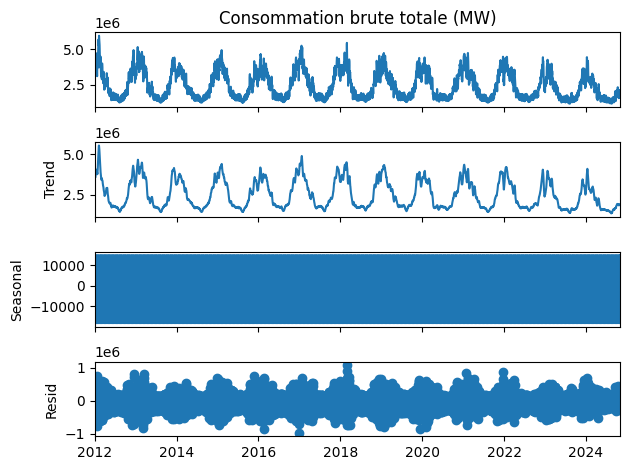

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(series_total_cons, model='additive', period=12)
result.plot()
plt.show()

In [ ]:
size = len(series_total_cons)/2
mean_1 = series_total_cons[:int(size)].mean()
std_1 = series_total_cons[:int(size)].std()
mean_2 = series_total_cons[int(size):].mean()
std_2 = series_total_cons[int(size):].std()

print("mean 1:",mean_1," std 1 :",std_1)
print("mean 2:",mean_2," std 2 :",std_2)

mean 1: 2634223.8647610922  std 1 : 960188.4352505634
mean 2: 2376385.618813993  std 2 : 846020.008109864


In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(series_total_cons)
print("ADF stats : ", result[0])
print("p-value : ", result[1])
print("Critical value:")
for key,value in result[4].items():
    print(key,"  :  ",value)


ADF stats :  -4.538850220421068
p-value :  0.0001671847912649413
Critical value:
1%   :   -3.431755263940016
5%   :   -2.862160964607231
10%   :   -2.5671005419475


<ipython-input-106-28e434bbc995>:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history = [series_total_cons[i] for i in range(window)]
<ipython-input-106-28e434bbc995>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  test = [series_total_cons[i] for i in range(window,len(series_total_cons))]


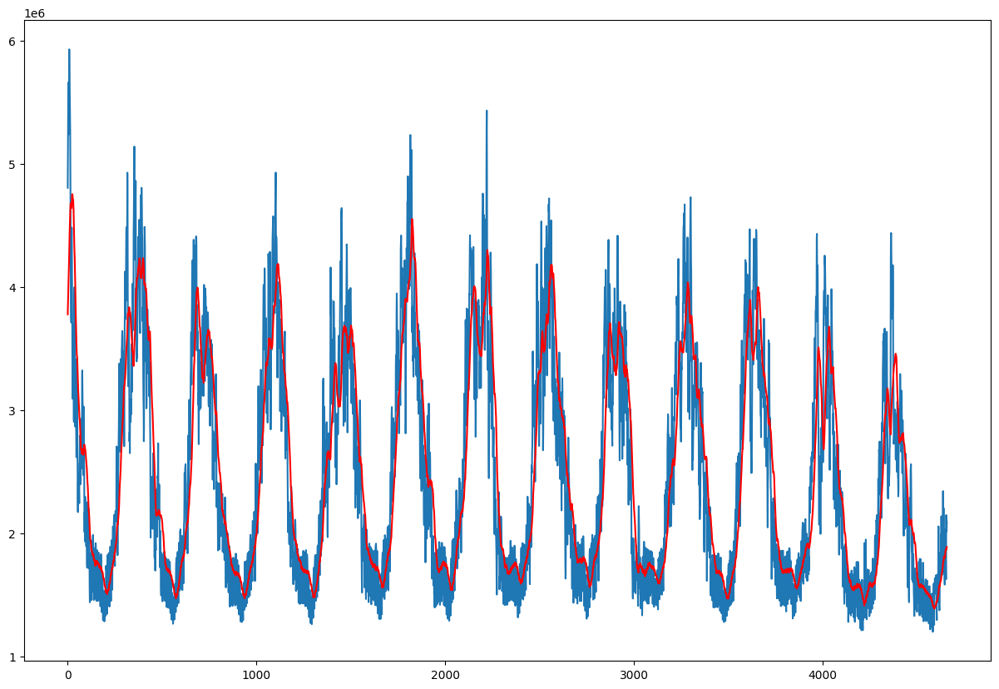

In [ ]:

window = 30
history = [series_total_cons[i] for i in range(window)]
test = [series_total_cons[i] for i in range(window,len(series_total_cons))]
pred = []
for t in range(len(test)):
    length = len(history)
    yhat = np.mean([history[i] for i in range(length-window,length)])
    pred.append(yhat)
    history.append(test[t])

plt.figure(figsize=(15,10))
plt.plot(test)
plt.plot(pred, color='red')
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler


data = pd.DataFrame(series_total_cons)

# Normalisation des données
scaler = MinMaxScaler()
data['Consommation brute totale (MW)'] = scaler.fit_transform(data[['Consommation brute totale (MW)']])
data.head()

,Consommation brute totale (MW)
Date - Heure,
2012-01-01,0.313795
2012-01-02,0.432449
2012-01-03,0.514102
2012-01-04,0.513673
2012-01-05,0.528285


In [ ]:
def create_sequences(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)

window_size = 365  # Taille de la fenêtre (ajustable)
X, y = create_sequences(data['Consommation brute totale (MW)'].values, window_size)

In [ ]:
# Reshape pour RNN, LSTM, GRU (ajout de la dimension feature)
X_dl = X.reshape((X.shape[0], X.shape[1], 1))

In [ ]:
lenght_train = 0.8*len(X_dl)
X_train, y_train = X_dl[:int(lenght_train)], y[:int(lenght_train)]
X_test, y_test = X_dl[int(lenght_train):], y[int(lenght_train):]


# ARIMA ARMA MODELS

In [13]:
##calcule de correlation
from pandas import *
values=DataFrame(series_total_cons.values) # facilite la création des lagged values
dataframe=concat([values.shift(1),values],axis=1)
dataframe.columns=['t','t+1']
dataframe
result= dataframe.corr()
result

,t,t+1
t,1.000000,0.970798
t+1,0.970798,1.000000


In [14]:
##calcule de correlation
from pandas import *
values=DataFrame(series_total_cons.values) # facilite la création des lagged values
dataframe=concat([values.shift(15),values],axis=1)
dataframe.columns=['t','t+15']
dataframe
result= dataframe.corr()
result

,t,t+15
t,1.000000,0.817414
t+15,0.817414,1.000000


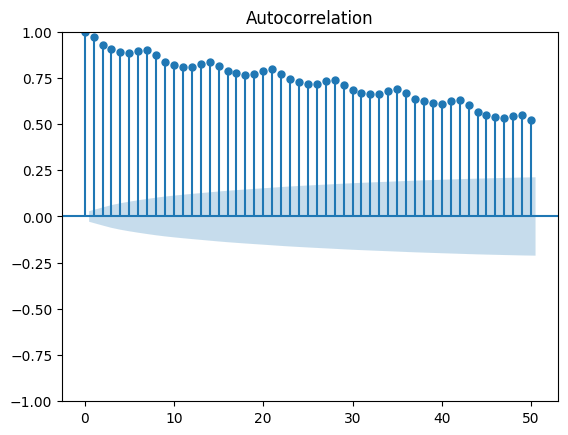

In [15]:
#verification de la correlation à l'aide de plot_acf
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(series_total_cons,lags=50)
plt.show()

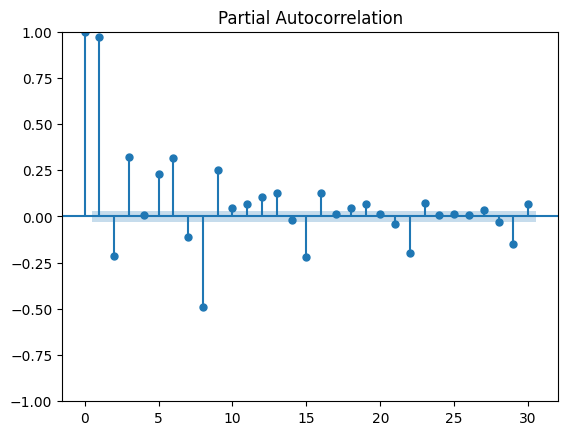

In [16]:
# Visualiser le PACF pour identifier l'ordre p
# utilité de p : . Le modèle AR(p) utilise les p dernières observations pour prédire la valeur à t
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(series_total_cons, lags=30)
plt.show()

In [17]:
n=len(series_total_cons)
train_data= series_total_cons[:int(0.8*n)] #80% pour le train
test_data= series_total_cons[int(0.8*n):] #20% pour le test

In [18]:
#model autoreg
#apres savoir qu'il y a une correlation entre les var et les lagged et le choix de p alors on va creer le model AR(1)
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
from math import sqrt
model=AutoReg(train_data,lags=15)
model_fit=model.fit()
coef=model_fit.params
print('Coefficients: %s' % coef)

Coefficients: const                                 34401.797597
Consommation brute totale (MW).L1         1.249878
Consommation brute totale (MW).L2        -0.434722
Consommation brute totale (MW).L3         0.135058
Consommation brute totale (MW).L4        -0.039662
Consommation brute totale (MW).L5        -0.021656
Consommation brute totale (MW).L6         0.055932
Consommation brute totale (MW).L7         0.416291
Consommation brute totale (MW).L8        -0.632759
Consommation brute totale (MW).L9         0.231563
Consommation brute totale (MW).L10       -0.023192
Consommation brute totale (MW).L11       -0.000624
Consommation brute totale (MW).L12       -0.037208
Consommation brute totale (MW).L13        0.053589
Consommation brute totale (MW).L14        0.271342
Consommation brute totale (MW).L15       -0.237225
dtype: float64


In [20]:
from sklearn.metrics import mean_squared_error
import pandas as pd
# Prédire les valeurs pour les données de test
predictions_1_t = model_fit.predict(start=len(train_data), end=len(series_total_cons) - 1,dynamic=False)

# Afficher les prédictions et les valeurs attendues
for i in range(len(predictions_1_t)):
    print(f'Predicted={predictions_1_t[i]:.3f}, Expected={test_data[i]:.3f}')


Predicted=2879641.303, Expected=2939462.000
Predicted=2626172.982, Expected=2810471.000
Predicted=2461324.074, Expected=2603527.000
Predicted=2667064.572, Expected=2574913.000
Predicted=2545574.293, Expected=2364187.000
Predicted=2492589.605, Expected=2359249.000
Predicted=2586402.966, Expected=2223270.000
Predicted=2889325.097, Expected=1993528.000
Predicted=2815933.513, Expected=1704829.000
Predicted=2751981.441, Expected=1630047.000
Predicted=2958647.475, Expected=1739424.000
Predicted=2850705.451, Expected=2166153.000
Predicted=2729712.214, Expected=2246628.000
Predicted=2727392.662, Expected=2183859.000
Predicted=2875447.041, Expected=2105313.000
Predicted=2733812.522, Expected=1787548.000
Predicted=2629570.318, Expected=1779887.000
Predicted=2770336.493, Expected=2191662.000
Predicted=2682772.326, Expected=2285154.000
Predicted=2575854.372, Expected=2245464.000
Predicted=2617614.376, Expected=2159946.000
Predicted=2789060.726, Expected=2082624.000
Predicted=2712148.555, Expected=

<ipython-input-20-22e54546aeef>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Predicted={predictions_1_t[i]:.3f}, Expected={test_data[i]:.3f}')


In [21]:
# Calculer le RMSE
rmse = sqrt(mean_squared_error(test_data, predictions_1_t))
print(f'Test RMSE AR sans walkforward: {rmse:.3f}')

Test RMSE AR sans walkforward: 856480.476


In [22]:
#prediction à la main
# Initialiser l'historique avec les données d'entraînement
history = list(train_data)  # Convertir train_data en liste
window = 15  #taille de la fenetre
coef = list(coef.values)  #les coeff trouvées depuis le modele
predictions_2_t = []  # Liste pour stocker les prédictions

# Parcourir les données de test
for t in range(len(test_data)):
    # Créer la fenêtre (lag) avec les données passées
    lag = [history[i] for i in range(len(history) - window, len(history))]

    # Initialiser la prédiction avec le premier coefficient (biais)
    yhat = coef[0]

    # Ajouter l'effet de chaque lag (valeur passée multipliée par son coefficient)
    for j in range(window):
        yhat += lag[j] * coef[window - j]

    # Ajouter la prédiction à la liste
    predictions_2_t.append(yhat)

    # Ajouter la valeur réelle de test_data[t] à l'historique pour la prochaine prédiction
    history.append(test_data[t])

# Afficher les prédictions et les valeurs attendues
for i in range(len(test_data)):
    print(f'Predicted={predictions_2_t[i]:.3f}, Expected={test_data[i]:.3f}')





Predicted=2879641.303, Expected=2939462.000
Predicted=2700941.544, Expected=2810471.000
Predicted=2665668.735, Expected=2603527.000
Predicted=2772761.814, Expected=2574913.000
Predicted=2391095.779, Expected=2364187.000
Predicted=2316538.529, Expected=2359249.000
Predicted=2479865.305, Expected=2223270.000
Predicted=2504707.662, Expected=1993528.000
Predicted=1892162.468, Expected=1704829.000
Predicted=1664111.052, Expected=1630047.000
Predicted=1838494.891, Expected=1739424.000
Predicted=1711842.565, Expected=2166153.000
Predicted=2328047.062, Expected=2246628.000
Predicted=2164574.540, Expected=2183859.000
Predicted=2175224.679, Expected=2105313.000
Predicted=2003347.489, Expected=1787548.000
Predicted=1707790.097, Expected=1779887.000
Predicted=1911991.920, Expected=2191662.000
Predicted=2448409.893, Expected=2285154.000
Predicted=2236651.899, Expected=2245464.000
Predicted=2186785.176, Expected=2159946.000
Predicted=2048760.109, Expected=2082624.000
Predicted=1839716.789, Expected=

<ipython-input-22-8dfa5ec1e4f8>:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  history.append(test_data[t])
<ipython-input-22-8dfa5ec1e4f8>:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Predicted={predictions_2_t[i]:.3f}, Expected={test_data[i]:.3f}')


In [23]:
# Calculer le RMSE
rmse = sqrt(mean_squared_error(test_data, predictions_2_t))
print(f'Test RMSE AR avec walkforward: {rmse:.3f}')

Test RMSE AR avec walkforward: 146489.305


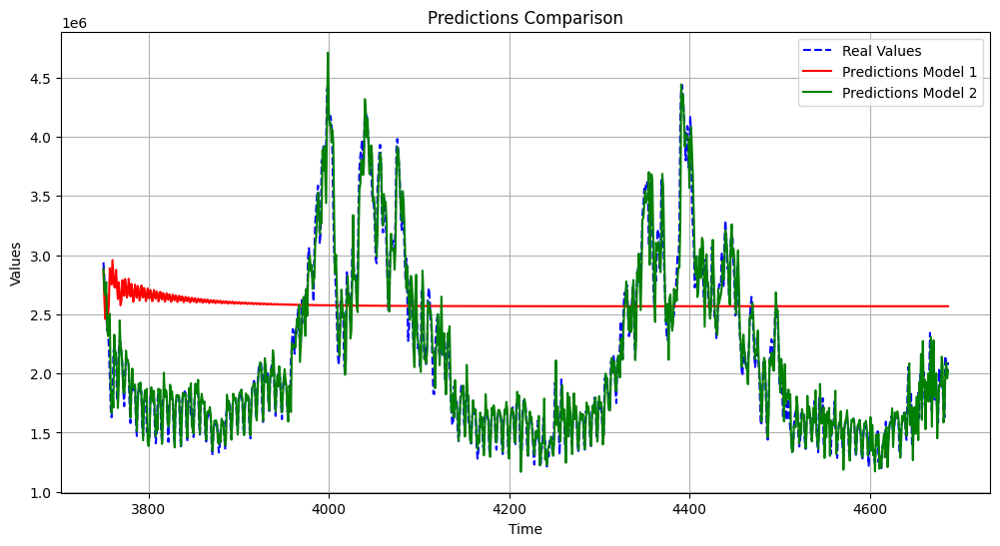

In [24]:
import matplotlib.pyplot as plt

# Indices pour le jeu de données de test (après les données d'entraînement)
test_index = range(len(train_data), len(train_data) + len(test_data))

# Tracer les courbes
plt.figure(figsize=(12, 6))
#Valeurs reels
plt.plot(test_index, test_data, label="Real Values", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle 1
plt.plot(test_index, predictions_1_t, label="Predictions Model 1", color='red')

# Courbe des prédictions du modèle 2
plt.plot(test_index, predictions_2_t, label="Predictions Model 2", color='green')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


In [25]:
# Calcul des erreurs résiduelles pour chaque modèle
residuals_1 = test_data - predictions_1_t
residuals_2 = test_data - predictions_2_t

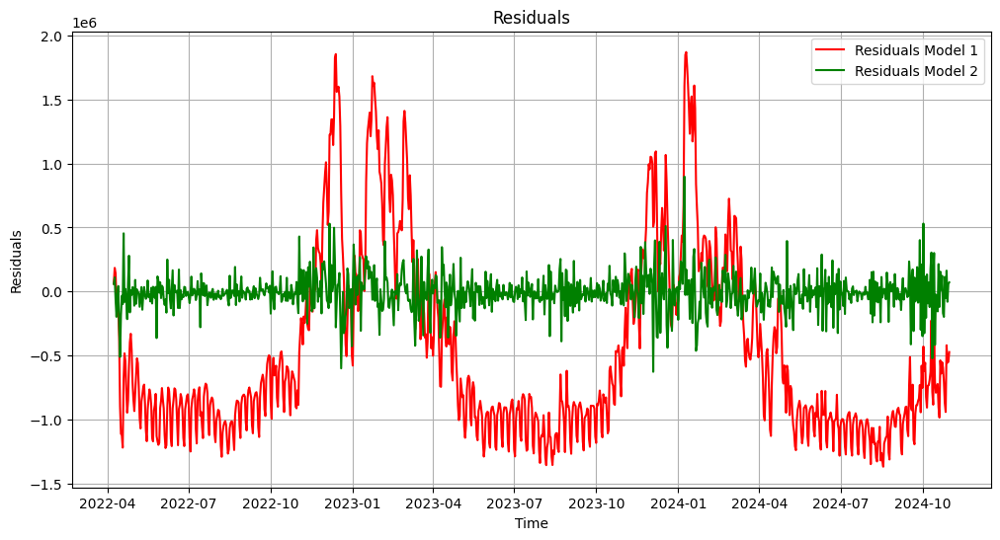

In [26]:
plt.figure(figsize=(12, 6))
plt.plot(residuals_1, label="Residuals Model 1", color='red')
plt.plot(residuals_2, label="Residuals Model 2", color='green')
plt.title("Residuals")
plt.xlabel("Time")
plt.ylabel("Residuals")
plt.legend()
plt.grid()
plt.show()

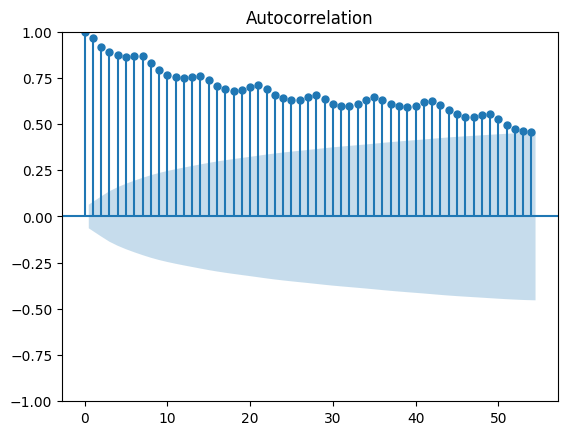

In [27]:
#verification de q à partir de residus de model 1 à ameleorer
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(residuals_1,lags=54)
plt.show()


In [28]:
from statsmodels.tsa.arima.model import ARIMA

# Paramètre q déterminé via l'ACF
q = 48

# Ajustement du modèle MA sur les résiduels
ma_model = ARIMA(residuals_1, order=(0, 0, q)).fit()



# Prédiction pour les données de test
predictions_ma = ma_model.predict()



/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


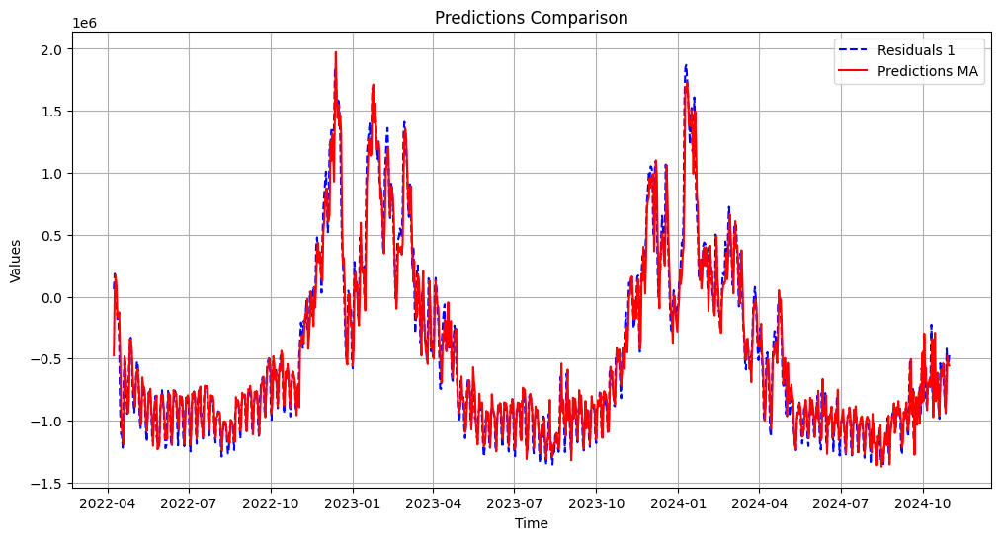

In [29]:
import numpy as np
# Tracer les courbes
plt.figure(figsize=(12, 6))
plt.plot(residuals_1, label="Residuals 1", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle MA
plt.plot(predictions_ma, label="Predictions MA", color='red')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


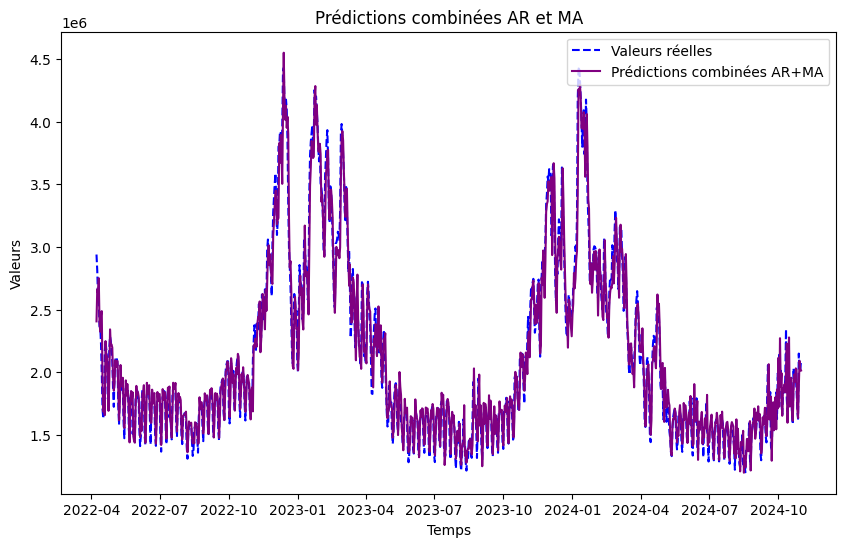

In [30]:
predictions_combined = predictions_1_t + predictions_ma
import numpy as np
# Tracer les données réelles, les prédictions AR, MA, et combinées
plt.figure(figsize=(10, 6))
plt.plot(test_data, label='Valeurs réelles', color='blue', linestyle='dashed')

plt.plot(predictions_combined, label='Prédictions combinées AR+MA', color='purple')
plt.title('Prédictions combinées AR et MA')
plt.xlabel('Temps')
plt.ylabel('Valeurs')
plt.legend()
plt.show()


In [31]:
# Calculer le RMSE des prédictions combinées
rmse_combined = np.sqrt(mean_squared_error(test_data, predictions_combined))
print(f"RMSE des Prédictions combinées AR+MA: {rmse_combined}")

RMSE des Prédictions combinées AR+MA: 141026.83735175978


In [32]:
from sklearn.metrics import r2_score
# Calcul du R²
r2 = r2_score(test_data.values, predictions_combined)

print(f"Coefficient de détermination (R²) : {r2:.4f}")


Coefficient de détermination (R²) : 0.9603


In [33]:
# Recherche par grille pour les paramètres ARIMA
import itertools
def grid_search_arima(train_data, p_values, d_values, q_values):
    best_score, best_cfg = float("inf"), None #initialisation de aic à plus petit float et la conf à none
    for p, d, q in itertools.product(p_values, d_values, q_values): #genere toutes les combinaisons possibles des valeurs de p, d, et q
        try:
            model = ARIMA(train_data, order=(p, d, q))
            model_fit = model.fit()
            aic = model_fit.aic
            if aic < best_score:
                best_score, best_cfg = aic, (p, d, q)
        except:
            continue
    return best_cfg, best_score

In [34]:
# Définir les plages pour p, d, q
p_values = range(0, 6)  # Paramètres pour AR (p)
d_values = range(0, 3)  # Paramètres pour différenciation (d)
q_values = range(0, 6)  # Paramètres pour MA (q)

best_cfg, best_score = grid_search_arima(train_data.values, p_values, d_values, q_values)
print(f"Meilleurs paramètres ARIMA: {best_cfg} avec AIC: {best_score}")

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: Conver

Meilleurs paramètres ARIMA: (5, 1, 5) avec AIC: 100340.61544742764


In [35]:
# Validation par glissement (Walk Forward Validation)
from statsmodels.tsa.arima.model import ARIMA
history = list(train_data.values)
predictions= []
for t in range(len(test_data)):
    model = ARIMA(history, order=best_cfg)  # Utilisation des paramètres optimisés
    model_fit = model.fit()
    yhat = model_fit.forecast()[0]
    predictions.append(yhat)

    history.append(test_data.values[t])  # Mise à jour avec la vraie valeur

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

KeyboardInterrupt: 

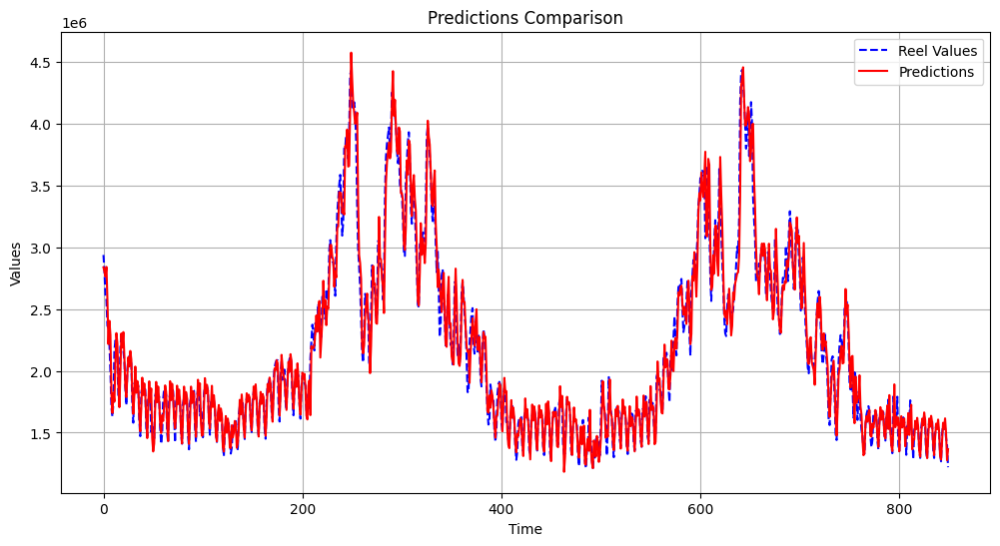

In [37]:
import numpy as np
# Tracer les courbes
plt.figure(figsize=(12, 6))
plt.plot(test_data.values[:850], label="Reel Values", color='blue', linestyle='dashed')

# Courbe des prédictions du modèle MA
plt.plot(predictions[:850], label="Predictions", color='red')

# Ajouter des titres et une légende
plt.title("Predictions Comparison")
plt.xlabel("Time")
plt.ylabel("Values")
plt.legend()
plt.grid()

# Afficher le graphe
plt.show()


In [39]:
from sklearn.metrics import r2_score
# Calcul du R²
r2 = r2_score(test_data.values[:850], predictions[:850])

print(f"Coefficient de détermination (R²) ARIMA : {r2:.4f}")


Coefficient de détermination (R²) ARIMA : 0.9642


In [40]:
# Calculer le RMSE des prédictions combinées
rmse = np.sqrt(mean_squared_error(test_data[:850], predictions[:850]))
print(f"RMSE des Prédictions combinées AR+MA: {rmse}")

RMSE des Prédictions combinées AR+MA: 136772.36258692312


In [43]:
from pandas import DataFrame
data=DataFrame()
data['Reel values']=test_data[:850].values
data['Predictions ARIMA']=predictions[:850]
predictions_combined = predictions[:850]
data['Predictions ARMA']=predictions_combined[:850]
print(data)

     Reel values  Predictions ARIMA  Predictions ARMA
0      2939462.0       2.838845e+06      2.838845e+06
1      2810471.0       2.805766e+06      2.805766e+06
2      2603527.0       2.766429e+06      2.766429e+06
3      2574913.0       2.842412e+06      2.842412e+06
4      2364187.0       2.571559e+06      2.571559e+06
..           ...                ...               ...
845    1571070.0       1.529966e+06      1.529966e+06
846    1539818.0       1.615926e+06      1.615926e+06
847    1459080.0       1.497420e+06      1.497420e+06
848    1401216.0       1.277220e+06      1.277220e+06
849    1220223.0       1.366319e+06      1.366319e+06

[850 rows x 3 columns]


In [46]:
data.to_csv('pred_total.csv',index=False)

# ANN

In [ ]:
X_tc, y_tc = np.array(X), np.array(y)
X_tc.shape

(4323, 365)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, regularizers
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_tc)  # Mise à l'échelle des entrées
y_scaled = scaler.fit_transform(y_tc.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42, shuffle=False)

In [ ]:
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(365,),
                       kernel_regularizer=regularizers.l2(0.001)),  # Régularisation L2
    keras.layers.Dropout(0.1),  # Réduction du Dropout
    keras.layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dense(1)  # Couche de sortie
])
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


109/109 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - loss: 0.1738 - mae: 0.1180 - val_loss: 0.0972 - val_mae: 0.0650
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0883 - mae: 0.0719 - val_loss: 0.0616 - val_mae: 0.0734
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0558 - mae: 0.0668 - val_loss: 0.0386 - val_mae: 0.0537
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0366 - mae: 0.0599 - val_loss: 0.0268 - val_mae: 0.0558
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0251 - mae: 0.0543 - val_loss: 0.0189 - val_mae: 0.0486
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0186 - mae: 0.0510 - val_loss: 0.0150 - val_mae: 0.0480
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0158 - mae: 0.0553 - val_loss: 0.0138 - val_mae: 0.0631
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0127 - mae: 0.0516 - val_loss: 0.0108 - val_mae: 0.0520
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.011

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Prédictions
predictions = model.predict(X_test)

# Calcul des métriques
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = np.sqrt(mse)

print(f"MSE: {mse}")
print(f"R²: {r2}")
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step
MSE: 0.005790504916724108
R²: 0.804248270417311
RMSE: 0.07609536724876297


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0069 - mae: 0.0539
Erreur moyenne absolue : 0.06099691241979599


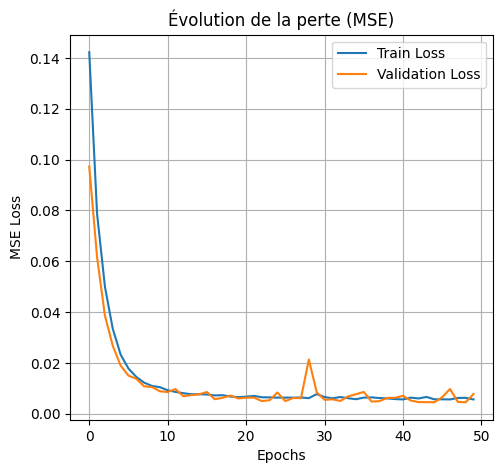

In [ ]:
loss, mae = model.evaluate(X_test, y_test)
print(f"Erreur moyenne absolue : {mae}")
import matplotlib.pyplot as plt

# Récupérer l'historique des pertes
history_dict = history.history

# Tracer la perte (MSE)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Évolution de la perte (MSE)')
plt.legend()
plt.grid()

RMSE (Root Mean Squared Error): 0.07609536724876297


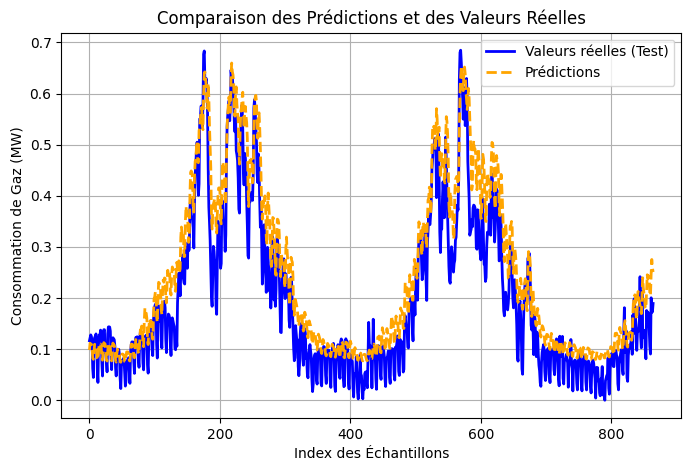

In [ ]:

print("RMSE (Root Mean Squared Error):", rmse)
y_pred_original = scaler.inverse_transform(predictions)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))
plt.figure(figsize=(8, 5))
plt.plot(y_test_original, label="Valeurs réelles (Test)", color="blue", linewidth=2)
plt.plot(y_pred_original, label="Prédictions", color="orange", linestyle="--", linewidth=2)
plt.title("Comparaison des Prédictions et des Valeurs Réelles")
plt.xlabel("Index des Échantillons")
plt.ylabel("Consommation de Gaz (MW)")
plt.legend()
plt.grid(True)
plt.show()

### RNN


In [ ]:
#  Construction du modèle RNN
model = Sequential([
    SimpleRNN(50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], 1)),
    SimpleRNN(50, activation='relu'),
    Dense(1)  # Couche de sortie
])

# Compilation du modèle
model.compile(optimizer='adam', loss='mean_squared_error')

# Affichage du résumé du modèle
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_15 (SimpleRNN)            │ (None, 365, 50)             │           2,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_16 (SimpleRNN)            │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,701 (30.08 KB)

 Trainable params: 7,701 (30.08 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Entraînement du modèle
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 31s 201ms/step - loss: 0.0066 - val_loss: 0.0011
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0013 - val_loss: 8.9541e-04
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0011 - val_loss: 8.5474e-04
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 9.7379e-04 - val_loss: 8.1930e-04
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 19s 178ms/step - loss: 9.3542e-04 - val_loss: 8.1790e-04
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 8.8256e-04 - val_loss: 8.0663e-04
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 7.8859e-04 - val_loss: 8.7114e-04
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 9.1734e-04 - val_loss: 0.0011
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 9.1373e-04 - val_loss: 8.0023e-04
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step -

In [ ]:
# Prédictions
predictions = model.predict(X_test)

# 8️ Évaluation du modèle
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = np.sqrt(mse)

print(f"MSE: {mse}")
print(f"R²: {r2}")
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
MSE: 0.0007137442414527051
R²: 0.96987054308567
RMSE: 0.02671599224159015


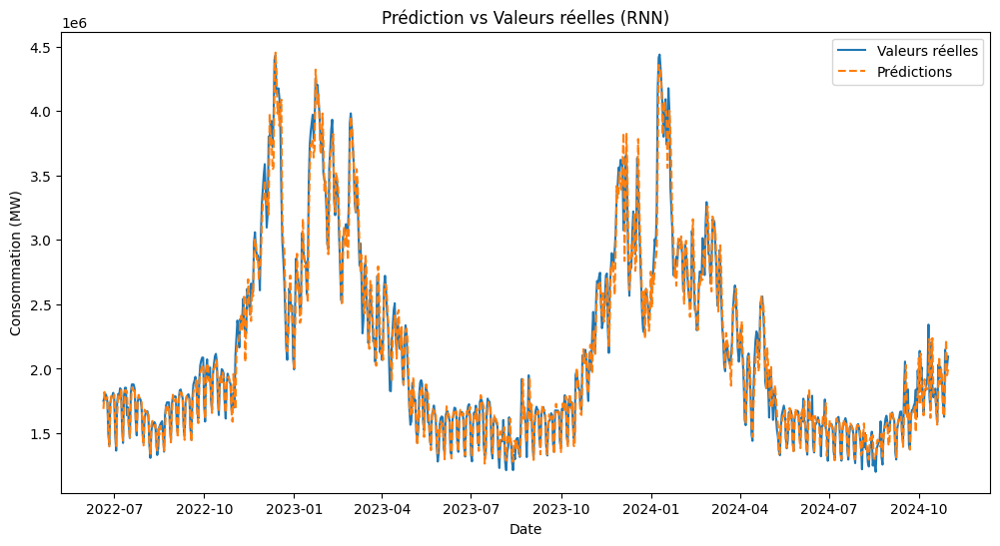

In [ ]:
import matplotlib.pyplot as plt

# Redimensionner y_test et predictions si nécessaire
y_test_reshaped = y_test.reshape(-1, 1)  # Si y_test est 1D
predictions_reshaped = predictions.reshape(-1, 1)  # Si predictions est 1D

# Inverser la transformation du scaler
y_test_inv = scaler.inverse_transform(y_test_reshaped)
predictions_inv = scaler.inverse_transform(predictions_reshaped)

# Tracer les résultats
plt.figure(figsize=(12, 6))
plt.plot(series_total_cons.index[-len(y_test):], y_test_inv, label='Valeurs réelles')
plt.plot(series_total_cons.index[-len(y_test):], predictions_inv, label='Prédictions', linestyle='dashed')
plt.title('Prédiction vs Valeurs réelles (RNN)')
plt.xlabel('Date')
plt.ylabel('Consommation (MW)')
plt.legend()
plt.show()

###**LSTM**

In [ ]:
from tensorflow import keras
from tensorflow.keras import Sequential

In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    #keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform"),
    #keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='mse') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - loss: 0.0361 - val_loss: 0.0042
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0053 - val_loss: 0.0035
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0044 - val_loss: 0.0031
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - loss: 0.0040 - val_loss: 0.0028
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0039 - val_loss: 0.0026
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0037 - val_loss: 0.0024
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0036 - val_loss: 0.0022
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0032 - val_loss: 0.0021
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.0031 - val_loss: 0.0021
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0030 - val_loss: 0.0020
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0029 - val_loss: 0.0020
Epoch 12/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 

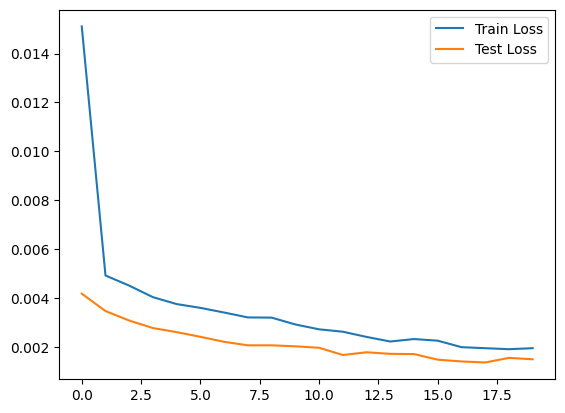

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
MSE: 0.0014903729534028747
RMSE: 0.03860534876675607
R2 Score: 0.937086528930251


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


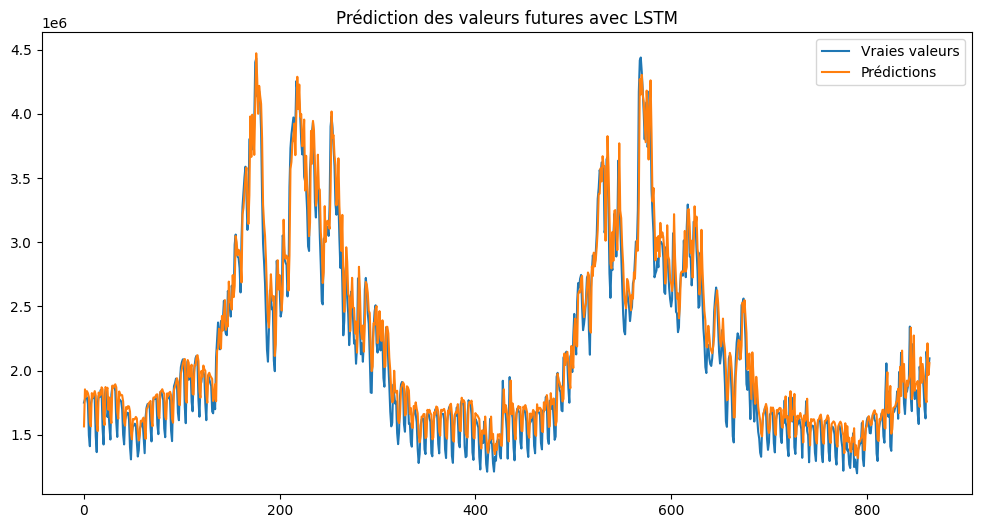

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    #keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform"),
    #keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - loss: 0.0166 - val_loss: 0.0019
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.0024 - val_loss: 0.0016
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0022 - val_loss: 0.0014
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0020 - val_loss: 0.0013
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0015 - val_loss: 0.0010
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0015 - val_loss: 8.9976e-04
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0013 - val_loss: 8.4364e-04
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 12/20
109/109 ━━━━━━━━━━━━━

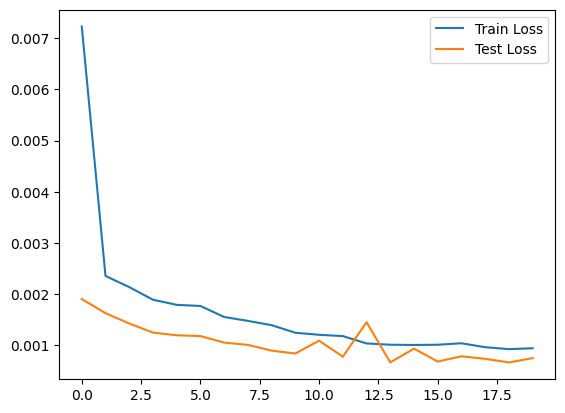

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
MSE: 0.0015070173473953675
RMSE: 0.038820321320094296
R2 Score: 0.9363839151331278


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


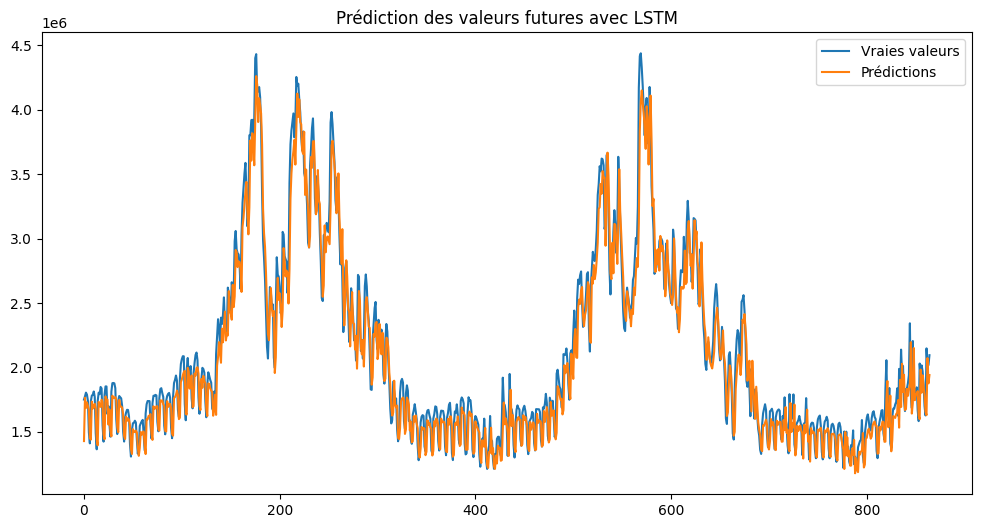

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 26s 175ms/step - loss: 0.0158 - val_loss: 0.0033
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.0036 - val_loss: 0.0030
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - loss: 0.0033 - val_loss: 0.0025
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.0031 - val_loss: 0.0020
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0027 - val_loss: 0.0015
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0023 - val_loss: 0.0016
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 10/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 0.0016 - val_loss: 9.5762e-04
Epoch 11/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0011 - val_loss: 8.6508e-04
Epoch 12/50

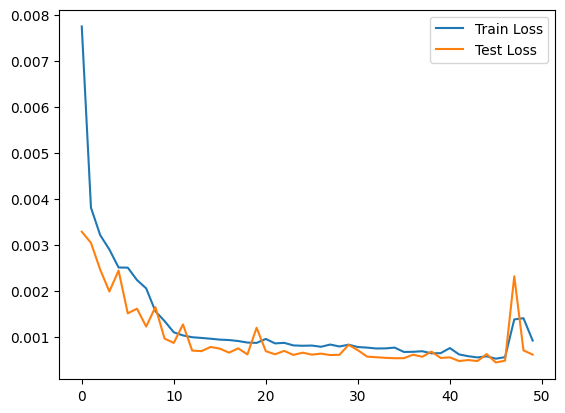

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step
MSE: 0.0012208619302475651
RMSE: 0.03494083471022931
R2 Score: 0.9484634624149508


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step


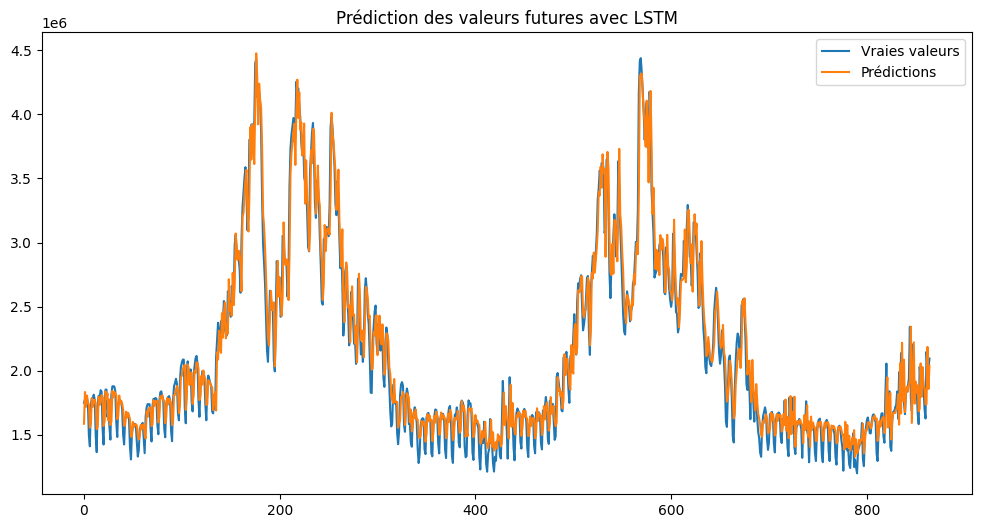

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


###Series after MAS

In [ ]:
series_total_cons_mas = pd.Series([np.nan] * window + pred, index=series_total_cons.index, name=series_total_cons.name)
series_total_cons_mas

,Consommation brute totale (MW)
Date - Heure,
2012-01-01,NaN
2012-01-02,NaN
2012-01-03,NaN
2012-01-04,NaN
2012-01-05,NaN
...,...
2024-10-27,1.868922e+06
2024-10-28,1.865409e+06
2024-10-29,1.875745e+06


In [ ]:
series_total_cons_mas.isna().sum()

30

In [ ]:
series_total_cons_mas = series_total_cons_mas[30:]
series_total_cons_mas

,Consommation brute totale (MW)
Date - Heure,
2012-01-31,3.777951e+06
2012-02-01,3.848653e+06
2012-02-02,3.911662e+06
2012-02-03,3.974512e+06
2012-02-04,4.042224e+06
...,...
2024-10-27,1.868922e+06
2024-10-28,1.865409e+06
2024-10-29,1.875745e+06


In [ ]:
from sklearn.preprocessing import MinMaxScaler


data = pd.DataFrame(series_total_cons_mas)

# Normalisation des données
scaler = MinMaxScaler()
data['Consommation brute totale (MW)'] = scaler.fit_transform(data[['Consommation brute totale (MW)']])
data.head()

,Consommation brute totale (MW)
Date - Heure,
2012-01-31,0.710109
2012-02-01,0.731112
2012-02-02,0.749830
2012-02-03,0.768500
2012-02-04,0.788615


In [ ]:
def create_sequences(data, window_size):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i + window_size])
        y.append(data[i + window_size])
    return np.array(X), np.array(y)

window_size = 365  # Taille de la fenêtre (ajustable)
X, y = create_sequences(data['Consommation brute totale (MW)'].values, window_size)

In [ ]:
# Reshape pour RNN, LSTM, GRU (ajout de la dimension feature)
X_dl = X.reshape((X.shape[0], X.shape[1], 1))

In [ ]:
lenght_train = 0.8*len(X_dl)
X_train, y_train = X_dl[:int(lenght_train)], y[:int(lenght_train)]
X_test, y_test = X_dl[int(lenght_train):], y[int(lenght_train):]


In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='relu', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='relu', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres

history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - loss: 0.0304 - val_loss: 6.7173e-04
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 32s 128ms/step - loss: 4.3154e-04 - val_loss: 5.4533e-04
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 4.4616e-04 - val_loss: 3.8841e-04
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 3.2259e-04 - val_loss: 3.4945e-04
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - loss: 2.1031e-04 - val_loss: 4.0086e-04
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 21s 133ms/step - loss: 2.0255e-04 - val_loss: 1.7771e-04
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - loss: 1.2935e-04 - val_loss: 1.4413e-04
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 8.6979e-05 - val_loss: 9.0249e-05
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - loss: 6.3520e-05 - val_loss: 1.0800e-04
Epoch 10/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 14s 133ms/step - loss: 7.3554e-05 - val_loss: 7.9765e-05
Epoch 11/50
108/108 ━━━━━━━━━━━━━

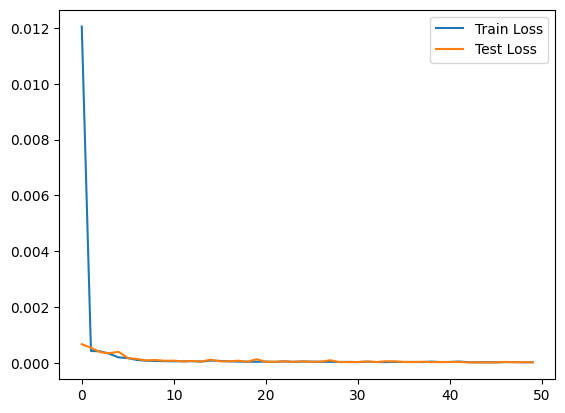

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step
MSE: 3.5931212394355046e-05
RMSE: 0.0059942649586379685
R2 Score: 0.9990617664357353


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step


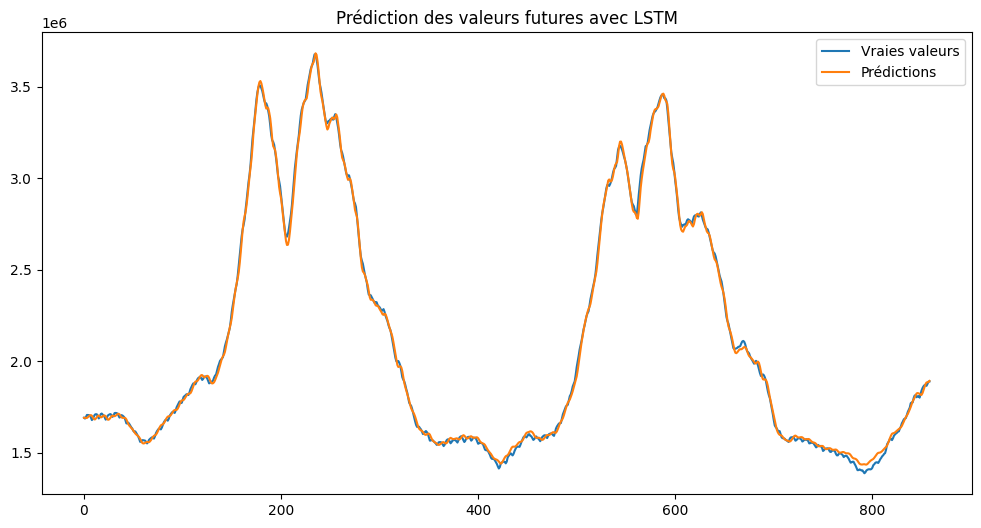

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


### ** Consommation brute totale with features of consomation brute of gaz and electricite **

In [ ]:
data_total_with_fetures = df[['Date - Heure', 'Consommation brute gaz totale (MW PCS 0°C)', 'Consommation brute électricité (MW) - RTE', 'Consommation brute totale (MW)']]
data_total_with_fetures.head()

,Date - Heure,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW)
0,2024-10-31 23:00:00,32732.0,47753.0,80485.0
1,2024-10-31 22:00:00,35541.0,47498.0,83039.0
2,2024-10-31 21:00:00,39770.0,47832.0,87602.0
3,2024-10-31 20:00:00,42652.0,50389.0,93041.0
4,2024-10-31 19:00:00,43751.0,53387.0,97138.0


In [ ]:
data_total_with_fetures["Date - Heure"] = pd.to_datetime(data_total_with_fetures["Date - Heure"])
data_total_with_fetures.set_index('Date - Heure', inplace=True)  # Définir comme index
data_total_with_fetures.head()

<ipython-input-56-bc0417d4a0f7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_total_with_fetures["Date - Heure"] = pd.to_datetime(data_total_with_fetures["Date - Heure"])


,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW)
Date - Heure,,,
2024-10-31 23:00:00,32732.0,47753.0,80485.0
2024-10-31 22:00:00,35541.0,47498.0,83039.0
2024-10-31 21:00:00,39770.0,47832.0,87602.0
2024-10-31 20:00:00,42652.0,50389.0,93041.0
2024-10-31 19:00:00,43751.0,53387.0,97138.0


In [ ]:
data_total_with_fetures.isna().sum()

,0
Consommation brute gaz totale (MW PCS 0°C),101
Consommation brute électricité (MW) - RTE,3
Consommation brute totale (MW),101


In [ ]:
data_total_with_fetures = data_total_with_fetures.interpolate(method='linear', axis=0)
data_total_with_fetures.isna().sum()

,0
Consommation brute gaz totale (MW PCS 0°C),0
Consommation brute électricité (MW) - RTE,0
Consommation brute totale (MW),0


In [ ]:
data_total_with_fetures = data_total_with_fetures.resample('D').sum()
data_total_with_fetures

,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,Consommation brute totale (MW)
Date - Heure,,,
2012-01-01,1446815.0,1237536.0,2684351.0
2012-01-02,1791945.0,1453549.0,3245494.0
2012-01-03,2005753.0,1625894.0,3631647.0
2012-01-04,1997598.0,1632020.0,3629618.0
2012-01-05,2038430.0,1660291.0,3698721.0
...,...,...,...
2024-10-27,641222.0,986420.0,1627642.0
2024-10-28,1024206.0,1123980.0,2148186.0
2024-10-29,855905.0,1156473.0,2012378.0


# ANN

In [ ]:
n_lags = 365

# Ajouter les lags de la colonne "Total_total"
for i in range(1, n_lags + 1):
    data_total_with_fetures[f"lag_{i}"] = data_total_with_fetures["Consommation brute totale (MW)"].shift(i)

# Supprimer les premières lignes avec NaN (car les premiers lags seront vides)
data_total_with_fetures.dropna(inplace=True)

data_total_with_fetures.shape

<ipython-input-120-b631c84e23c9>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_total_with_fetures[f"lag_{i}"] = data_total_with_fetures["Consommation brute totale (MW)"].shift(i)
<ipython-input-120-b631c84e23c9>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_total_with_fetures[f"lag_{i}"] = data_total_with_fetures["Consommation brute totale (MW)"].shift(i)
<ipython-input-120-b631c84e23c9>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which 

(4323, 368)

In [ ]:
features = ["Consommation brute gaz totale (MW PCS 0°C)", "Consommation brute électricité (MW) - RTE"] + [f"lag_{i}" for i in range(1, n_lags + 1)]
X_t = data_total_with_fetures[features].values

# Définir la target (Total_total)
y_t = data_total_with_fetures["Consommation brute totale (MW)"].values

In [ ]:
X_t.shape

(4323, 367)

In [ ]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X_t)  # Mise à l'échelle des entrées
y_scaled = scaler.fit_transform(y_t.reshape(-1, 1))

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42, shuffle=False)

In [ ]:
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(367,),
                       kernel_regularizer=regularizers.l2(0.001)),  # Régularisation L2
    keras.layers.Dropout(0.1),  # Réduction du Dropout
    keras.layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    keras.layers.Dense(1)  # Couche de sortie
])
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1889 - mae: 0.1352 - val_loss: 0.1058 - val_mae: 0.0518
Epoch 2/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0998 - mae: 0.0693 - val_loss: 0.0713 - val_mae: 0.0516
Epoch 3/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0677 - mae: 0.0591 - val_loss: 0.0498 - val_mae: 0.0455
Epoch 4/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0490 - mae: 0.0574 - val_loss: 0.0371 - val_mae: 0.0507
Epoch 5/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0353 - mae: 0.0482 - val_loss: 0.0278 - val_mae: 0.0484
Epoch 6/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0265 - mae: 0.0452 - val_loss: 0.0217 - val_mae: 0.0487
Epoch 7/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0204 - mae: 0.0429 - val_loss: 0.0164 - val_mae: 0.0418
Epoch 8/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0160 - mae: 0.0402 - val_loss: 0.0132 - val_mae: 0.0407
Epoch 9/50
109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.013

In [ ]:
# Prédictions
predictions = model.predict(X_test)

# 8️ Évaluation du modèle
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = np.sqrt(mse)

print(f"MSE: {mse}")
print(f"R²: {r2}")
print(f"RMSE: {rmse}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
MSE: 0.0016229636625638385
R²: 0.9451346733029872
RMSE: 0.0402860231664015


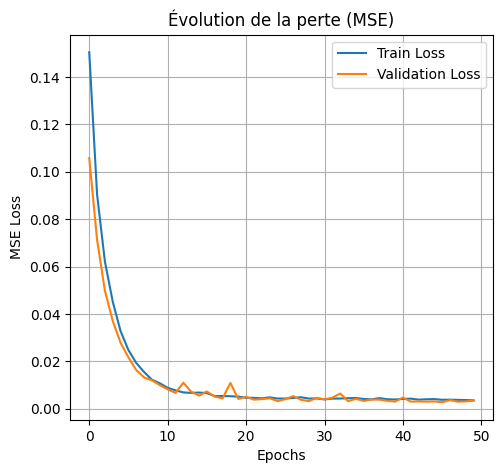

In [ ]:

import matplotlib.pyplot as plt

# Récupérer l'historique des pertes
history_dict = history.history

# Tracer la perte (MSE)
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Évolution de la perte (MSE)')
plt.legend()
plt.grid()

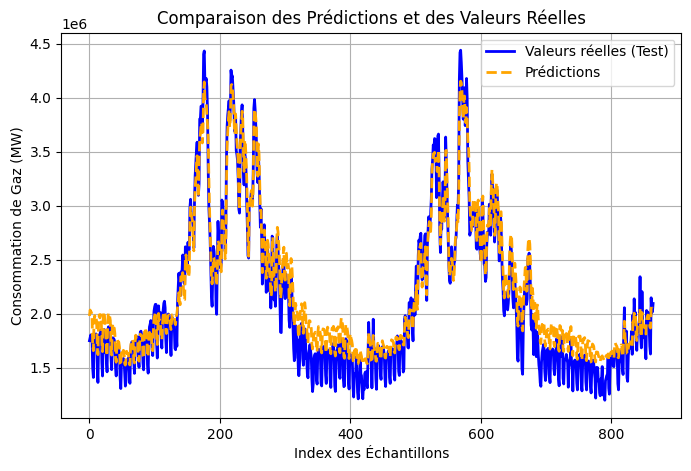

In [ ]:
y_pred_original = scaler.inverse_transform(predictions)
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))
plt.figure(figsize=(8, 5))
plt.plot(y_test_original, label="Valeurs réelles (Test)", color="blue", linewidth=2)
plt.plot(y_pred_original, label="Prédictions", color="orange", linestyle="--", linewidth=2)
plt.title("Comparaison des Prédictions et des Valeurs Réelles")
plt.xlabel("Index des Échantillons")
plt.ylabel("Consommation de Gaz (MW)")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                     │ (None, 64)                  │          23,552 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 78,533 (306.77 KB)

 Trainable params: 26,177 (102.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 52,356 (204.52 KB)

In [ ]:
data_total_with_fetures_subset = data_total_with_fetures.tail(len(y_test_original.flatten()))

# Créer un DataFrame en utilisant l'index pour les dates
df_results = pd.DataFrame({
    'Date': data_total_with_fetures_subset.index,  # Dates de l'index
    'Consommation Réelle': y_test_original.flatten(),
    'Prédiction ANN': y_pred_original.flatten()
})

# Vérifier les premiers résultats
df_results.head()
df_results.to_csv("predictions_keras.csv", index=False)

print("Fichier CSV des prédictions sauvegardé avec succès !")


Fichier CSV des prédictions sauvegardé avec succès !


##### RNN


In [ ]:
# 3️ Normalisation des données
scaler = MinMaxScaler(feature_range=(0, 1))
data_total_scaled = scaler.fit_transform(data_total_with_fetures.values)

# 4️ Création des séquences pour RNN
X, y = [], []
window_size = 365  # Fenêtre de 1 an

for i in range(len(data_total_scaled) - window_size):
    X.append(data_total_scaled[i:i+window_size])  # Séquence d'entrée (toutes les features)
    y.append(data_total_scaled[i+window_size, 2])  # Valeur cible : Consommation brute électricité (MW) - RTE (3ème feature)

X, y = np.array(X), np.array(y)

# 5️ Reshape pour le RNN
X = X.reshape((X.shape[0], X.shape[1], X.shape[2]))  # Ajout de la dimension feature

# 6️ Division des données en entraînement (80%) et test (20%)
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

In [ ]:
# Construction du modèle RNN
model = Sequential([
    SimpleRNN(50, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    SimpleRNN(50, activation='relu'),
    Dense(1)  # Couche de sortie (prédiction de la consommation d'électricité)
])

# Compilation du modèle
model.compile(optimizer='adam', loss='mean_squared_error')

# Affichage du résumé du modèle
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_17 (SimpleRNN)            │ (None, 365, 50)             │           2,700 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_18 (SimpleRNN)            │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,801 (30.47 KB)

 Trainable params: 7,801 (30.47 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 42s 343ms/step - loss: 0.0302 - val_loss: 0.0014
Epoch 2/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 26s 201ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 3/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 39s 181ms/step - loss: 0.0012 - val_loss: 9.6393e-04
Epoch 4/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 5/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 23s 177ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 6/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0012 - val_loss: 8.9184e-04
Epoch 7/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 22s 175ms/step - loss: 0.0010 - val_loss: 8.3836e-04
Epoch 8/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 9.2007e-04 - val_loss: 0.0011
Epoch 9/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - loss: 0.0010 - val_loss: 9.6841e-04
Epoch 10/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 20s 170ms/step - loss: 9.2694e-04 - val_loss: 0.0010
Epoch 11/20
109/109 ━━━━━━━━━━━━━━━━━━━━ 21s 178ms/step - loss: 0.0010 - val_loss: 8.

In [ ]:
# Prédictions
predictions = model.predict(X_test)

#  Évaluation du modèle
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
rmse = np.sqrt(mse)

print(f"MSE: {mse}")
print(f"R²: {r2}")
print(f"RMSE: {rmse}")


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
MSE: 0.0008571776861020589
R²: 0.963815752672453
RMSE: 0.029277597000130644


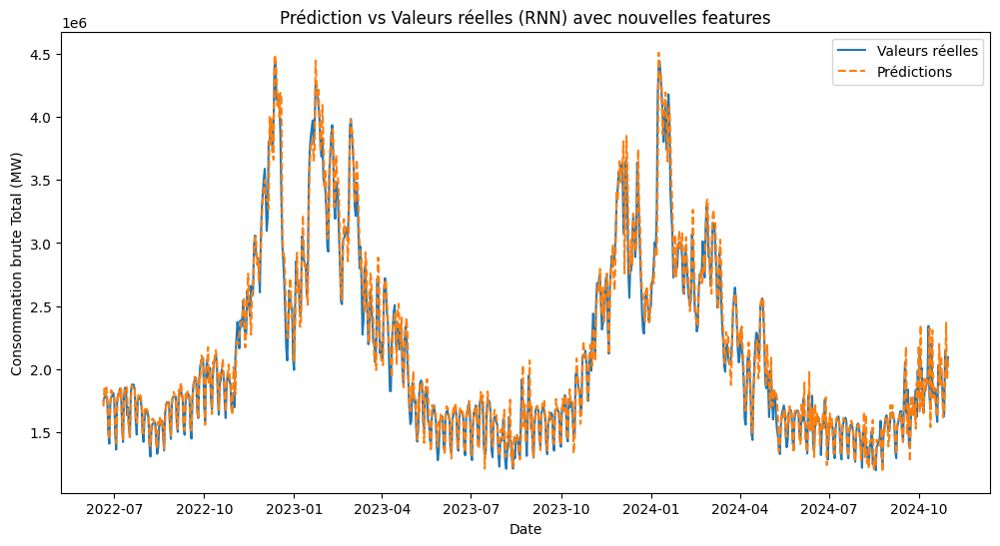

In [ ]:
plt.figure(figsize=(12, 6))

# Inverse transform the predictions to the original scale
inverse_transformed_predictions = scaler.inverse_transform(
    np.concatenate(
        [
            np.zeros((len(predictions), 2)),  # Placeholder for the first 2 features
            predictions.reshape(-1, 1),      # Your predictions for the 3rd feature
        ],
        axis=1
    )
)[:, 2]  # Select only the 3rd feature (your target variable)


# Plot the real values
plt.plot(data_total_with_fetures.index[-len(y_test):],
         data_total_with_fetures.iloc[-len(y_test):, 2].values,
         label='Valeurs réelles')

# Plot the predictions
plt.plot(data_total_with_fetures.index[-len(y_test):],
         inverse_transformed_predictions,
         label='Prédictions', linestyle='dashed')

plt.title('Prédiction vs Valeurs réelles (RNN) avec nouvelles features')
plt.xlabel('Date')
plt.ylabel('Consommation brute Total (MW)')
plt.legend()
plt.show()

##### Lags

In [ ]:
# Nombre de lags
n_lags = 365

# Ajouter les lags de la colonne "Total_total"
for i in range(1, n_lags + 1):
    data_total_with_fetures[f"lag_{i}"] = data_total_with_fetures["Consommation brute totale (MW)"].shift(i)

# Supprimer les premières lignes avec NaN (car les premiers lags seront vides)
data_total_with_fetures.dropna(inplace=True)

data_total_with_fetures.shape

<ipython-input-24-1092e27cee51>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_total_with_fetures[f"lag_{i}"] = data_total_with_fetures["Consommation brute totale (MW)"].shift(i)
<ipython-input-24-1092e27cee51>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_total_with_fetures[f"lag_{i}"] = data_total_with_fetures["Consommation brute totale (MW)"].shift(i)
<ipython-input-24-1092e27cee51>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has

(4323, 368)

In [ ]:
# Définir les features (les 2 premières colonnes + les 30 lags)
features = ["Consommation brute gaz totale (MW PCS 0°C)", "Consommation brute électricité (MW) - RTE"] + [f"lag_{i}" for i in range(1, n_lags + 1)]
X_t = data_total_with_fetures[features]

# Définir la target (Total_total)
y_t = data_total_with_fetures["Consommation brute totale (MW)"]
X_t

,Consommation brute gaz totale (MW PCS 0°C),Consommation brute électricité (MW) - RTE,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,...,lag_356,lag_357,lag_358,lag_359,lag_360,lag_361,lag_362,lag_363,lag_364,lag_365
Date - Heure,,,,,,,,,,,,,,,,,,,,,
2012-12-31,1690179.0,1397005.0,2943254.0,2903632.0,3079887.0,3087396.0,2999331.0,2651008.0,2820931.0,2746436.0,...,3746719.0,3722588.0,3225614.0,3431422.0,3768056.0,3698721.0,3629618.0,3631647.0,3245494.0,2684351.0
2013-01-01,1658511.0,1309430.0,3087184.0,2943254.0,2903632.0,3079887.0,3087396.0,2999331.0,2651008.0,2820931.0,...,3788846.0,3746719.0,3722588.0,3225614.0,3431422.0,3768056.0,3698721.0,3629618.0,3631647.0,3245494.0
2013-01-02,1947763.0,1546453.0,2967941.0,3087184.0,2943254.0,2903632.0,3079887.0,3087396.0,2999331.0,2651008.0,...,3969267.0,3788846.0,3746719.0,3722588.0,3225614.0,3431422.0,3768056.0,3698721.0,3629618.0,3631647.0
2013-01-03,1936286.0,1599661.0,3494216.0,2967941.0,3087184.0,2943254.0,2903632.0,3079887.0,3087396.0,2999331.0,...,4001885.0,3969267.0,3788846.0,3746719.0,3722588.0,3225614.0,3431422.0,3768056.0,3698721.0,3629618.0
2013-01-04,1844629.0,1565948.0,3535947.0,3494216.0,2967941.0,3087184.0,2943254.0,2903632.0,3079887.0,3087396.0,...,3897694.0,4001885.0,3969267.0,3788846.0,3746719.0,3722588.0,3225614.0,3431422.0,3768056.0,3698721.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-27,641222.0,986420.0,1699000.0,1864009.0,1971999.0,2016371.0,1928230.0,2030545.0,1583676.0,1665570.0,...,2538386.0,2125899.0,2224984.0,2441390.0,2263566.0,1988729.0,2133059.0,2109110.0,1749811.0,1864909.0
2024-10-28,1024206.0,1123980.0,1627642.0,1699000.0,1864009.0,1971999.0,2016371.0,1928230.0,2030545.0,1583676.0,...,2681577.0,2538386.0,2125899.0,2224984.0,2441390.0,2263566.0,1988729.0,2133059.0,2109110.0,1749811.0
2024-10-29,855905.0,1156473.0,2148186.0,1627642.0,1699000.0,1864009.0,1971999.0,2016371.0,1928230.0,2030545.0,...,2647752.0,2681577.0,2538386.0,2125899.0,2224984.0,2441390.0,2263566.0,1988729.0,2133059.0,2109110.0


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Normalisation des données ***after feature and target selection***
scaler = MinMaxScaler()
X_t = scaler.fit_transform(X_t) # Scale only the features
y_t = scaler.fit_transform(y_t.values[:, None])


NameError: name 'X_t' is not defined

In [ ]:
X_t

array([[0.46473109, 0.4218565 , 0.41182702, ..., 0.51282834, 0.43096182,
        0.31199647],
       [0.45408019, 0.3546891 , 0.44583581, ..., 0.51239818, 0.51282834,
        0.43096182],
       [0.55136432, 0.53647863, 0.41766023, ..., 0.52704839, 0.51239818,
        0.51282834],
       ...,
       [0.18413968, 0.23737567, 0.22396276, ..., 0.16452085, 0.19511959,
        0.19004228],
       [0.1838232 , 0.24266623, 0.1918731 , ..., 0.22278778, 0.16452085,
        0.19511959],
       [0.20849805, 0.24541582, 0.19328066, ..., 0.26048743, 0.22278778,
        0.16452085]])

In [ ]:
X_t.shape

(4323, 367)

In [ ]:
# for DL models without ANN
X_dl_t = X_t.reshape((X_t.shape[0], X_t.shape[1], 1))

In [ ]:
X_dl_t.shape

(4323, 367, 1)

In [ ]:
lenght_train = 0.8*len(X_dl_t)
X_train, y_train = X_dl_t[:int(lenght_train)], y_t[:int(lenght_train)]
X_test, y_test = X_dl_t[int(lenght_train):], y_t[int(lenght_train):]


In [ ]:
X_train.shape

(3458, 367, 1)

In [ ]:
y_train.shape

(3458, 1)

In [ ]:
X_test.shape, y_test.shape

((865, 367, 1), (835,))

###**LSTM**

In [ ]:
from tensorflow import keras
from tensorflow.keras import Sequential

In [ ]:
model_lstm = keras.Sequential([
    keras.Input(shape=(X_train.shape[1], 1)),
    keras.layers.LSTM(300, activation='tanh', kernel_initializer="glorot_uniform", return_sequences=True), # By default, an LSTM layer only returns the output of the last timestep, resulting in a 2D output. To feed the output of the first LSTM layer to the second LSTM layer, you need to set return_sequences=True in the first LSTM layer to make it output a 3D sequence of all timesteps
    keras.layers.LSTM(100, activation='tanh', kernel_initializer="glorot_uniform", return_sequences=True),
    keras.layers.LSTM(50, activation='tanh', kernel_initializer="glorot_uniform"),
    keras.layers.Dense(1, activation='linear')
])

#optimizer = Adam(learning_rate=0.1)  # Au lieu de 0.001 par défaut
model_lstm.compile(optimizer='adam', loss='huber') # mieux adapter au series qui contient beacoup d'outlieres


history = model_lstm.fit(X_train, y_train, epochs=40, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.0116 - val_loss: 0.0105
Epoch 2/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 0.0077 - val_loss: 0.0051
Epoch 3/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - loss: 0.0066 - val_loss: 0.0040
Epoch 4/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - loss: 0.0063 - val_loss: 0.0038
Epoch 5/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - loss: 0.0058 - val_loss: 0.0038
Epoch 6/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - loss: 0.0065 - val_loss: 0.0044
Epoch 7/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.0055 - val_loss: 0.0041
Epoch 8/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 0.0053 - val_loss: 0.0046
Epoch 9/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - loss: 0.0054 - val_loss: 0.0057
Epoch 10/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - loss: 0.0051 - val_loss: 0.0050
Epoch 11/40
109/109 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - loss: 0.0052 - val_loss: 0.0036
Epoch 12/40
109/109 ━━━━━━━━━━━━━━

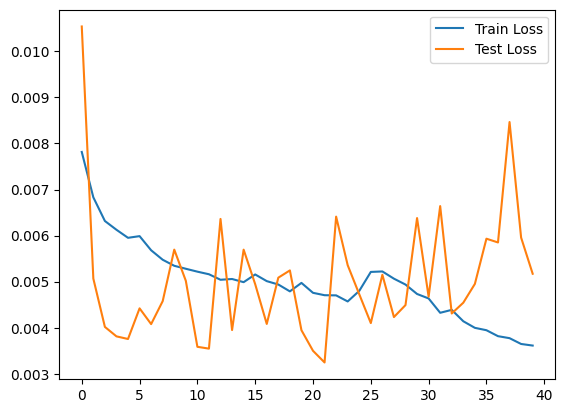

In [ ]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
# 1. Obtenir les prédictions
y_pred = model_lstm.predict(X_test)
#y_pred_rescaled = scaler.inverse_transform(y_pred)
#y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# 2. Calculer MSE (Mean Squared Error)
mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

# 3. Calculer RMSE (Root Mean Squared Error)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse}")

r2_score = r2_score(y_test, y_pred)
print(f"R2 Score: {r2_score}")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
MSE: 0.010343527691163259
RMSE: 0.10170313510980504
R2 Score: 0.6503304177009273


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step


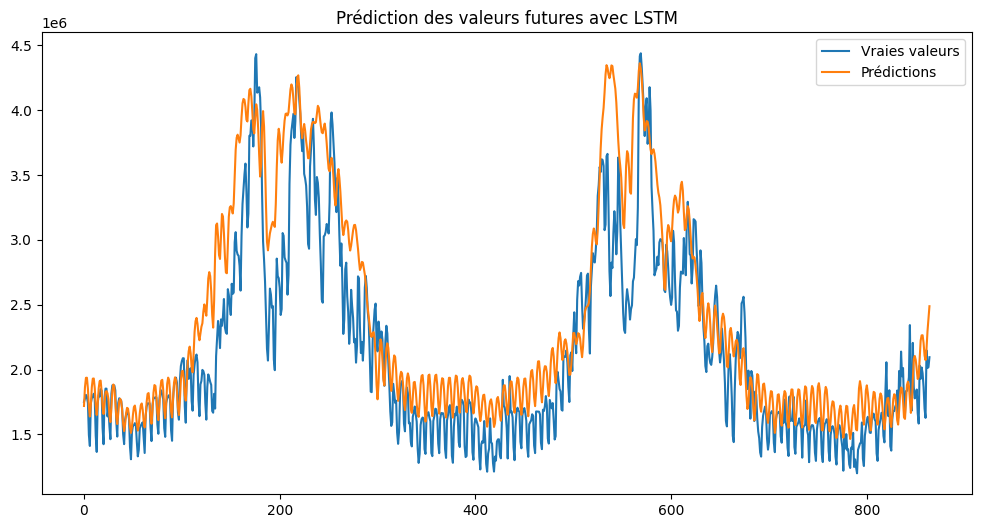

In [ ]:
# Prédictions
y_pred = model_lstm.predict(X_test)
y_pred_rescaled = scaler.inverse_transform(y_pred)
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Affichage des résultats
plt.figure(figsize=(12, 6))
plt.plot(y_test_rescaled, label='Vraies valeurs')
plt.plot(y_pred_rescaled, label='Prédictions')
plt.legend()
plt.title("Prédiction des valeurs futures avec LSTM")
plt.show()


# GRU

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


109/109 ━━━━━━━━━━━━━━━━━━━━ 107s 954ms/step - loss: 0.0196 - val_loss: 0.0030
Epoch 2/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 136s 902ms/step - loss: 0.0044 - val_loss: 0.0023
Epoch 3/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 136s 844ms/step - loss: 0.0033 - val_loss: 0.0014
Epoch 4/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 144s 860ms/step - loss: 0.0022 - val_loss: 0.0014
Epoch 5/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 135s 794ms/step - loss: 0.0020 - val_loss: 0.0015
Epoch 6/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 148s 854ms/step - loss: 0.0020 - val_loss: 0.0016
Epoch 7/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 142s 857ms/step - loss: 0.0021 - val_loss: 0.0013
Epoch 8/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - loss: 0.0019 - val_loss: 0.0013
Epoch 9/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 134s 1s/step - loss: 0.0019 - val_loss: 0.0013
Epoch 10/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - loss: 0.0018 - val_loss: 0.0011
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 184ms/step


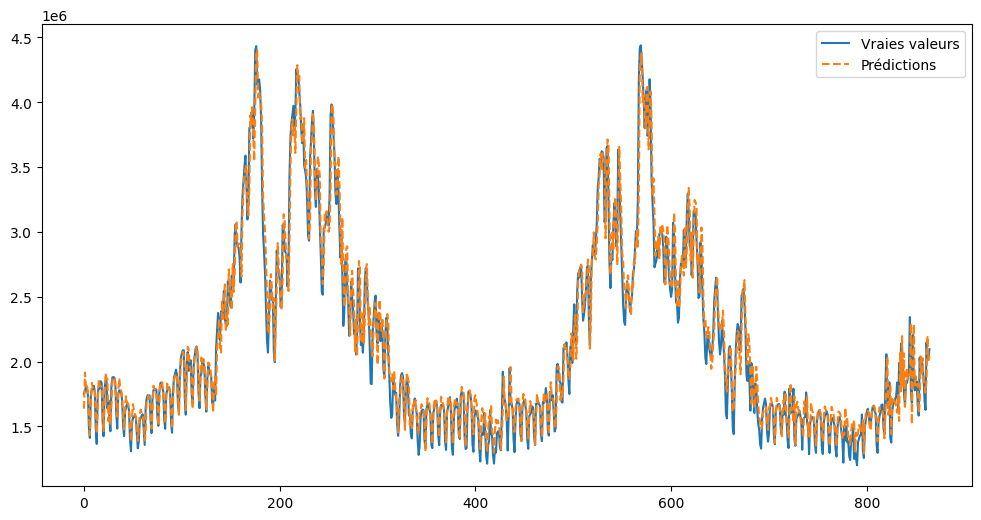

RMSE: 157440.05982462858
R² Score: 0.9532157783339557


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dropout


scaler = MinMaxScaler()

series_total_cons = scaler.fit_transform(data_total_with_fetures[['Consommation brute totale (MW)']].values.reshape(-1, 1))

X, y = [], []
window_size = 365
for i in range(len(series_total_cons) - window_size):
    X.append(series_total_cons[i:i+window_size])
    y.append(series_total_cons[i+window_size])
X, y = np.array(X), np.array(y)

X_dl = X.reshape((X.shape[0], X.shape[1], 1))
test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(X_dl, y, test_size=test_size, shuffle=False)
model_gru2 = Sequential([
    GRU(150, activation='tanh', return_sequences=True, input_shape=(window_size, 1)),
    Dropout(0.2),
    GRU(100, activation='relu', return_sequences=True),

    GRU(50, activation='tanh'),

    Dense(1)
])

model_gru2.compile(optimizer='adam', loss='mse')

model_gru2.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))


predictions2 = model_gru2.predict(X_test)

predictions_inv2 = scaler.inverse_transform(predictions2)
y_inv2 = scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_inv2, label='Vraies valeurs')
plt.plot(predictions_inv2, label='Prédictions', linestyle='dashed')
plt.legend()
plt.show()
rmse2 = np.sqrt(mean_squared_error(y_inv2, predictions_inv2))
print(f'RMSE: {rmse2}')
r2 = r2_score(y_inv2, predictions_inv2)
print(f'R² Score: {r2}')
#RMSE: 157440.05982462858 R² Score: 0.9532157783339557

In [ ]:
data_total_with_fetures_subset = data_total_with_fetures.tail(len(y_inv2.flatten()))

df_results = pd.DataFrame({
    'Date': data_total_with_fetures_subset.index,  # Dates de l'index
    'Consommation Réelle': y_inv2.flatten(),
    'Prédiction GRU': predictions_inv2.flatten()
})

df_results.to_csv("predictions_gru.csv", index=False)
print("Fichier CSV des prédictions sauvegardé avec succès !")

✅ Fichier CSV des prédictions sauvegardé avec succès !
